XGBoost model to predict streamflow. Forcings are aggregated from hourly to daily to match streamflow resolution. Cross-validation to obtain more reliable NSE estimates.

In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../..')
import os
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn import model_selection
from sklearn import metrics
from datetime import datetime, timedelta
import hydroeval
import netCDF4 as nc
import xgboost as xgb
import scipy as sp
import pickle
from src import load_data, evaluate

np.random.seed(0)

time_stamp = datetime.now().strftime('%Y%m%d-%H%M%S')
time_stamp

'20190815-125408'

In [2]:
station_data_dict = load_data.load_train_test_gridded_aggregatedForcings(include_all_forcing_vars=True)

Station 04214500 had NA streamflow values
Station 02GC018 had NA streamflow values
Station 02GG013 had NA streamflow values


Test: 2010-01-09 00:00:00 - 2010-12-31
02GA010
Shapes: train (1323, 1646), val (146, 1646), test (357, 1646)
XGBRegressor(base_score=0.5, booster='gbtree',
             colsample_bylevel=0.40887264618382646,
             colsample_bytree=0.5104526368418408, gamma=0.45420415837476136,
             importance_type='gain', learning_rate=0.2658514371722699,
             max_delta_step=0, max_depth=7, min_child_weight=11, missing=nan,
             n_estimators=1000, n_jobs=-1, nthread=None, objective='reg:linear',
             random_state=123, reg_alpha=25.220571096776126,
             reg_lambda=15.33642641307088, scale_pos_weight=1, seed=None,
             silent=True, subsample=0.880163427403828)
[0]	validation_0-rmse:20.4056	validation_1-rmse:22.0989
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:18.182	validation_1-rmse:20.6537
[2]	validation_0-rmse:16

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[5]	validation_0-rmse:12.8094	validation_1-rmse:17.3498
[6]	validation_0-rmse:12.0051	validation_1-rmse:17.1875
[7]	validation_0-rmse:11.1739	validation_1-rmse:17.059
[8]	validation_0-rmse:10.5208	validation_1-rmse:16.6044
[9]	validation_0-rmse:9.94542	validation_1-rmse:16.6756
[10]	validation_0-rmse:9.45411	validation_1-rmse:16.5677
[11]	validation_0-rmse:9.03389	validation_1-rmse:16.4867
[12]	validation_0-rmse:8.62752	validation_1-rmse:16.5518
[13]	validation_0-rmse:8.21674	validation_1-rmse:16.5872
[14]	validation_0-rmse:7.85182	validation_1-rmse:16.5886
[15]	validation_0-rmse:7.49822	validation_1-rmse:16.551
[16]	validation_0-rmse:7.18085	validation_1-rmse:16.4882
[17]	validation_0-rmse:6.91593	validation_1-rmse:16.5328
[18]	validation_0-rmse:6.70253	validation_1-rmse:16.4496
[19]	validation_0-rmse:6.52101	validation_1-rmse:16.3766
[20]	validation_0-rmse:6.22223	validation_1-rmse:16.2304
[21]	validation_0-rmse:6.02875	validation_1-rmse:16.1531
[22]	validation_0-rmse:5.83623	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:15.7923	validation_1-rmse:15.0314
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:15.6681	validation_1-rmse:14.926
[2]	validation_0-rmse:15.5384	validation_1-rmse:14.8279
[3]	validation_0-rmse:15.4138	validation_1-rmse:14.7223
[4]	validation_0-rmse:15.2866	validation_1-rmse:14.6377
[5]	validation_0-rmse:15.1684	validation_1-rmse:14.5221
[6]	validation_0-rmse:15.0457	validation_1-rmse:14.4163
[7]	validation_0-rmse:14.936	validation_1-rmse:14.3214
[8]	validation_0-rmse:14.8249	validation_1-rmse:14.2342
[9]	validation_0-rmse:14.7085	validation_1-rmse:14.1366
[10]	validation_0-rmse:14.5922	validation_1-rmse:14.039
[11]	validation_0-rmse:14.4863	validation_1-rmse:13.9313
[12]	validation_0-rmse:14.3775	validation_1-rmse:13.8558
[13]	validation_0-rmse:14.2757	validation_1-rmse:13.7755
[14]	validation_0-rmse:14.1686	validation_1-rmse:13.675

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13]	validation_0-rmse:10.1566	validation_1-rmse:11.8044
[14]	validation_0-rmse:10.0434	validation_1-rmse:11.7001
[15]	validation_0-rmse:9.94289	validation_1-rmse:11.6009
[16]	validation_0-rmse:9.83896	validation_1-rmse:11.5115
[17]	validation_0-rmse:9.73613	validation_1-rmse:11.4195
[18]	validation_0-rmse:9.64779	validation_1-rmse:11.3852
[19]	validation_0-rmse:9.55181	validation_1-rmse:11.3326
[20]	validation_0-rmse:9.44548	validation_1-rmse:11.2864
[21]	validation_0-rmse:9.35403	validation_1-rmse:11.2118
[22]	validation_0-rmse:9.27192	validation_1-rmse:11.1642
[23]	validation_0-rmse:9.1935	validation_1-rmse:11.0905
[24]	validation_0-rmse:9.09946	validation_1-rmse:11.0411
[25]	validation_0-rmse:9.0014	validation_1-rmse:10.9587
[26]	validation_0-rmse:8.90398	validation_1-rmse:10.8537
[27]	validation_0-rmse:8.82569	validation_1-rmse:10.8091
[28]	validation_0-rmse:8.74148	validation_1-rmse:10.7854
[29]	validation_0-rmse:8.66703	validation_1-rmse:10.7181
[30]	validation_0-rmse:8.57932	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[31]	validation_0-rmse:5.71168	validation_1-rmse:5.8659
[32]	validation_0-rmse:5.67111	validation_1-rmse:5.8647
[33]	validation_0-rmse:5.62591	validation_1-rmse:5.86076
[34]	validation_0-rmse:5.59619	validation_1-rmse:5.86475
[35]	validation_0-rmse:5.56574	validation_1-rmse:5.8598
[36]	validation_0-rmse:5.52687	validation_1-rmse:5.87268
[37]	validation_0-rmse:5.50551	validation_1-rmse:5.87185
[38]	validation_0-rmse:5.47584	validation_1-rmse:5.89279
[39]	validation_0-rmse:5.44036	validation_1-rmse:5.87267
[40]	validation_0-rmse:5.40766	validation_1-rmse:5.87721
[41]	validation_0-rmse:5.38056	validation_1-rmse:5.89413
[42]	validation_0-rmse:5.35508	validation_1-rmse:5.87665
[43]	validation_0-rmse:5.33288	validation_1-rmse:5.86902
[44]	validation_0-rmse:5.29808	validation_1-rmse:5.85888
[45]	validation_0-rmse:5.26281	validation_1-rmse:5.84565
[46]	validation_0-rmse:5.24528	validation_1-rmse:5.82427
[47]	validation_0-rmse:5.22063	validation_1-rmse:5.82984
[48]	validation_0-rmse:5.19852	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:102.466	validation_1-rmse:127.476
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:100.576	validation_1-rmse:125.778
[2]	validation_0-rmse:98.8286	validation_1-rmse:124.104
[3]	validation_0-rmse:97.1386	validation_1-rmse:122.375
[4]	validation_0-rmse:95.4396	validation_1-rmse:120.722
[5]	validation_0-rmse:93.8478	validation_1-rmse:119.189
[6]	validation_0-rmse:92.2416	validation_1-rmse:117.749
[7]	validation_0-rmse:90.7385	validation_1-rmse:116.431
[8]	validation_0-rmse:89.3146	validation_1-rmse:115.047
[9]	validation_0-rmse:87.9242	validation_1-rmse:113.918
[10]	validation_0-rmse:86.5311	validation_1-rmse:112.666
[11]	validation_0-rmse:85.1632	validation_1-rmse:111.265
[12]	validation_0-rmse:83.9169	validation_1-rmse:110.04
[13]	validation_0-rmse:82.7518	validation_1-rmse:108.802
[14]	validation_0-rmse:81.551	validation_1-rmse:107.8

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13]	validation_0-rmse:4.07507	validation_1-rmse:5.3813
[14]	validation_0-rmse:3.99697	validation_1-rmse:5.32618
[15]	validation_0-rmse:3.90913	validation_1-rmse:5.24903
[16]	validation_0-rmse:3.84422	validation_1-rmse:5.19322
[17]	validation_0-rmse:3.77281	validation_1-rmse:5.1359
[18]	validation_0-rmse:3.71358	validation_1-rmse:5.08817
[19]	validation_0-rmse:3.65109	validation_1-rmse:5.04186
[20]	validation_0-rmse:3.59948	validation_1-rmse:4.98986
[21]	validation_0-rmse:3.55235	validation_1-rmse:4.94861
[22]	validation_0-rmse:3.49649	validation_1-rmse:4.91498
[23]	validation_0-rmse:3.45554	validation_1-rmse:4.89852
[24]	validation_0-rmse:3.39863	validation_1-rmse:4.8773
[25]	validation_0-rmse:3.35415	validation_1-rmse:4.85722
[26]	validation_0-rmse:3.30899	validation_1-rmse:4.86271
[27]	validation_0-rmse:3.27572	validation_1-rmse:4.85529
[28]	validation_0-rmse:3.24314	validation_1-rmse:4.82676
[29]	validation_0-rmse:3.19901	validation_1-rmse:4.80012
[30]	validation_0-rmse:3.16072	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:11.6835	validation_1-rmse:12.2744
[2]	validation_0-rmse:11.4567	validation_1-rmse:12.1494
[3]	validation_0-rmse:11.2305	validation_1-rmse:11.881
[4]	validation_0-rmse:10.9986	validation_1-rmse:11.573
[5]	validation_0-rmse:10.802	validation_1-rmse:11.2852
[6]	validation_0-rmse:10.6151	validation_1-rmse:11.0159
[7]	validation_0-rmse:10.4581	validation_1-rmse:10.7797
[8]	validation_0-rmse:10.2769	validation_1-rmse:10.6907
[9]	validation_0-rmse:10.098	validation_1-rmse:10.5721
[10]	validation_0-rmse:9.93218	validation_1-rmse:10.5355
[11]	validation_0-rmse:9.78299	validation_1-rmse:10.4488
[12]	validation_0-rmse:9.61221	validation_1-rmse:10.2365
[13]	validation_0-rmse:9.48448	validation_1-rmse:10.1996
[14]	validation_0-rmse:9.32026	validation_1-rmse:9.99115
[15]	validation_0-rmse:9.18261	validation_1-rmse:9.82034
[16]	validation_0-rmse:9.06423	validation_1-rmse:9.63805
[17]	validation_0-rmse:8.95894	validation_1-rmse:9.52541
[18]	validation_0-rmse:8.85206	validation_1-

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:8.66092	validation_1-rmse:8.97832
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.05724	validation_1-rmse:8.35437
[2]	validation_0-rmse:7.50792	validation_1-rmse:7.81731
[3]	validation_0-rmse:7.02668	validation_1-rmse:7.35546
[4]	validation_0-rmse:6.63117	validation_1-rmse:6.97763
[5]	validation_0-rmse:6.26033	validation_1-rmse:6.62883
[6]	validation_0-rmse:5.93833	validation_1-rmse:6.30209
[7]	validation_0-rmse:5.67108	validation_1-rmse:6.02378
[8]	validation_0-rmse:5.41484	validation_1-rmse:5.78294
[9]	validation_0-rmse:5.20441	validation_1-rmse:5.60341
[10]	validation_0-rmse:5.01027	validation_1-rmse:5.44422
[11]	validation_0-rmse:4.86763	validation_1-rmse:5.32972
[12]	validation_0-rmse:4.72501	validation_1-rmse:5.21565
[13]	validation_0-rmse:4.59827	validation_1-rmse:5.1468
[14]	validation_0-rmse:4.48463	validation_1-rmse:5.06

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[43]	validation_0-rmse:3.52385	validation_1-rmse:4.45073
[44]	validation_0-rmse:3.50164	validation_1-rmse:4.44576
[45]	validation_0-rmse:3.47644	validation_1-rmse:4.43603
[46]	validation_0-rmse:3.43033	validation_1-rmse:4.44233
[47]	validation_0-rmse:3.39255	validation_1-rmse:4.40012
[48]	validation_0-rmse:3.37972	validation_1-rmse:4.4026
[49]	validation_0-rmse:3.36202	validation_1-rmse:4.39172
[50]	validation_0-rmse:3.34385	validation_1-rmse:4.38224
[51]	validation_0-rmse:3.32705	validation_1-rmse:4.372
[52]	validation_0-rmse:3.30939	validation_1-rmse:4.35715
[53]	validation_0-rmse:3.28215	validation_1-rmse:4.35649
[54]	validation_0-rmse:3.25987	validation_1-rmse:4.32559
[55]	validation_0-rmse:3.24555	validation_1-rmse:4.34379
[56]	validation_0-rmse:3.22951	validation_1-rmse:4.33312
[57]	validation_0-rmse:3.21516	validation_1-rmse:4.3155
[58]	validation_0-rmse:3.19278	validation_1-rmse:4.33107
[59]	validation_0-rmse:3.16656	validation_1-rmse:4.35278
[60]	validation_0-rmse:3.14142	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[31]	validation_0-rmse:5.9737	validation_1-rmse:11.2465
[32]	validation_0-rmse:5.92673	validation_1-rmse:11.2414
[33]	validation_0-rmse:5.86582	validation_1-rmse:11.1843
[34]	validation_0-rmse:5.81417	validation_1-rmse:11.1537
[35]	validation_0-rmse:5.76332	validation_1-rmse:11.1307
[36]	validation_0-rmse:5.72737	validation_1-rmse:11.0793
[37]	validation_0-rmse:5.68523	validation_1-rmse:11.0411
[38]	validation_0-rmse:5.64433	validation_1-rmse:11.0247
[39]	validation_0-rmse:5.60072	validation_1-rmse:10.9465
[40]	validation_0-rmse:5.57337	validation_1-rmse:10.9293
[41]	validation_0-rmse:5.55129	validation_1-rmse:10.9293
[42]	validation_0-rmse:5.51188	validation_1-rmse:10.8912
[43]	validation_0-rmse:5.47783	validation_1-rmse:10.8815
[44]	validation_0-rmse:5.44665	validation_1-rmse:10.8647
[45]	validation_0-rmse:5.40915	validation_1-rmse:10.8443
[46]	validation_0-rmse:5.36819	validation_1-rmse:10.8111
[47]	validation_0-rmse:5.3356	validation_1-rmse:10.811
[48]	validation_0-rmse:5.31173	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:14.0166	validation_1-rmse:16.5051
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:12.9397	validation_1-rmse:15.4159
[2]	validation_0-rmse:12.0599	validation_1-rmse:14.6229
[3]	validation_0-rmse:11.3589	validation_1-rmse:13.9735
[4]	validation_0-rmse:10.8356	validation_1-rmse:13.456
[5]	validation_0-rmse:10.3548	validation_1-rmse:13.1011
[6]	validation_0-rmse:9.91458	validation_1-rmse:12.7257
[7]	validation_0-rmse:9.56129	validation_1-rmse:12.3541
[8]	validation_0-rmse:9.25559	validation_1-rmse:12.2022
[9]	validation_0-rmse:8.93418	validation_1-rmse:11.8297
[10]	validation_0-rmse:8.68406	validation_1-rmse:11.6196
[11]	validation_0-rmse:8.47583	validation_1-rmse:11.4814
[12]	validation_0-rmse:8.23586	validation_1-rmse:11.2561
[13]	validation_0-rmse:8.0619	validation_1-rmse:11.2077
[14]	validation_0-rmse:7.8356	validation_1-rmse:11.024

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:7.42943	validation_1-rmse:7.16897
[2]	validation_0-rmse:7.21419	validation_1-rmse:6.97404
[3]	validation_0-rmse:7.01606	validation_1-rmse:6.7993
[4]	validation_0-rmse:6.8506	validation_1-rmse:6.62693
[5]	validation_0-rmse:6.71175	validation_1-rmse:6.49802
[6]	validation_0-rmse:6.57131	validation_1-rmse:6.34708
[7]	validation_0-rmse:6.43427	validation_1-rmse:6.26694
[8]	validation_0-rmse:6.30947	validation_1-rmse:6.13718
[9]	validation_0-rmse:6.18927	validation_1-rmse:6.0164
[10]	validation_0-rmse:6.07265	validation_1-rmse:5.91608
[11]	validation_0-rmse:5.97224	validation_1-rmse:5.83289
[12]	validation_0-rmse:5.8774	validation_1-rmse:5.74305
[13]	validation_0-rmse:5.80771	validation_1-rmse:5.69939
[14]	validation_0-rmse:5.73088	validation_1-rmse:5.65263
[15]	validation_0-rmse:5.65339	validation_1-rmse:5.59172
[16]	validation_0-rmse:5.58097	validation_1-rmse:5.55558
[17]	validation_0-rmse:5.51678	validation_1-rmse:5.46095
[18]	validation_0-rmse:5.44599	validation_1-

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:5.59009	validation_1-rmse:5.1872
[2]	validation_0-rmse:5.34126	validation_1-rmse:4.92078
[3]	validation_0-rmse:5.11534	validation_1-rmse:4.8368
[4]	validation_0-rmse:4.92841	validation_1-rmse:4.84354
[5]	validation_0-rmse:4.77597	validation_1-rmse:4.84468
[6]	validation_0-rmse:4.63496	validation_1-rmse:4.79404
[7]	validation_0-rmse:4.53005	validation_1-rmse:4.74934
[8]	validation_0-rmse:4.40803	validation_1-rmse:4.71077
[9]	validation_0-rmse:4.30948	validation_1-rmse:4.68171
[10]	validation_0-rmse:4.22342	validation_1-rmse:4.58709
[11]	validation_0-rmse:4.12376	validation_1-rmse:4.63395
[12]	validation_0-rmse:4.05249	validation_1-rmse:4.65067
[13]	validation_0-rmse:3.98126	validation_1-rmse:4.59583
[14]	validation_0-rmse:3.91894	validation_1-rmse:4.57605
[15]	validation_0-rmse:3.8708	validation_1-rmse:4.55138
[16]	validation_0-rmse:3.81868	validation_1-rmse:4.6119
[17]	validation_0-rmse:3.74466	validation_1-rmse:4.62704
[18]	validation_0-rmse:3.6891	validation_1-r

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:15.7074	validation_1-rmse:17.2296
[2]	validation_0-rmse:15.288	validation_1-rmse:16.8063
[3]	validation_0-rmse:14.9065	validation_1-rmse:16.3453
[4]	validation_0-rmse:14.5341	validation_1-rmse:15.8667
[5]	validation_0-rmse:14.2288	validation_1-rmse:15.6095
[6]	validation_0-rmse:13.9409	validation_1-rmse:15.2523
[7]	validation_0-rmse:13.6965	validation_1-rmse:14.9741
[8]	validation_0-rmse:13.4556	validation_1-rmse:14.7822
[9]	validation_0-rmse:13.2363	validation_1-rmse:14.5951
[10]	validation_0-rmse:13.0444	validation_1-rmse:14.4604
[11]	validation_0-rmse:12.8629	validation_1-rmse:14.2959
[12]	validation_0-rmse:12.6862	validation_1-rmse:14.1802
[13]	validation_0-rmse:12.5191	validation_1-rmse:14.0311
[14]	validation_0-rmse:12.385	validation_1-rmse:13.9624
[15]	validation_0-rmse:12.2344	validation_1-rmse:13.7755
[16]	validation_0-rmse:12.0831	validation_1-rmse:13.6479
[17]	validation_0-rmse:11.9653	validation_1-rmse:13.5221
[18]	validation_0-rmse:11.826	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:18.2145	validation_1-rmse:18.8059
[19]	validation_0-rmse:17.9827	validation_1-rmse:18.5465
[20]	validation_0-rmse:17.7815	validation_1-rmse:18.443
[21]	validation_0-rmse:17.5803	validation_1-rmse:18.2779
[22]	validation_0-rmse:17.4055	validation_1-rmse:18.0435
[23]	validation_0-rmse:17.2105	validation_1-rmse:17.9362
[24]	validation_0-rmse:17.0623	validation_1-rmse:17.8417
[25]	validation_0-rmse:16.9149	validation_1-rmse:17.7039
[26]	validation_0-rmse:16.7454	validation_1-rmse:17.6559
[27]	validation_0-rmse:16.5987	validation_1-rmse:17.4931
[28]	validation_0-rmse:16.4206	validation_1-rmse:17.3644
[29]	validation_0-rmse:16.2588	validation_1-rmse:17.3171
[30]	validation_0-rmse:16.1364	validation_1-rmse:17.2661
[31]	validation_0-rmse:16.0168	validation_1-rmse:17.208
[32]	validation_0-rmse:15.9144	validation_1-rmse:17.0873
[33]	validation_0-rmse:15.8079	validation_1-rmse:16.9813
[34]	validation_0-rmse:15.6862	validation_1-rmse:16.9091
[35]	validation_0-rmse:15.5516	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:7.9533	validation_1-rmse:8.76385
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.79305	validation_1-rmse:8.67768
[2]	validation_0-rmse:7.63893	validation_1-rmse:8.59829
[3]	validation_0-rmse:7.49356	validation_1-rmse:8.54584
[4]	validation_0-rmse:7.34551	validation_1-rmse:8.48549
[5]	validation_0-rmse:7.20644	validation_1-rmse:8.44522
[6]	validation_0-rmse:7.07567	validation_1-rmse:8.3612
[7]	validation_0-rmse:6.95852	validation_1-rmse:8.33313
[8]	validation_0-rmse:6.82704	validation_1-rmse:8.28706
[9]	validation_0-rmse:6.72142	validation_1-rmse:8.23372
[10]	validation_0-rmse:6.63138	validation_1-rmse:8.16885
[11]	validation_0-rmse:6.5461	validation_1-rmse:8.14751
[12]	validation_0-rmse:6.44804	validation_1-rmse:8.11856
[13]	validation_0-rmse:6.37204	validation_1-rmse:8.1031
[14]	validation_0-rmse:6.29032	validation_1-rmse:8.07623

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[25]	validation_0-rmse:9.94236	validation_1-rmse:9.47456
[26]	validation_0-rmse:9.88034	validation_1-rmse:9.40632
[27]	validation_0-rmse:9.78854	validation_1-rmse:9.37388
[28]	validation_0-rmse:9.71379	validation_1-rmse:9.38172
[29]	validation_0-rmse:9.63864	validation_1-rmse:9.37123
[30]	validation_0-rmse:9.55481	validation_1-rmse:9.30696
[31]	validation_0-rmse:9.47093	validation_1-rmse:9.27677
[32]	validation_0-rmse:9.40368	validation_1-rmse:9.26117
[33]	validation_0-rmse:9.34004	validation_1-rmse:9.24366
[34]	validation_0-rmse:9.26793	validation_1-rmse:9.23095
[35]	validation_0-rmse:9.2054	validation_1-rmse:9.18522
[36]	validation_0-rmse:9.14341	validation_1-rmse:9.1912
[37]	validation_0-rmse:9.07953	validation_1-rmse:9.21139
[38]	validation_0-rmse:9.01608	validation_1-rmse:9.2072
[39]	validation_0-rmse:8.96864	validation_1-rmse:9.20332
[40]	validation_0-rmse:8.91769	validation_1-rmse:9.17791
[41]	validation_0-rmse:8.8746	validation_1-rmse:9.17778
[42]	validation_0-rmse:8.8169	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:6.96527	validation_1-rmse:5.48395
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:6.68304	validation_1-rmse:5.37269
[2]	validation_0-rmse:6.43395	validation_1-rmse:5.16247
[3]	validation_0-rmse:6.20663	validation_1-rmse:4.93936
[4]	validation_0-rmse:5.99397	validation_1-rmse:4.86327
[5]	validation_0-rmse:5.79711	validation_1-rmse:4.78051
[6]	validation_0-rmse:5.59152	validation_1-rmse:4.77716
[7]	validation_0-rmse:5.41148	validation_1-rmse:4.65298
[8]	validation_0-rmse:5.22519	validation_1-rmse:4.54239
[9]	validation_0-rmse:5.0546	validation_1-rmse:4.51352
[10]	validation_0-rmse:4.89557	validation_1-rmse:4.54347
[11]	validation_0-rmse:4.77066	validation_1-rmse:4.53268
[12]	validation_0-rmse:4.64428	validation_1-rmse:4.45595
[13]	validation_0-rmse:4.52796	validation_1-rmse:4.40109
[14]	validation_0-rmse:4.39741	validation_1-rmse:4.41

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[7]	validation_0-rmse:14.8967	validation_1-rmse:23.9952
[8]	validation_0-rmse:14.396	validation_1-rmse:23.5852
[9]	validation_0-rmse:13.8612	validation_1-rmse:23.134
[10]	validation_0-rmse:13.3635	validation_1-rmse:22.7768
[11]	validation_0-rmse:12.9622	validation_1-rmse:22.6186
[12]	validation_0-rmse:12.5128	validation_1-rmse:22.3544
[13]	validation_0-rmse:12.1483	validation_1-rmse:22.05
[14]	validation_0-rmse:11.7508	validation_1-rmse:21.7936
[15]	validation_0-rmse:11.4692	validation_1-rmse:21.7475
[16]	validation_0-rmse:11.1848	validation_1-rmse:21.6736
[17]	validation_0-rmse:10.8363	validation_1-rmse:21.3677
[18]	validation_0-rmse:10.4907	validation_1-rmse:21.109
[19]	validation_0-rmse:10.212	validation_1-rmse:20.9025
[20]	validation_0-rmse:9.93069	validation_1-rmse:20.8383
[21]	validation_0-rmse:9.69697	validation_1-rmse:20.8201
[22]	validation_0-rmse:9.48054	validation_1-rmse:20.6621
[23]	validation_0-rmse:9.25678	validation_1-rmse:20.5009
[24]	validation_0-rmse:9.02156	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:6.65219	validation_1-rmse:4.39581
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:6.49926	validation_1-rmse:4.29759
[2]	validation_0-rmse:6.3532	validation_1-rmse:4.18608
[3]	validation_0-rmse:6.20704	validation_1-rmse:4.1009
[4]	validation_0-rmse:6.07873	validation_1-rmse:4.01034
[5]	validation_0-rmse:5.96621	validation_1-rmse:3.93833
[6]	validation_0-rmse:5.83556	validation_1-rmse:3.85878
[7]	validation_0-rmse:5.72442	validation_1-rmse:3.80075
[8]	validation_0-rmse:5.62005	validation_1-rmse:3.77633
[9]	validation_0-rmse:5.52743	validation_1-rmse:3.76178
[10]	validation_0-rmse:5.43389	validation_1-rmse:3.74515
[11]	validation_0-rmse:5.33722	validation_1-rmse:3.6953
[12]	validation_0-rmse:5.25254	validation_1-rmse:3.66023
[13]	validation_0-rmse:5.15909	validation_1-rmse:3.6132
[14]	validation_0-rmse:5.08153	validation_1-rmse:3.59488

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[38]	validation_0-rmse:1.54561	validation_1-rmse:2.92973
[39]	validation_0-rmse:1.52497	validation_1-rmse:2.92907
[40]	validation_0-rmse:1.50068	validation_1-rmse:2.9204
[41]	validation_0-rmse:1.47044	validation_1-rmse:2.91215
[42]	validation_0-rmse:1.45882	validation_1-rmse:2.91577
[43]	validation_0-rmse:1.44051	validation_1-rmse:2.89558
[44]	validation_0-rmse:1.42113	validation_1-rmse:2.89133
[45]	validation_0-rmse:1.40875	validation_1-rmse:2.89059
[46]	validation_0-rmse:1.38355	validation_1-rmse:2.89761
[47]	validation_0-rmse:1.3687	validation_1-rmse:2.89766
[48]	validation_0-rmse:1.35143	validation_1-rmse:2.88189
[49]	validation_0-rmse:1.34009	validation_1-rmse:2.88529
[50]	validation_0-rmse:1.32745	validation_1-rmse:2.90128
[51]	validation_0-rmse:1.31501	validation_1-rmse:2.89848
[52]	validation_0-rmse:1.30482	validation_1-rmse:2.90199
[53]	validation_0-rmse:1.29262	validation_1-rmse:2.89433
[54]	validation_0-rmse:1.27849	validation_1-rmse:2.89035
[55]	validation_0-rmse:1.26353	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:9.49408	validation_1-rmse:10.4317
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:9.25096	validation_1-rmse:10.2055
[2]	validation_0-rmse:9.0012	validation_1-rmse:9.97767
[3]	validation_0-rmse:8.75943	validation_1-rmse:9.7574
[4]	validation_0-rmse:8.52472	validation_1-rmse:9.56594
[5]	validation_0-rmse:8.30379	validation_1-rmse:9.35627
[6]	validation_0-rmse:8.08789	validation_1-rmse:9.17126
[7]	validation_0-rmse:7.87837	validation_1-rmse:9.00375
[8]	validation_0-rmse:7.68059	validation_1-rmse:8.84331
[9]	validation_0-rmse:7.48768	validation_1-rmse:8.65796
[10]	validation_0-rmse:7.30337	validation_1-rmse:8.48853
[11]	validation_0-rmse:7.11994	validation_1-rmse:8.3292
[12]	validation_0-rmse:6.94649	validation_1-rmse:8.17305
[13]	validation_0-rmse:6.78418	validation_1-rmse:8.0031
[14]	validation_0-rmse:6.61919	validation_1-rmse:7.86345

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:17.0814	validation_1-rmse:14.0143
[3]	validation_0-rmse:16.5814	validation_1-rmse:13.6059
[4]	validation_0-rmse:16.1082	validation_1-rmse:13.2361
[5]	validation_0-rmse:15.6417	validation_1-rmse:12.81
[6]	validation_0-rmse:15.2169	validation_1-rmse:12.4594
[7]	validation_0-rmse:14.807	validation_1-rmse:12.1151
[8]	validation_0-rmse:14.4026	validation_1-rmse:11.8247
[9]	validation_0-rmse:14.0629	validation_1-rmse:11.5708
[10]	validation_0-rmse:13.7386	validation_1-rmse:11.2324
[11]	validation_0-rmse:13.4212	validation_1-rmse:10.9341
[12]	validation_0-rmse:13.1519	validation_1-rmse:10.6992
[13]	validation_0-rmse:12.8549	validation_1-rmse:10.4784
[14]	validation_0-rmse:12.5804	validation_1-rmse:10.2584
[15]	validation_0-rmse:12.325	validation_1-rmse:10.0606
[16]	validation_0-rmse:12.0776	validation_1-rmse:9.85654
[17]	validation_0-rmse:11.8367	validation_1-rmse:9.72146
[18]	validation_0-rmse:11.6191	validation_1-rmse:9.58143
[19]	validation_0-rmse:11.4136	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:29.4334	validation_1-rmse:26.9428
[2]	validation_0-rmse:28.9025	validation_1-rmse:26.5204
[3]	validation_0-rmse:28.4006	validation_1-rmse:26.1102
[4]	validation_0-rmse:27.8994	validation_1-rmse:25.7196
[5]	validation_0-rmse:27.4239	validation_1-rmse:25.375
[6]	validation_0-rmse:26.9472	validation_1-rmse:25.0136
[7]	validation_0-rmse:26.5223	validation_1-rmse:24.6867
[8]	validation_0-rmse:26.0804	validation_1-rmse:24.3817
[9]	validation_0-rmse:25.6523	validation_1-rmse:24.0891
[10]	validation_0-rmse:25.2389	validation_1-rmse:23.8447
[11]	validation_0-rmse:24.8441	validation_1-rmse:23.5866
[12]	validation_0-rmse:24.4624	validation_1-rmse:23.3041
[13]	validation_0-rmse:24.0873	validation_1-rmse:23.022
[14]	validation_0-rmse:23.7166	validation_1-rmse:22.7255
[15]	validation_0-rmse:23.3657	validation_1-rmse:22.4672
[16]	validation_0-rmse:23.0117	validation_1-rmse:22.1702
[17]	validation_0-rmse:22.6736	validation_1-rmse:21.9032
[18]	validation_0-rmse:22.3555	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:3.38345	validation_1-rmse:2.99665
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:3.18336	validation_1-rmse:2.771
[2]	validation_0-rmse:3.01711	validation_1-rmse:2.66483
[3]	validation_0-rmse:2.87679	validation_1-rmse:2.5621
[4]	validation_0-rmse:2.75738	validation_1-rmse:2.45096
[5]	validation_0-rmse:2.6607	validation_1-rmse:2.36754
[6]	validation_0-rmse:2.55767	validation_1-rmse:2.33688
[7]	validation_0-rmse:2.46796	validation_1-rmse:2.32233
[8]	validation_0-rmse:2.39172	validation_1-rmse:2.3121
[9]	validation_0-rmse:2.33766	validation_1-rmse:2.27423
[10]	validation_0-rmse:2.27674	validation_1-rmse:2.26512
[11]	validation_0-rmse:2.22329	validation_1-rmse:2.23592
[12]	validation_0-rmse:2.172	validation_1-rmse:2.20244
[13]	validation_0-rmse:2.1258	validation_1-rmse:2.19824
[14]	validation_0-rmse:2.08302	validation_1-rmse:2.16641
[15

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[22]	validation_0-rmse:5.38265	validation_1-rmse:6.45509
[23]	validation_0-rmse:5.30885	validation_1-rmse:6.42279
[24]	validation_0-rmse:5.21262	validation_1-rmse:6.38047
[25]	validation_0-rmse:5.14792	validation_1-rmse:6.40781
[26]	validation_0-rmse:5.07715	validation_1-rmse:6.41865
[27]	validation_0-rmse:5.02009	validation_1-rmse:6.4668
[28]	validation_0-rmse:4.95871	validation_1-rmse:6.47419
[29]	validation_0-rmse:4.89707	validation_1-rmse:6.4012
[30]	validation_0-rmse:4.83748	validation_1-rmse:6.39685
[31]	validation_0-rmse:4.77501	validation_1-rmse:6.39697
[32]	validation_0-rmse:4.72161	validation_1-rmse:6.37633
[33]	validation_0-rmse:4.66548	validation_1-rmse:6.37177
[34]	validation_0-rmse:4.6247	validation_1-rmse:6.42495
[35]	validation_0-rmse:4.58551	validation_1-rmse:6.40076
[36]	validation_0-rmse:4.53635	validation_1-rmse:6.42128
[37]	validation_0-rmse:4.48526	validation_1-rmse:6.44371
[38]	validation_0-rmse:4.43637	validation_1-rmse:6.47091
[39]	validation_0-rmse:4.38311	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:20.5759	validation_1-rmse:18.9274
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:20.1679	validation_1-rmse:18.5338
[2]	validation_0-rmse:19.7846	validation_1-rmse:18.154
[3]	validation_0-rmse:19.4067	validation_1-rmse:17.8123
[4]	validation_0-rmse:19.04	validation_1-rmse:17.439
[5]	validation_0-rmse:18.6825	validation_1-rmse:17.1317
[6]	validation_0-rmse:18.3399	validation_1-rmse:16.8245
[7]	validation_0-rmse:18.0159	validation_1-rmse:16.5401
[8]	validation_0-rmse:17.7	validation_1-rmse:16.2539
[9]	validation_0-rmse:17.3949	validation_1-rmse:15.9728
[10]	validation_0-rmse:17.1035	validation_1-rmse:15.7329
[11]	validation_0-rmse:16.8209	validation_1-rmse:15.4842
[12]	validation_0-rmse:16.5454	validation_1-rmse:15.2133
[13]	validation_0-rmse:16.2787	validation_1-rmse:14.9626
[14]	validation_0-rmse:16.0141	validation_1-rmse:14.7446
[1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:41.3076	validation_1-rmse:42.1952
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:40.4373	validation_1-rmse:41.4386
[2]	validation_0-rmse:39.6464	validation_1-rmse:40.7792
[3]	validation_0-rmse:38.9119	validation_1-rmse:40.2657
[4]	validation_0-rmse:38.2738	validation_1-rmse:39.7305
[5]	validation_0-rmse:37.6086	validation_1-rmse:39.225
[6]	validation_0-rmse:36.9428	validation_1-rmse:38.5281
[7]	validation_0-rmse:36.3982	validation_1-rmse:38.1292
[8]	validation_0-rmse:35.8081	validation_1-rmse:37.7317
[9]	validation_0-rmse:35.2565	validation_1-rmse:37.3429
[10]	validation_0-rmse:34.7245	validation_1-rmse:36.9692
[11]	validation_0-rmse:34.2289	validation_1-rmse:36.6321
[12]	validation_0-rmse:33.7535	validation_1-rmse:36.3209
[13]	validation_0-rmse:33.3141	validation_1-rmse:35.9544
[14]	validation_0-rmse:32.8636	validation_1-rmse:35.5

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:5.24304	validation_1-rmse:5.21499
[19]	validation_0-rmse:5.17149	validation_1-rmse:5.19081
[20]	validation_0-rmse:5.10764	validation_1-rmse:5.15342
[21]	validation_0-rmse:5.0417	validation_1-rmse:5.15077
[22]	validation_0-rmse:4.97898	validation_1-rmse:5.09275
[23]	validation_0-rmse:4.9451	validation_1-rmse:5.08031
[24]	validation_0-rmse:4.87955	validation_1-rmse:5.03252
[25]	validation_0-rmse:4.83305	validation_1-rmse:4.98399
[26]	validation_0-rmse:4.78272	validation_1-rmse:4.96554
[27]	validation_0-rmse:4.72966	validation_1-rmse:4.96757
[28]	validation_0-rmse:4.67309	validation_1-rmse:4.95361
[29]	validation_0-rmse:4.63594	validation_1-rmse:4.95628
[30]	validation_0-rmse:4.59733	validation_1-rmse:4.91844
[31]	validation_0-rmse:4.56317	validation_1-rmse:4.9123
[32]	validation_0-rmse:4.52762	validation_1-rmse:4.89178
[33]	validation_0-rmse:4.48215	validation_1-rmse:4.88338
[34]	validation_0-rmse:4.44198	validation_1-rmse:4.8596
[35]	validation_0-rmse:4.40586	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:343.637	validation_1-rmse:344.691
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:335.136	validation_1-rmse:336.11
[2]	validation_0-rmse:327.188	validation_1-rmse:329.941
[3]	validation_0-rmse:320.457	validation_1-rmse:324.637
[4]	validation_0-rmse:313.957	validation_1-rmse:319.8
[5]	validation_0-rmse:308.015	validation_1-rmse:313.764
[6]	validation_0-rmse:302.929	validation_1-rmse:309.186
[7]	validation_0-rmse:298.322	validation_1-rmse:306.363
[8]	validation_0-rmse:293.675	validation_1-rmse:303.84
[9]	validation_0-rmse:289.706	validation_1-rmse:299.749
[10]	validation_0-rmse:286.339	validation_1-rmse:296.76
[11]	validation_0-rmse:282.958	validation_1-rmse:294.652
[12]	validation_0-rmse:280.014	validation_1-rmse:293.34
[13]	validation_0-rmse:277.587	validation_1-rmse:290.706
[14]	validation_0-rmse:274.748	validation_1-rmse:289.67
[1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:45.0615	validation_1-rmse:46.2441
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:44.2235	validation_1-rmse:45.8649
[2]	validation_0-rmse:43.4696	validation_1-rmse:45.4766
[3]	validation_0-rmse:42.6498	validation_1-rmse:44.7034
[4]	validation_0-rmse:41.9602	validation_1-rmse:44.1842
[5]	validation_0-rmse:41.3198	validation_1-rmse:43.6456
[6]	validation_0-rmse:40.625	validation_1-rmse:43.0583
[7]	validation_0-rmse:40.0293	validation_1-rmse:42.5652
[8]	validation_0-rmse:39.4327	validation_1-rmse:42.0975
[9]	validation_0-rmse:38.7697	validation_1-rmse:41.5575
[10]	validation_0-rmse:38.111	validation_1-rmse:41.0593
[11]	validation_0-rmse:37.5317	validation_1-rmse:40.5635
[12]	validation_0-rmse:36.8982	validation_1-rmse:40.1199
[13]	validation_0-rmse:36.2623	validation_1-rmse:39.6498
[14]	validation_0-rmse:35.68	validation_1-rmse:39.177


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[53]	validation_0-rmse:8.60307	validation_1-rmse:12.1961
[54]	validation_0-rmse:8.53821	validation_1-rmse:12.1854
[55]	validation_0-rmse:8.48115	validation_1-rmse:12.1745
[56]	validation_0-rmse:8.40981	validation_1-rmse:12.1699
[57]	validation_0-rmse:8.33128	validation_1-rmse:12.152
[58]	validation_0-rmse:8.28749	validation_1-rmse:12.191
[59]	validation_0-rmse:8.26249	validation_1-rmse:12.2012
[60]	validation_0-rmse:8.20815	validation_1-rmse:12.2069
[61]	validation_0-rmse:8.16815	validation_1-rmse:12.2066
[62]	validation_0-rmse:8.1298	validation_1-rmse:12.2171
[63]	validation_0-rmse:8.08102	validation_1-rmse:12.2212
[64]	validation_0-rmse:8.02253	validation_1-rmse:12.213
[65]	validation_0-rmse:7.98885	validation_1-rmse:12.2229
[66]	validation_0-rmse:7.94314	validation_1-rmse:12.1902
[67]	validation_0-rmse:7.88528	validation_1-rmse:12.1503
[68]	validation_0-rmse:7.8401	validation_1-rmse:12.1323
[69]	validation_0-rmse:7.79397	validation_1-rmse:12.1125
[70]	validation_0-rmse:7.73306	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[4]	validation_0-rmse:12.0978	validation_1-rmse:11.8568
[5]	validation_0-rmse:11.9529	validation_1-rmse:11.7354
[6]	validation_0-rmse:11.8108	validation_1-rmse:11.649
[7]	validation_0-rmse:11.6674	validation_1-rmse:11.5748
[8]	validation_0-rmse:11.5241	validation_1-rmse:11.4525
[9]	validation_0-rmse:11.3796	validation_1-rmse:11.3365
[10]	validation_0-rmse:11.2504	validation_1-rmse:11.2329
[11]	validation_0-rmse:11.1152	validation_1-rmse:11.1291
[12]	validation_0-rmse:10.9921	validation_1-rmse:11.0439
[13]	validation_0-rmse:10.8638	validation_1-rmse:10.952
[14]	validation_0-rmse:10.7472	validation_1-rmse:10.8997
[15]	validation_0-rmse:10.6295	validation_1-rmse:10.7909
[16]	validation_0-rmse:10.5148	validation_1-rmse:10.7136
[17]	validation_0-rmse:10.4039	validation_1-rmse:10.6008
[18]	validation_0-rmse:10.2955	validation_1-rmse:10.5484
[19]	validation_0-rmse:10.1966	validation_1-rmse:10.4793
[20]	validation_0-rmse:10.0979	validation_1-rmse:10.388
[21]	validation_0-rmse:10.0103	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:99.6107	validation_1-rmse:81.8194
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:95.3103	validation_1-rmse:78.2364
[2]	validation_0-rmse:91.9938	validation_1-rmse:75.793
[3]	validation_0-rmse:88.7492	validation_1-rmse:73.0724
[4]	validation_0-rmse:85.6025	validation_1-rmse:71.4211
[5]	validation_0-rmse:82.8778	validation_1-rmse:68.9528
[6]	validation_0-rmse:80.4213	validation_1-rmse:66.5501
[7]	validation_0-rmse:77.9863	validation_1-rmse:64.8589
[8]	validation_0-rmse:75.9494	validation_1-rmse:63.1392
[9]	validation_0-rmse:74.029	validation_1-rmse:62.1236
[10]	validation_0-rmse:72.4528	validation_1-rmse:61.6154
[11]	validation_0-rmse:70.8815	validation_1-rmse:59.8861
[12]	validation_0-rmse:69.2595	validation_1-rmse:58.6444
[13]	validation_0-rmse:68.1404	validation_1-rmse:58.3819
[14]	validation_0-rmse:66.9904	validation_1-rmse:57.97

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:31.2396	validation_1-rmse:36.0983
[3]	validation_0-rmse:30.082	validation_1-rmse:35.7795
[4]	validation_0-rmse:28.9062	validation_1-rmse:35.6669
[5]	validation_0-rmse:27.9289	validation_1-rmse:35.4525
[6]	validation_0-rmse:27.17	validation_1-rmse:35.3715
[7]	validation_0-rmse:26.5031	validation_1-rmse:35.2053
[8]	validation_0-rmse:25.8626	validation_1-rmse:35.3295
[9]	validation_0-rmse:25.3039	validation_1-rmse:35.3915
[10]	validation_0-rmse:24.811	validation_1-rmse:35.366
[11]	validation_0-rmse:24.2869	validation_1-rmse:35.338
[12]	validation_0-rmse:23.8332	validation_1-rmse:35.4128
[13]	validation_0-rmse:23.3703	validation_1-rmse:35.2418
[14]	validation_0-rmse:22.9928	validation_1-rmse:35.2341
[15]	validation_0-rmse:22.5571	validation_1-rmse:35.3073
[16]	validation_0-rmse:22.1404	validation_1-rmse:35.4066
[17]	validation_0-rmse:21.827	validation_1-rmse:35.4658
[18]	validation_0-rmse:21.4707	validation_1-rmse:35.3687
[19]	validation_0-rmse:21.1842	validation_1-rm

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[47]	validation_0-rmse:13.032	validation_1-rmse:18.062
[48]	validation_0-rmse:12.9671	validation_1-rmse:18.0628
[49]	validation_0-rmse:12.8738	validation_1-rmse:18.0538
[50]	validation_0-rmse:12.8218	validation_1-rmse:18.0399
[51]	validation_0-rmse:12.7618	validation_1-rmse:18.0683
[52]	validation_0-rmse:12.7042	validation_1-rmse:18.1093
[53]	validation_0-rmse:12.6401	validation_1-rmse:18.0865
[54]	validation_0-rmse:12.5444	validation_1-rmse:18.1167
[55]	validation_0-rmse:12.4741	validation_1-rmse:18.0563
[56]	validation_0-rmse:12.3494	validation_1-rmse:17.9581
[57]	validation_0-rmse:12.2975	validation_1-rmse:17.9184
[58]	validation_0-rmse:12.2357	validation_1-rmse:17.9058
[59]	validation_0-rmse:12.1889	validation_1-rmse:17.9267
[60]	validation_0-rmse:12.15	validation_1-rmse:17.9497
[61]	validation_0-rmse:12.0578	validation_1-rmse:17.8528
[62]	validation_0-rmse:12.0131	validation_1-rmse:17.8632
[63]	validation_0-rmse:11.9491	validation_1-rmse:17.8358
[64]	validation_0-rmse:11.883	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[46]	validation_0-rmse:17.2398	validation_1-rmse:20.1899
[47]	validation_0-rmse:17.0691	validation_1-rmse:19.9926
[48]	validation_0-rmse:16.8948	validation_1-rmse:19.9463
[49]	validation_0-rmse:16.7544	validation_1-rmse:19.8475
[50]	validation_0-rmse:16.6695	validation_1-rmse:19.8238
[51]	validation_0-rmse:16.5781	validation_1-rmse:19.8347
[52]	validation_0-rmse:16.4876	validation_1-rmse:19.9394
[53]	validation_0-rmse:16.4094	validation_1-rmse:19.9087
[54]	validation_0-rmse:16.2987	validation_1-rmse:19.8521
[55]	validation_0-rmse:16.1805	validation_1-rmse:19.9678
[56]	validation_0-rmse:16.1105	validation_1-rmse:19.9426
[57]	validation_0-rmse:16.004	validation_1-rmse:20.0957
[58]	validation_0-rmse:15.936	validation_1-rmse:20.1174
[59]	validation_0-rmse:15.8568	validation_1-rmse:20.1904
[60]	validation_0-rmse:15.7386	validation_1-rmse:20.1441
[61]	validation_0-rmse:15.6442	validation_1-rmse:20.0346
[62]	validation_0-rmse:15.5886	validation_1-rmse:20.0536
[63]	validation_0-rmse:15.4472	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:7.03771	validation_1-rmse:7.12141
[2]	validation_0-rmse:6.9258	validation_1-rmse:7.01679
[3]	validation_0-rmse:6.81678	validation_1-rmse:6.91273
[4]	validation_0-rmse:6.71022	validation_1-rmse:6.81356
[5]	validation_0-rmse:6.61205	validation_1-rmse:6.71338
[6]	validation_0-rmse:6.51394	validation_1-rmse:6.61732
[7]	validation_0-rmse:6.42091	validation_1-rmse:6.55134
[8]	validation_0-rmse:6.33102	validation_1-rmse:6.47655
[9]	validation_0-rmse:6.24012	validation_1-rmse:6.39516
[10]	validation_0-rmse:6.1546	validation_1-rmse:6.3228
[11]	validation_0-rmse:6.06779	validation_1-rmse:6.24755
[12]	validation_0-rmse:5.99321	validation_1-rmse:6.17841
[13]	validation_0-rmse:5.9203	validation_1-rmse:6.12015
[14]	validation_0-rmse:5.84617	validation_1-rmse:6.05398
[15]	validation_0-rmse:5.77763	validation_1-rmse:6.00093
[16]	validation_0-rmse:5.70938	validation_1-rmse:5.93993
[17]	validation_0-rmse:5.64025	validation_1-rmse:5.88137
[18]	validation_0-rmse:5.57045	validation_1-

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:56.2694	validation_1-rmse:53.5701
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:53.4019	validation_1-rmse:50.8812
[2]	validation_0-rmse:50.7005	validation_1-rmse:48.4007
[3]	validation_0-rmse:48.2581	validation_1-rmse:46.443
[4]	validation_0-rmse:45.9763	validation_1-rmse:44.4663
[5]	validation_0-rmse:43.9207	validation_1-rmse:42.8737
[6]	validation_0-rmse:41.9733	validation_1-rmse:41.516
[7]	validation_0-rmse:40.157	validation_1-rmse:40.3367
[8]	validation_0-rmse:38.4679	validation_1-rmse:38.8954
[9]	validation_0-rmse:36.9323	validation_1-rmse:37.8565
[10]	validation_0-rmse:35.3933	validation_1-rmse:37.0255
[11]	validation_0-rmse:34.0537	validation_1-rmse:36.163
[12]	validation_0-rmse:32.8705	validation_1-rmse:35.3278
[13]	validation_0-rmse:31.5942	validation_1-rmse:34.573
[14]	validation_0-rmse:30.4612	validation_1-rmse:33.7233


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[11]	validation_0-rmse:14.8154	validation_1-rmse:32.4982
[12]	validation_0-rmse:14.3766	validation_1-rmse:32.1574
[13]	validation_0-rmse:13.8982	validation_1-rmse:31.7083
[14]	validation_0-rmse:13.454	validation_1-rmse:31.1633
[15]	validation_0-rmse:13.0256	validation_1-rmse:30.7655
[16]	validation_0-rmse:12.6808	validation_1-rmse:30.4652
[17]	validation_0-rmse:12.2998	validation_1-rmse:30.2478
[18]	validation_0-rmse:11.9713	validation_1-rmse:29.921
[19]	validation_0-rmse:11.7085	validation_1-rmse:29.6996
[20]	validation_0-rmse:11.4465	validation_1-rmse:29.3419
[21]	validation_0-rmse:11.1364	validation_1-rmse:29.0308
[22]	validation_0-rmse:10.9037	validation_1-rmse:28.7677
[23]	validation_0-rmse:10.7019	validation_1-rmse:28.5238
[24]	validation_0-rmse:10.504	validation_1-rmse:28.3336
[25]	validation_0-rmse:10.3256	validation_1-rmse:28.0658
[26]	validation_0-rmse:10.1541	validation_1-rmse:27.856
[27]	validation_0-rmse:9.98541	validation_1-rmse:27.666
[28]	validation_0-rmse:9.80927	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:55.7404	validation_1-rmse:53.5057
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:53.7364	validation_1-rmse:51.4396
[2]	validation_0-rmse:51.9098	validation_1-rmse:49.9345
[3]	validation_0-rmse:50.3423	validation_1-rmse:48.6312
[4]	validation_0-rmse:48.7481	validation_1-rmse:47.1474
[5]	validation_0-rmse:47.4346	validation_1-rmse:45.7973
[6]	validation_0-rmse:46.1244	validation_1-rmse:44.5141
[7]	validation_0-rmse:44.8587	validation_1-rmse:43.2672
[8]	validation_0-rmse:43.6917	validation_1-rmse:42.1968
[9]	validation_0-rmse:42.667	validation_1-rmse:41.3848
[10]	validation_0-rmse:41.7216	validation_1-rmse:40.7474
[11]	validation_0-rmse:40.8266	validation_1-rmse:40.1996
[12]	validation_0-rmse:39.9485	validation_1-rmse:39.5204
[13]	validation_0-rmse:39.2055	validation_1-rmse:38.9622
[14]	validation_0-rmse:38.474	validation_1-rmse:38.51

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:17.0491	validation_1-rmse:17.8556
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:16.7754	validation_1-rmse:17.5978
[2]	validation_0-rmse:16.5067	validation_1-rmse:17.336
[3]	validation_0-rmse:16.2595	validation_1-rmse:17.0798
[4]	validation_0-rmse:16.0275	validation_1-rmse:16.8204
[5]	validation_0-rmse:15.799	validation_1-rmse:16.5797
[6]	validation_0-rmse:15.5632	validation_1-rmse:16.3339
[7]	validation_0-rmse:15.3507	validation_1-rmse:16.1229
[8]	validation_0-rmse:15.1405	validation_1-rmse:15.9133
[9]	validation_0-rmse:14.9373	validation_1-rmse:15.7227
[10]	validation_0-rmse:14.7398	validation_1-rmse:15.5228
[11]	validation_0-rmse:14.5555	validation_1-rmse:15.3202
[12]	validation_0-rmse:14.3622	validation_1-rmse:15.1626
[13]	validation_0-rmse:14.1862	validation_1-rmse:14.9996
[14]	validation_0-rmse:13.9967	validation_1-rmse:14.84

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[16]	validation_0-rmse:26.3519	validation_1-rmse:18.2477
[17]	validation_0-rmse:25.9796	validation_1-rmse:17.9985
[18]	validation_0-rmse:25.5877	validation_1-rmse:17.8213
[19]	validation_0-rmse:25.2547	validation_1-rmse:17.6225
[20]	validation_0-rmse:24.9061	validation_1-rmse:17.4705
[21]	validation_0-rmse:24.5425	validation_1-rmse:17.351
[22]	validation_0-rmse:24.1578	validation_1-rmse:17.0683
[23]	validation_0-rmse:23.8711	validation_1-rmse:16.8732
[24]	validation_0-rmse:23.5411	validation_1-rmse:16.6991
[25]	validation_0-rmse:23.2557	validation_1-rmse:16.6157
[26]	validation_0-rmse:23.0165	validation_1-rmse:16.4843
[27]	validation_0-rmse:22.7998	validation_1-rmse:16.3374
[28]	validation_0-rmse:22.5783	validation_1-rmse:16.2258
[29]	validation_0-rmse:22.3729	validation_1-rmse:16.1753
[30]	validation_0-rmse:22.1827	validation_1-rmse:16.0625
[31]	validation_0-rmse:21.971	validation_1-rmse:16.0564
[32]	validation_0-rmse:21.7796	validation_1-rmse:15.9686
[33]	validation_0-rmse:21.5943	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[28]	validation_0-rmse:4.17969	validation_1-rmse:4.91807
[29]	validation_0-rmse:4.02713	validation_1-rmse:5.01106
[30]	validation_0-rmse:3.89218	validation_1-rmse:5.04308
[31]	validation_0-rmse:3.77708	validation_1-rmse:5.05189
[32]	validation_0-rmse:3.71122	validation_1-rmse:5.10619
[33]	validation_0-rmse:3.63702	validation_1-rmse:5.03301
[34]	validation_0-rmse:3.55485	validation_1-rmse:5.06732
[35]	validation_0-rmse:3.52171	validation_1-rmse:5.07373
[36]	validation_0-rmse:3.4228	validation_1-rmse:5.18601
[37]	validation_0-rmse:3.40464	validation_1-rmse:5.19776
[38]	validation_0-rmse:3.37245	validation_1-rmse:5.2268
[39]	validation_0-rmse:3.28789	validation_1-rmse:5.18262
[40]	validation_0-rmse:3.20729	validation_1-rmse:5.17915
[41]	validation_0-rmse:3.138	validation_1-rmse:5.15687
[42]	validation_0-rmse:3.07676	validation_1-rmse:5.16334
[43]	validation_0-rmse:3.0174	validation_1-rmse:5.16472
[44]	validation_0-rmse:2.9584	validation_1-rmse:5.15146
[45]	validation_0-rmse:2.90069	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[25]	validation_0-rmse:8.16211	validation_1-rmse:12.9192
[26]	validation_0-rmse:8.05406	validation_1-rmse:12.8921
[27]	validation_0-rmse:7.94515	validation_1-rmse:12.8549
[28]	validation_0-rmse:7.8407	validation_1-rmse:12.7555
[29]	validation_0-rmse:7.72551	validation_1-rmse:12.7372
[30]	validation_0-rmse:7.6378	validation_1-rmse:12.7298
[31]	validation_0-rmse:7.51218	validation_1-rmse:12.7083
[32]	validation_0-rmse:7.41657	validation_1-rmse:12.6502
[33]	validation_0-rmse:7.2876	validation_1-rmse:12.6327
[34]	validation_0-rmse:7.20564	validation_1-rmse:12.5476
[35]	validation_0-rmse:7.11342	validation_1-rmse:12.5289
[36]	validation_0-rmse:7.04123	validation_1-rmse:12.4804
[37]	validation_0-rmse:6.9535	validation_1-rmse:12.41
[38]	validation_0-rmse:6.88265	validation_1-rmse:12.3377
[39]	validation_0-rmse:6.80275	validation_1-rmse:12.2056
[40]	validation_0-rmse:6.72548	validation_1-rmse:12.0911
[41]	validation_0-rmse:6.65206	validation_1-rmse:12.0637
[42]	validation_0-rmse:6.59524	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:18.4995	validation_1-rmse:21.2384
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:16.5626	validation_1-rmse:19.7682
[2]	validation_0-rmse:15.004	validation_1-rmse:19.1468
[3]	validation_0-rmse:13.7088	validation_1-rmse:18.6433
[4]	validation_0-rmse:12.7715	validation_1-rmse:17.841
[5]	validation_0-rmse:11.9739	validation_1-rmse:17.2804
[6]	validation_0-rmse:11.1574	validation_1-rmse:16.6209
[7]	validation_0-rmse:10.575	validation_1-rmse:16.2784
[8]	validation_0-rmse:9.93737	validation_1-rmse:15.9887
[9]	validation_0-rmse:9.49039	validation_1-rmse:16.0246
[10]	validation_0-rmse:9.152	validation_1-rmse:15.813
[11]	validation_0-rmse:8.79844	validation_1-rmse:15.736
[12]	validation_0-rmse:8.45586	validation_1-rmse:15.5454
[13]	validation_0-rmse:8.09384	validation_1-rmse:15.3894
[14]	validation_0-rmse:7.84741	validation_1-rmse:15.3416
[1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:13.3005	validation_1-rmse:19.5977
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:13.2057	validation_1-rmse:19.5056
[2]	validation_0-rmse:13.1068	validation_1-rmse:19.4043
[3]	validation_0-rmse:13.0098	validation_1-rmse:19.305
[4]	validation_0-rmse:12.9123	validation_1-rmse:19.2056
[5]	validation_0-rmse:12.8208	validation_1-rmse:19.1036
[6]	validation_0-rmse:12.7326	validation_1-rmse:19.0318
[7]	validation_0-rmse:12.6476	validation_1-rmse:18.9658
[8]	validation_0-rmse:12.5633	validation_1-rmse:18.8598
[9]	validation_0-rmse:12.484	validation_1-rmse:18.787
[10]	validation_0-rmse:12.3997	validation_1-rmse:18.707
[11]	validation_0-rmse:12.3212	validation_1-rmse:18.6274
[12]	validation_0-rmse:12.2383	validation_1-rmse:18.552
[13]	validation_0-rmse:12.1751	validation_1-rmse:18.5001
[14]	validation_0-rmse:12.092	validation_1-rmse:18.4132
[

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14]	validation_0-rmse:9.07907	validation_1-rmse:12.1604
[15]	validation_0-rmse:8.99969	validation_1-rmse:12.1155
[16]	validation_0-rmse:8.91001	validation_1-rmse:12.0257
[17]	validation_0-rmse:8.81942	validation_1-rmse:11.9122
[18]	validation_0-rmse:8.73824	validation_1-rmse:11.8398
[19]	validation_0-rmse:8.65501	validation_1-rmse:11.7761
[20]	validation_0-rmse:8.5784	validation_1-rmse:11.7227
[21]	validation_0-rmse:8.51536	validation_1-rmse:11.6429
[22]	validation_0-rmse:8.45475	validation_1-rmse:11.6003
[23]	validation_0-rmse:8.39405	validation_1-rmse:11.5502
[24]	validation_0-rmse:8.32817	validation_1-rmse:11.4963
[25]	validation_0-rmse:8.25211	validation_1-rmse:11.4326
[26]	validation_0-rmse:8.17856	validation_1-rmse:11.3977
[27]	validation_0-rmse:8.11093	validation_1-rmse:11.339
[28]	validation_0-rmse:8.04864	validation_1-rmse:11.2936
[29]	validation_0-rmse:7.97775	validation_1-rmse:11.2811
[30]	validation_0-rmse:7.90886	validation_1-rmse:11.2362
[31]	validation_0-rmse:7.83506	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[17]	validation_0-rmse:6.13895	validation_1-rmse:6.23518
[18]	validation_0-rmse:6.08709	validation_1-rmse:6.21777
[19]	validation_0-rmse:6.0168	validation_1-rmse:6.19985
[20]	validation_0-rmse:5.9019	validation_1-rmse:6.06926
[21]	validation_0-rmse:5.84887	validation_1-rmse:6.02813
[22]	validation_0-rmse:5.77768	validation_1-rmse:6.02759
[23]	validation_0-rmse:5.72688	validation_1-rmse:6.02638
[24]	validation_0-rmse:5.67802	validation_1-rmse:5.96997
[25]	validation_0-rmse:5.63837	validation_1-rmse:5.96662
[26]	validation_0-rmse:5.59055	validation_1-rmse:5.94757
[27]	validation_0-rmse:5.53298	validation_1-rmse:5.93154
[28]	validation_0-rmse:5.45987	validation_1-rmse:5.83245
[29]	validation_0-rmse:5.38121	validation_1-rmse:5.80379
[30]	validation_0-rmse:5.33535	validation_1-rmse:5.78964
[31]	validation_0-rmse:5.30779	validation_1-rmse:5.80162
[32]	validation_0-rmse:5.27092	validation_1-rmse:5.78999
[33]	validation_0-rmse:5.23221	validation_1-rmse:5.73883
[34]	validation_0-rmse:5.19182	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:93.3573	validation_1-rmse:102.197
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:91.8323	validation_1-rmse:100.715
[2]	validation_0-rmse:90.4364	validation_1-rmse:99.2832
[3]	validation_0-rmse:89.0357	validation_1-rmse:98.1235
[4]	validation_0-rmse:87.6944	validation_1-rmse:96.9591
[5]	validation_0-rmse:86.3996	validation_1-rmse:95.6701
[6]	validation_0-rmse:85.0629	validation_1-rmse:94.3025
[7]	validation_0-rmse:83.9003	validation_1-rmse:93.053
[8]	validation_0-rmse:82.738	validation_1-rmse:91.9413
[9]	validation_0-rmse:81.5933	validation_1-rmse:90.8057
[10]	validation_0-rmse:80.5151	validation_1-rmse:89.7545
[11]	validation_0-rmse:79.413	validation_1-rmse:88.7112
[12]	validation_0-rmse:78.4279	validation_1-rmse:88.0128
[13]	validation_0-rmse:77.4365	validation_1-rmse:87.0615
[14]	validation_0-rmse:76.5206	validation_1-rmse:86.350

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:4.34986	validation_1-rmse:3.98814
[9]	validation_0-rmse:4.24131	validation_1-rmse:3.8875
[10]	validation_0-rmse:4.13223	validation_1-rmse:3.85985
[11]	validation_0-rmse:4.04492	validation_1-rmse:3.79601
[12]	validation_0-rmse:3.96682	validation_1-rmse:3.75878
[13]	validation_0-rmse:3.88883	validation_1-rmse:3.74058
[14]	validation_0-rmse:3.81578	validation_1-rmse:3.68601
[15]	validation_0-rmse:3.74614	validation_1-rmse:3.62016
[16]	validation_0-rmse:3.67138	validation_1-rmse:3.57561
[17]	validation_0-rmse:3.62379	validation_1-rmse:3.55915
[18]	validation_0-rmse:3.5681	validation_1-rmse:3.50901
[19]	validation_0-rmse:3.51601	validation_1-rmse:3.47017
[20]	validation_0-rmse:3.4454	validation_1-rmse:3.45813
[21]	validation_0-rmse:3.40765	validation_1-rmse:3.43953
[22]	validation_0-rmse:3.35787	validation_1-rmse:3.42937
[23]	validation_0-rmse:3.30612	validation_1-rmse:3.41716
[24]	validation_0-rmse:3.26505	validation_1-rmse:3.38366
[25]	validation_0-rmse:3.23035	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[15]	validation_0-rmse:7.21983	validation_1-rmse:4.67899
[16]	validation_0-rmse:7.11703	validation_1-rmse:4.64591
[17]	validation_0-rmse:7.03501	validation_1-rmse:4.65138
[18]	validation_0-rmse:6.94803	validation_1-rmse:4.57034
[19]	validation_0-rmse:6.85187	validation_1-rmse:4.50379
[20]	validation_0-rmse:6.78706	validation_1-rmse:4.48053
[21]	validation_0-rmse:6.73322	validation_1-rmse:4.48747
[22]	validation_0-rmse:6.67983	validation_1-rmse:4.49168
[23]	validation_0-rmse:6.62072	validation_1-rmse:4.47744
[24]	validation_0-rmse:6.5384	validation_1-rmse:4.47878
[25]	validation_0-rmse:6.46956	validation_1-rmse:4.44721
[26]	validation_0-rmse:6.39821	validation_1-rmse:4.36679
[27]	validation_0-rmse:6.32731	validation_1-rmse:4.39133
[28]	validation_0-rmse:6.27147	validation_1-rmse:4.35816
[29]	validation_0-rmse:6.20055	validation_1-rmse:4.35886
[30]	validation_0-rmse:6.13548	validation_1-rmse:4.35337
[31]	validation_0-rmse:6.08335	validation_1-rmse:4.33548
[32]	validation_0-rmse:6.03526	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[23]	validation_0-rmse:3.42717	validation_1-rmse:2.91643
[24]	validation_0-rmse:3.38693	validation_1-rmse:2.87238
[25]	validation_0-rmse:3.35447	validation_1-rmse:2.83495
[26]	validation_0-rmse:3.32607	validation_1-rmse:2.82737
[27]	validation_0-rmse:3.29376	validation_1-rmse:2.78939
[28]	validation_0-rmse:3.26387	validation_1-rmse:2.76964
[29]	validation_0-rmse:3.24043	validation_1-rmse:2.77041
[30]	validation_0-rmse:3.21859	validation_1-rmse:2.76718
[31]	validation_0-rmse:3.19708	validation_1-rmse:2.7631
[32]	validation_0-rmse:3.17576	validation_1-rmse:2.74753
[33]	validation_0-rmse:3.15732	validation_1-rmse:2.7469
[34]	validation_0-rmse:3.1399	validation_1-rmse:2.74397
[35]	validation_0-rmse:3.11479	validation_1-rmse:2.73643
[36]	validation_0-rmse:3.09496	validation_1-rmse:2.73389
[37]	validation_0-rmse:3.07467	validation_1-rmse:2.7186
[38]	validation_0-rmse:3.05177	validation_1-rmse:2.71392
[39]	validation_0-rmse:3.03043	validation_1-rmse:2.70523
[40]	validation_0-rmse:3.01405	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[64]	validation_0-rmse:2.67079	validation_1-rmse:3.14343
[65]	validation_0-rmse:2.65672	validation_1-rmse:3.14156
[66]	validation_0-rmse:2.64622	validation_1-rmse:3.15021
[67]	validation_0-rmse:2.62895	validation_1-rmse:3.16222
[68]	validation_0-rmse:2.61542	validation_1-rmse:3.16258
[69]	validation_0-rmse:2.60435	validation_1-rmse:3.16329
[70]	validation_0-rmse:2.59613	validation_1-rmse:3.16175
[71]	validation_0-rmse:2.58645	validation_1-rmse:3.17701
[72]	validation_0-rmse:2.57641	validation_1-rmse:3.17823
[73]	validation_0-rmse:2.56911	validation_1-rmse:3.16869
[74]	validation_0-rmse:2.53399	validation_1-rmse:3.151
[75]	validation_0-rmse:2.5234	validation_1-rmse:3.14982
[76]	validation_0-rmse:2.49271	validation_1-rmse:3.14887
[77]	validation_0-rmse:2.48102	validation_1-rmse:3.14796
[78]	validation_0-rmse:2.47062	validation_1-rmse:3.15182
[79]	validation_0-rmse:2.46493	validation_1-rmse:3.17061
[80]	validation_0-rmse:2.45666	validation_1-rmse:3.15839
[81]	validation_0-rmse:2.44864	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:6.89296	validation_1-rmse:6.9147
[2]	validation_0-rmse:6.752	validation_1-rmse:6.77105
[3]	validation_0-rmse:6.62484	validation_1-rmse:6.68317
[4]	validation_0-rmse:6.50376	validation_1-rmse:6.55217
[5]	validation_0-rmse:6.38811	validation_1-rmse:6.50422
[6]	validation_0-rmse:6.2894	validation_1-rmse:6.43068
[7]	validation_0-rmse:6.18557	validation_1-rmse:6.352
[8]	validation_0-rmse:6.10141	validation_1-rmse:6.22521
[9]	validation_0-rmse:6.00267	validation_1-rmse:6.1702
[10]	validation_0-rmse:5.9244	validation_1-rmse:6.10114
[11]	validation_0-rmse:5.84804	validation_1-rmse:6.00634
[12]	validation_0-rmse:5.77593	validation_1-rmse:5.94883
[13]	validation_0-rmse:5.70342	validation_1-rmse:5.90188
[14]	validation_0-rmse:5.61629	validation_1-rmse:5.84988
[15]	validation_0-rmse:5.56115	validation_1-rmse:5.80753
[16]	validation_0-rmse:5.4878	validation_1-rmse:5.74081
[17]	validation_0-rmse:5.42719	validation_1-rmse:5.71754
[18]	validation_0-rmse:5.36539	validation_1-rmse:

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:11.9198	validation_1-rmse:12.7703
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:11.05	validation_1-rmse:11.8967
[2]	validation_0-rmse:10.3356	validation_1-rmse:11.2061
[3]	validation_0-rmse:9.8219	validation_1-rmse:10.7199
[4]	validation_0-rmse:9.33594	validation_1-rmse:10.347
[5]	validation_0-rmse:8.93399	validation_1-rmse:9.86483
[6]	validation_0-rmse:8.59337	validation_1-rmse:9.59076
[7]	validation_0-rmse:8.35201	validation_1-rmse:9.31226
[8]	validation_0-rmse:8.04645	validation_1-rmse:9.04025
[9]	validation_0-rmse:7.83223	validation_1-rmse:8.84414
[10]	validation_0-rmse:7.59283	validation_1-rmse:8.7324
[11]	validation_0-rmse:7.39324	validation_1-rmse:8.55998
[12]	validation_0-rmse:7.26592	validation_1-rmse:8.50234
[13]	validation_0-rmse:7.07868	validation_1-rmse:8.43882
[14]	validation_0-rmse:6.94467	validation_1-rmse:8.38052


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[21]	validation_0-rmse:4.7981	validation_1-rmse:4.67509
[22]	validation_0-rmse:4.75554	validation_1-rmse:4.63244
[23]	validation_0-rmse:4.70988	validation_1-rmse:4.57746
[24]	validation_0-rmse:4.67134	validation_1-rmse:4.5363
[25]	validation_0-rmse:4.63585	validation_1-rmse:4.49504
[26]	validation_0-rmse:4.59982	validation_1-rmse:4.46914
[27]	validation_0-rmse:4.55278	validation_1-rmse:4.4225
[28]	validation_0-rmse:4.51637	validation_1-rmse:4.3806
[29]	validation_0-rmse:4.48675	validation_1-rmse:4.3725
[30]	validation_0-rmse:4.453	validation_1-rmse:4.34492
[31]	validation_0-rmse:4.40186	validation_1-rmse:4.30039
[32]	validation_0-rmse:4.36837	validation_1-rmse:4.29845
[33]	validation_0-rmse:4.33746	validation_1-rmse:4.2698
[34]	validation_0-rmse:4.30503	validation_1-rmse:4.25764
[35]	validation_0-rmse:4.25354	validation_1-rmse:4.21361
[36]	validation_0-rmse:4.22508	validation_1-rmse:4.19206
[37]	validation_0-rmse:4.20035	validation_1-rmse:4.17655
[38]	validation_0-rmse:4.17232	validati

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[47]	validation_0-rmse:2.19518	validation_1-rmse:3.54434
[48]	validation_0-rmse:2.17278	validation_1-rmse:3.52849
[49]	validation_0-rmse:2.14979	validation_1-rmse:3.53752
[50]	validation_0-rmse:2.13662	validation_1-rmse:3.5224
[51]	validation_0-rmse:2.11079	validation_1-rmse:3.50175
[52]	validation_0-rmse:2.08616	validation_1-rmse:3.49726
[53]	validation_0-rmse:2.07812	validation_1-rmse:3.48639
[54]	validation_0-rmse:2.05968	validation_1-rmse:3.49869
[55]	validation_0-rmse:2.0391	validation_1-rmse:3.48493
[56]	validation_0-rmse:2.02294	validation_1-rmse:3.47263
[57]	validation_0-rmse:2.00494	validation_1-rmse:3.49975
[58]	validation_0-rmse:1.99577	validation_1-rmse:3.5007
[59]	validation_0-rmse:1.98591	validation_1-rmse:3.51407
[60]	validation_0-rmse:1.97297	validation_1-rmse:3.51128
[61]	validation_0-rmse:1.94833	validation_1-rmse:3.50428
[62]	validation_0-rmse:1.94173	validation_1-rmse:3.51356
[63]	validation_0-rmse:1.92694	validation_1-rmse:3.50944
[64]	validation_0-rmse:1.91796	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[24]	validation_0-rmse:10.0509	validation_1-rmse:8.19617
[25]	validation_0-rmse:9.97068	validation_1-rmse:8.14547
[26]	validation_0-rmse:9.8844	validation_1-rmse:8.13878
[27]	validation_0-rmse:9.79318	validation_1-rmse:8.10344
[28]	validation_0-rmse:9.71751	validation_1-rmse:8.1101
[29]	validation_0-rmse:9.62893	validation_1-rmse:8.07096
[30]	validation_0-rmse:9.5761	validation_1-rmse:8.06133
[31]	validation_0-rmse:9.49815	validation_1-rmse:8.02778
[32]	validation_0-rmse:9.42102	validation_1-rmse:8.03774
[33]	validation_0-rmse:9.35596	validation_1-rmse:8.04616
[34]	validation_0-rmse:9.29056	validation_1-rmse:8.05241
[35]	validation_0-rmse:9.23504	validation_1-rmse:8.04587
[36]	validation_0-rmse:9.16926	validation_1-rmse:8.00536
[37]	validation_0-rmse:9.10984	validation_1-rmse:7.97769
[38]	validation_0-rmse:9.04632	validation_1-rmse:7.98477
[39]	validation_0-rmse:8.98737	validation_1-rmse:7.98033
[40]	validation_0-rmse:8.93381	validation_1-rmse:7.9484
[41]	validation_0-rmse:8.87129	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:20.5213	validation_1-rmse:17.2123
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:19.9369	validation_1-rmse:16.7847
[2]	validation_0-rmse:19.4244	validation_1-rmse:16.289
[3]	validation_0-rmse:18.9881	validation_1-rmse:15.9561
[4]	validation_0-rmse:18.5421	validation_1-rmse:15.6787
[5]	validation_0-rmse:18.1348	validation_1-rmse:15.317
[6]	validation_0-rmse:17.7968	validation_1-rmse:15.0101
[7]	validation_0-rmse:17.4604	validation_1-rmse:14.6642
[8]	validation_0-rmse:17.1253	validation_1-rmse:14.3322
[9]	validation_0-rmse:16.8409	validation_1-rmse:14.061
[10]	validation_0-rmse:16.5736	validation_1-rmse:13.877
[11]	validation_0-rmse:16.3542	validation_1-rmse:13.7015
[12]	validation_0-rmse:16.099	validation_1-rmse:13.5983
[13]	validation_0-rmse:15.874	validation_1-rmse:13.4869
[14]	validation_0-rmse:15.6652	validation_1-rmse:13.4255
[

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13]	validation_0-rmse:5.30268	validation_1-rmse:5.36103
[14]	validation_0-rmse:5.25161	validation_1-rmse:5.33725
[15]	validation_0-rmse:5.18533	validation_1-rmse:5.27965
[16]	validation_0-rmse:5.11776	validation_1-rmse:5.25193
[17]	validation_0-rmse:5.05501	validation_1-rmse:5.22926
[18]	validation_0-rmse:4.99401	validation_1-rmse:5.20488
[19]	validation_0-rmse:4.93845	validation_1-rmse:5.16303
[20]	validation_0-rmse:4.89234	validation_1-rmse:5.12543
[21]	validation_0-rmse:4.84806	validation_1-rmse:5.09648
[22]	validation_0-rmse:4.79381	validation_1-rmse:5.07231
[23]	validation_0-rmse:4.74342	validation_1-rmse:5.0682
[24]	validation_0-rmse:4.69648	validation_1-rmse:5.05393
[25]	validation_0-rmse:4.63442	validation_1-rmse:5.04728
[26]	validation_0-rmse:4.58808	validation_1-rmse:5.04018
[27]	validation_0-rmse:4.53587	validation_1-rmse:5.01859
[28]	validation_0-rmse:4.49023	validation_1-rmse:4.9876
[29]	validation_0-rmse:4.44347	validation_1-rmse:4.96267
[30]	validation_0-rmse:4.40163	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[5]	validation_0-rmse:9.91484	validation_1-rmse:9.59251
[6]	validation_0-rmse:9.7719	validation_1-rmse:9.47869
[7]	validation_0-rmse:9.63649	validation_1-rmse:9.37758
[8]	validation_0-rmse:9.50204	validation_1-rmse:9.31293
[9]	validation_0-rmse:9.35605	validation_1-rmse:9.21489
[10]	validation_0-rmse:9.23553	validation_1-rmse:9.15319
[11]	validation_0-rmse:9.11895	validation_1-rmse:9.08762
[12]	validation_0-rmse:8.99333	validation_1-rmse:9.01878
[13]	validation_0-rmse:8.89333	validation_1-rmse:9.00229
[14]	validation_0-rmse:8.80229	validation_1-rmse:8.94802
[15]	validation_0-rmse:8.70616	validation_1-rmse:8.91361
[16]	validation_0-rmse:8.60575	validation_1-rmse:8.81592
[17]	validation_0-rmse:8.51791	validation_1-rmse:8.7811
[18]	validation_0-rmse:8.44406	validation_1-rmse:8.76484
[19]	validation_0-rmse:8.34541	validation_1-rmse:8.6915
[20]	validation_0-rmse:8.26901	validation_1-rmse:8.6739
[21]	validation_0-rmse:8.20102	validation_1-rmse:8.6297
[22]	validation_0-rmse:8.12926	validation

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[10]	validation_0-rmse:3.82001	validation_1-rmse:4.99157
[11]	validation_0-rmse:3.70726	validation_1-rmse:4.95752
[12]	validation_0-rmse:3.61801	validation_1-rmse:4.88583
[13]	validation_0-rmse:3.52565	validation_1-rmse:4.82905
[14]	validation_0-rmse:3.43818	validation_1-rmse:4.80531
[15]	validation_0-rmse:3.37506	validation_1-rmse:4.8027
[16]	validation_0-rmse:3.28949	validation_1-rmse:4.75911
[17]	validation_0-rmse:3.22467	validation_1-rmse:4.73399
[18]	validation_0-rmse:3.14974	validation_1-rmse:4.7349
[19]	validation_0-rmse:3.09765	validation_1-rmse:4.7021
[20]	validation_0-rmse:3.04528	validation_1-rmse:4.66522
[21]	validation_0-rmse:2.99599	validation_1-rmse:4.66031
[22]	validation_0-rmse:2.94816	validation_1-rmse:4.63132
[23]	validation_0-rmse:2.88896	validation_1-rmse:4.61453
[24]	validation_0-rmse:2.82628	validation_1-rmse:4.60111
[25]	validation_0-rmse:2.77595	validation_1-rmse:4.55454
[26]	validation_0-rmse:2.72827	validation_1-rmse:4.53793
[27]	validation_0-rmse:2.6885	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:17.7152	validation_1-rmse:12.8371
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:16.9343	validation_1-rmse:12.3711
[2]	validation_0-rmse:16.3576	validation_1-rmse:11.9857
[3]	validation_0-rmse:15.7049	validation_1-rmse:11.7413
[4]	validation_0-rmse:15.1533	validation_1-rmse:11.5907
[5]	validation_0-rmse:14.5963	validation_1-rmse:11.3603
[6]	validation_0-rmse:14.0349	validation_1-rmse:11.2101
[7]	validation_0-rmse:13.4787	validation_1-rmse:10.9393
[8]	validation_0-rmse:13.1285	validation_1-rmse:10.8277
[9]	validation_0-rmse:12.6493	validation_1-rmse:10.7114
[10]	validation_0-rmse:12.2675	validation_1-rmse:10.5252
[11]	validation_0-rmse:11.8712	validation_1-rmse:10.267
[12]	validation_0-rmse:11.5007	validation_1-rmse:10.1466
[13]	validation_0-rmse:11.2482	validation_1-rmse:9.9641
[14]	validation_0-rmse:10.8877	validation_1-rmse:9.810

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:4.20944	validation_1-rmse:3.9451
[19]	validation_0-rmse:4.15997	validation_1-rmse:3.91289
[20]	validation_0-rmse:4.10646	validation_1-rmse:3.88759
[21]	validation_0-rmse:4.05561	validation_1-rmse:3.85526
[22]	validation_0-rmse:4.00986	validation_1-rmse:3.82541
[23]	validation_0-rmse:3.95057	validation_1-rmse:3.78992
[24]	validation_0-rmse:3.91501	validation_1-rmse:3.78436
[25]	validation_0-rmse:3.86164	validation_1-rmse:3.77332
[26]	validation_0-rmse:3.80962	validation_1-rmse:3.73914
[27]	validation_0-rmse:3.76623	validation_1-rmse:3.73622
[28]	validation_0-rmse:3.72966	validation_1-rmse:3.71416
[29]	validation_0-rmse:3.68962	validation_1-rmse:3.67924
[30]	validation_0-rmse:3.64939	validation_1-rmse:3.65592
[31]	validation_0-rmse:3.61551	validation_1-rmse:3.65057
[32]	validation_0-rmse:3.57923	validation_1-rmse:3.6132
[33]	validation_0-rmse:3.54094	validation_1-rmse:3.61307
[34]	validation_0-rmse:3.51545	validation_1-rmse:3.61329
[35]	validation_0-rmse:3.49089	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[36]	validation_0-rmse:1.28014	validation_1-rmse:3.23547
[37]	validation_0-rmse:1.26927	validation_1-rmse:3.243
[38]	validation_0-rmse:1.2428	validation_1-rmse:3.23842
[39]	validation_0-rmse:1.22251	validation_1-rmse:3.23659
[40]	validation_0-rmse:1.20971	validation_1-rmse:3.24143
[41]	validation_0-rmse:1.19473	validation_1-rmse:3.24737
[42]	validation_0-rmse:1.17407	validation_1-rmse:3.25114
[43]	validation_0-rmse:1.15918	validation_1-rmse:3.2481
[44]	validation_0-rmse:1.15144	validation_1-rmse:3.24254
[45]	validation_0-rmse:1.13541	validation_1-rmse:3.25044
[46]	validation_0-rmse:1.12598	validation_1-rmse:3.25007
[47]	validation_0-rmse:1.10948	validation_1-rmse:3.24435
[48]	validation_0-rmse:1.09211	validation_1-rmse:3.24421
[49]	validation_0-rmse:1.08212	validation_1-rmse:3.24429
[50]	validation_0-rmse:1.06514	validation_1-rmse:3.24418
[51]	validation_0-rmse:1.04875	validation_1-rmse:3.24933
[52]	validation_0-rmse:1.03346	validation_1-rmse:3.26307
[53]	validation_0-rmse:1.01246	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[17]	validation_0-rmse:5.41333	validation_1-rmse:5.2402
[18]	validation_0-rmse:5.2922	validation_1-rmse:5.1465
[19]	validation_0-rmse:5.17185	validation_1-rmse:5.06375
[20]	validation_0-rmse:5.0612	validation_1-rmse:4.99447
[21]	validation_0-rmse:4.95224	validation_1-rmse:4.9157
[22]	validation_0-rmse:4.84713	validation_1-rmse:4.84339
[23]	validation_0-rmse:4.74501	validation_1-rmse:4.78258
[24]	validation_0-rmse:4.65158	validation_1-rmse:4.7183
[25]	validation_0-rmse:4.55771	validation_1-rmse:4.65908
[26]	validation_0-rmse:4.47134	validation_1-rmse:4.609
[27]	validation_0-rmse:4.38608	validation_1-rmse:4.54854
[28]	validation_0-rmse:4.29918	validation_1-rmse:4.4937
[29]	validation_0-rmse:4.22053	validation_1-rmse:4.43308
[30]	validation_0-rmse:4.14055	validation_1-rmse:4.38591
[31]	validation_0-rmse:4.06741	validation_1-rmse:4.34096
[32]	validation_0-rmse:3.99413	validation_1-rmse:4.29586
[33]	validation_0-rmse:3.92529	validation_1-rmse:4.25582
[34]	validation_0-rmse:3.85854	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:14.8997	validation_1-rmse:15.0696
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:14.4737	validation_1-rmse:14.5958
[2]	validation_0-rmse:14.0267	validation_1-rmse:14.2122
[3]	validation_0-rmse:13.6527	validation_1-rmse:13.781
[4]	validation_0-rmse:13.2571	validation_1-rmse:13.4193
[5]	validation_0-rmse:12.8777	validation_1-rmse:13.0923
[6]	validation_0-rmse:12.5261	validation_1-rmse:12.7662
[7]	validation_0-rmse:12.2178	validation_1-rmse:12.4348
[8]	validation_0-rmse:11.9103	validation_1-rmse:12.1408
[9]	validation_0-rmse:11.6517	validation_1-rmse:11.863
[10]	validation_0-rmse:11.3588	validation_1-rmse:11.5375
[11]	validation_0-rmse:11.1218	validation_1-rmse:11.2754
[12]	validation_0-rmse:10.8621	validation_1-rmse:11.0418
[13]	validation_0-rmse:10.6203	validation_1-rmse:10.8231
[14]	validation_0-rmse:10.3742	validation_1-rmse:10.61

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[4]	validation_0-rmse:22.7272	validation_1-rmse:19.4881
[5]	validation_0-rmse:22.3464	validation_1-rmse:19.1854
[6]	validation_0-rmse:21.9888	validation_1-rmse:18.8958
[7]	validation_0-rmse:21.6497	validation_1-rmse:18.6062
[8]	validation_0-rmse:21.292	validation_1-rmse:18.3347
[9]	validation_0-rmse:20.9547	validation_1-rmse:18.0582
[10]	validation_0-rmse:20.6283	validation_1-rmse:17.8485
[11]	validation_0-rmse:20.3102	validation_1-rmse:17.6231
[12]	validation_0-rmse:20.0197	validation_1-rmse:17.4063
[13]	validation_0-rmse:19.7281	validation_1-rmse:17.1774
[14]	validation_0-rmse:19.443	validation_1-rmse:16.9366
[15]	validation_0-rmse:19.1548	validation_1-rmse:16.7347
[16]	validation_0-rmse:18.8864	validation_1-rmse:16.5099
[17]	validation_0-rmse:18.6219	validation_1-rmse:16.3212
[18]	validation_0-rmse:18.3875	validation_1-rmse:16.1477
[19]	validation_0-rmse:18.137	validation_1-rmse:15.98
[20]	validation_0-rmse:17.8977	validation_1-rmse:15.8441
[21]	validation_0-rmse:17.6708	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[23]	validation_0-rmse:1.46824	validation_1-rmse:1.04844
[24]	validation_0-rmse:1.45051	validation_1-rmse:1.04076
[25]	validation_0-rmse:1.43226	validation_1-rmse:1.02754
[26]	validation_0-rmse:1.41786	validation_1-rmse:1.03204
[27]	validation_0-rmse:1.40562	validation_1-rmse:1.03287
[28]	validation_0-rmse:1.39272	validation_1-rmse:1.03223
[29]	validation_0-rmse:1.38099	validation_1-rmse:1.03531
[30]	validation_0-rmse:1.36874	validation_1-rmse:1.03028
[31]	validation_0-rmse:1.35487	validation_1-rmse:1.02241
[32]	validation_0-rmse:1.34459	validation_1-rmse:1.01126
[33]	validation_0-rmse:1.33133	validation_1-rmse:1.01058
[34]	validation_0-rmse:1.32058	validation_1-rmse:1.01255
[35]	validation_0-rmse:1.30414	validation_1-rmse:1.00703
[36]	validation_0-rmse:1.29113	validation_1-rmse:1.00616
[37]	validation_0-rmse:1.27852	validation_1-rmse:1.01191
[38]	validation_0-rmse:1.27062	validation_1-rmse:1.00664
[39]	validation_0-rmse:1.26207	validation_1-rmse:1.01028
[40]	validation_0-rmse:1.25004	

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[33]	validation_0-rmse:3.3062	validation_1-rmse:3.04288
[34]	validation_0-rmse:3.27161	validation_1-rmse:3.02341
[35]	validation_0-rmse:3.24174	validation_1-rmse:3.01982
[36]	validation_0-rmse:3.2075	validation_1-rmse:3.01485
[37]	validation_0-rmse:3.18128	validation_1-rmse:3.00936
[38]	validation_0-rmse:3.14794	validation_1-rmse:3.00719
[39]	validation_0-rmse:3.12338	validation_1-rmse:2.988
[40]	validation_0-rmse:3.09958	validation_1-rmse:2.96448
[41]	validation_0-rmse:3.07317	validation_1-rmse:2.95816
[42]	validation_0-rmse:3.0461	validation_1-rmse:2.95267
[43]	validation_0-rmse:3.01715	validation_1-rmse:2.93789
[44]	validation_0-rmse:2.99607	validation_1-rmse:2.91759
[45]	validation_0-rmse:2.97408	validation_1-rmse:2.89984
[46]	validation_0-rmse:2.95535	validation_1-rmse:2.89065
[47]	validation_0-rmse:2.93083	validation_1-rmse:2.89174
[48]	validation_0-rmse:2.91303	validation_1-rmse:2.88411
[49]	validation_0-rmse:2.89247	validation_1-rmse:2.87778
[50]	validation_0-rmse:2.87761	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:16.2598	validation_1-rmse:16.9235
[3]	validation_0-rmse:15.9376	validation_1-rmse:16.5976
[4]	validation_0-rmse:15.6159	validation_1-rmse:16.2788
[5]	validation_0-rmse:15.3079	validation_1-rmse:15.9648
[6]	validation_0-rmse:15.0101	validation_1-rmse:15.6868
[7]	validation_0-rmse:14.724	validation_1-rmse:15.411
[8]	validation_0-rmse:14.4515	validation_1-rmse:15.1597
[9]	validation_0-rmse:14.1869	validation_1-rmse:14.8886
[10]	validation_0-rmse:13.9248	validation_1-rmse:14.6408
[11]	validation_0-rmse:13.68	validation_1-rmse:14.4006
[12]	validation_0-rmse:13.4339	validation_1-rmse:14.163
[13]	validation_0-rmse:13.1954	validation_1-rmse:13.9316
[14]	validation_0-rmse:12.9746	validation_1-rmse:13.7309
[15]	validation_0-rmse:12.7508	validation_1-rmse:13.5087
[16]	validation_0-rmse:12.5443	validation_1-rmse:13.3002
[17]	validation_0-rmse:12.3412	validation_1-rmse:13.102
[18]	validation_0-rmse:12.1418	validation_1-rmse:12.9229
[19]	validation_0-rmse:11.952	validation_1-rm

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:30.4843	validation_1-rmse:30.2766
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:29.8495	validation_1-rmse:29.6804
[2]	validation_0-rmse:29.2691	validation_1-rmse:29.0889
[3]	validation_0-rmse:28.7155	validation_1-rmse:28.5613
[4]	validation_0-rmse:28.0266	validation_1-rmse:28.0377
[5]	validation_0-rmse:27.4336	validation_1-rmse:27.5086
[6]	validation_0-rmse:26.9978	validation_1-rmse:27.0833
[7]	validation_0-rmse:26.4373	validation_1-rmse:26.7317
[8]	validation_0-rmse:26.0268	validation_1-rmse:26.3819
[9]	validation_0-rmse:25.6517	validation_1-rmse:26.0195
[10]	validation_0-rmse:25.1856	validation_1-rmse:25.7222
[11]	validation_0-rmse:24.7981	validation_1-rmse:25.4096
[12]	validation_0-rmse:24.399	validation_1-rmse:25.2203
[13]	validation_0-rmse:24.0882	validation_1-rmse:24.9516
[14]	validation_0-rmse:23.7435	validation_1-rmse:24.7

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[28]	validation_0-rmse:3.36014	validation_1-rmse:5.09585
[29]	validation_0-rmse:3.33655	validation_1-rmse:5.08236
[30]	validation_0-rmse:3.30214	validation_1-rmse:5.04294
[31]	validation_0-rmse:3.26319	validation_1-rmse:5.03316
[32]	validation_0-rmse:3.23037	validation_1-rmse:5.02203
[33]	validation_0-rmse:3.20291	validation_1-rmse:5.03324
[34]	validation_0-rmse:3.1729	validation_1-rmse:5.01069
[35]	validation_0-rmse:3.14777	validation_1-rmse:4.99246
[36]	validation_0-rmse:3.13252	validation_1-rmse:4.9871
[37]	validation_0-rmse:3.09876	validation_1-rmse:4.97774
[38]	validation_0-rmse:3.07953	validation_1-rmse:4.96999
[39]	validation_0-rmse:3.05525	validation_1-rmse:4.94971
[40]	validation_0-rmse:3.02914	validation_1-rmse:4.94123
[41]	validation_0-rmse:3.01113	validation_1-rmse:4.90943
[42]	validation_0-rmse:2.99358	validation_1-rmse:4.90285
[43]	validation_0-rmse:2.97388	validation_1-rmse:4.87266
[44]	validation_0-rmse:2.95033	validation_1-rmse:4.85975
[45]	validation_0-rmse:2.93127	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:260.564	validation_1-rmse:251.001
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:254.053	validation_1-rmse:244.748
[2]	validation_0-rmse:248.809	validation_1-rmse:239.884
[3]	validation_0-rmse:243.708	validation_1-rmse:235.252
[4]	validation_0-rmse:239.267	validation_1-rmse:231.615
[5]	validation_0-rmse:235.207	validation_1-rmse:227.753
[6]	validation_0-rmse:231.59	validation_1-rmse:224.602
[7]	validation_0-rmse:228.151	validation_1-rmse:221.757
[8]	validation_0-rmse:225.24	validation_1-rmse:219.272
[9]	validation_0-rmse:222.736	validation_1-rmse:216.851
[10]	validation_0-rmse:220.073	validation_1-rmse:214.416
[11]	validation_0-rmse:217.848	validation_1-rmse:212.736
[12]	validation_0-rmse:215.62	validation_1-rmse:211.487
[13]	validation_0-rmse:213.647	validation_1-rmse:209.735
[14]	validation_0-rmse:211.748	validation_1-rmse:209.12

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:30.3613	validation_1-rmse:27.1832
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:29.938	validation_1-rmse:26.7277
[2]	validation_0-rmse:29.5519	validation_1-rmse:26.422
[3]	validation_0-rmse:29.1622	validation_1-rmse:25.9578
[4]	validation_0-rmse:28.7834	validation_1-rmse:25.5669
[5]	validation_0-rmse:28.4551	validation_1-rmse:25.3074
[6]	validation_0-rmse:28.086	validation_1-rmse:24.9948
[7]	validation_0-rmse:27.7061	validation_1-rmse:24.6786
[8]	validation_0-rmse:27.2945	validation_1-rmse:24.4815
[9]	validation_0-rmse:26.9446	validation_1-rmse:24.2099
[10]	validation_0-rmse:26.6533	validation_1-rmse:23.9625
[11]	validation_0-rmse:26.2813	validation_1-rmse:23.7397
[12]	validation_0-rmse:25.9952	validation_1-rmse:23.5401
[13]	validation_0-rmse:25.7065	validation_1-rmse:23.2699
[14]	validation_0-rmse:25.373	validation_1-rmse:23.1198

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[44]	validation_0-rmse:7.31891	validation_1-rmse:16.8539
[45]	validation_0-rmse:7.28961	validation_1-rmse:16.8564
[46]	validation_0-rmse:7.26863	validation_1-rmse:16.7843
[47]	validation_0-rmse:7.23463	validation_1-rmse:16.7307
[48]	validation_0-rmse:7.2057	validation_1-rmse:16.7401
[49]	validation_0-rmse:7.16073	validation_1-rmse:16.6554
[50]	validation_0-rmse:7.11637	validation_1-rmse:16.6061
[51]	validation_0-rmse:7.08428	validation_1-rmse:16.643
[52]	validation_0-rmse:7.03589	validation_1-rmse:16.6285
[53]	validation_0-rmse:7.00841	validation_1-rmse:16.5263
[54]	validation_0-rmse:6.96824	validation_1-rmse:16.5349
[55]	validation_0-rmse:6.93128	validation_1-rmse:16.501
[56]	validation_0-rmse:6.89436	validation_1-rmse:16.4918
[57]	validation_0-rmse:6.85239	validation_1-rmse:16.4777
[58]	validation_0-rmse:6.81795	validation_1-rmse:16.4773
[59]	validation_0-rmse:6.76251	validation_1-rmse:16.4483
[60]	validation_0-rmse:6.73128	validation_1-rmse:16.4081
[61]	validation_0-rmse:6.70733	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[37]	validation_0-rmse:6.08977	validation_1-rmse:11.3187
[38]	validation_0-rmse:6.04676	validation_1-rmse:11.2685
[39]	validation_0-rmse:6.00406	validation_1-rmse:11.2201
[40]	validation_0-rmse:5.96097	validation_1-rmse:11.1637
[41]	validation_0-rmse:5.91564	validation_1-rmse:11.1277
[42]	validation_0-rmse:5.87316	validation_1-rmse:11.0904
[43]	validation_0-rmse:5.83179	validation_1-rmse:11.0652
[44]	validation_0-rmse:5.79804	validation_1-rmse:11.0471
[45]	validation_0-rmse:5.76373	validation_1-rmse:11.02
[46]	validation_0-rmse:5.72292	validation_1-rmse:11.0066
[47]	validation_0-rmse:5.68112	validation_1-rmse:10.9723
[48]	validation_0-rmse:5.64376	validation_1-rmse:10.9257
[49]	validation_0-rmse:5.60613	validation_1-rmse:10.9028
[50]	validation_0-rmse:5.5737	validation_1-rmse:10.874
[51]	validation_0-rmse:5.54023	validation_1-rmse:10.8487
[52]	validation_0-rmse:5.50755	validation_1-rmse:10.8161
[53]	validation_0-rmse:5.47608	validation_1-rmse:10.8062
[54]	validation_0-rmse:5.44059	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:75.1131	validation_1-rmse:78.2779
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:72.4242	validation_1-rmse:76.1244
[2]	validation_0-rmse:69.7973	validation_1-rmse:74.7404
[3]	validation_0-rmse:67.4873	validation_1-rmse:73.3232
[4]	validation_0-rmse:65.5261	validation_1-rmse:72.0734
[5]	validation_0-rmse:63.9941	validation_1-rmse:71.3038
[6]	validation_0-rmse:62.2716	validation_1-rmse:69.8796
[7]	validation_0-rmse:60.7469	validation_1-rmse:69.4324
[8]	validation_0-rmse:59.4401	validation_1-rmse:67.8601
[9]	validation_0-rmse:58.3068	validation_1-rmse:67.3701
[10]	validation_0-rmse:56.9008	validation_1-rmse:66.4605
[11]	validation_0-rmse:55.5986	validation_1-rmse:65.333
[12]	validation_0-rmse:54.5063	validation_1-rmse:65.2149
[13]	validation_0-rmse:53.5368	validation_1-rmse:64.5995
[14]	validation_0-rmse:52.456	validation_1-rmse:64.43

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13]	validation_0-rmse:19.1292	validation_1-rmse:32.2854
[14]	validation_0-rmse:18.8686	validation_1-rmse:32.3053
[15]	validation_0-rmse:18.6892	validation_1-rmse:31.9383
[16]	validation_0-rmse:18.5172	validation_1-rmse:31.7946
[17]	validation_0-rmse:18.3527	validation_1-rmse:31.6806
[18]	validation_0-rmse:18.1508	validation_1-rmse:31.3529
[19]	validation_0-rmse:17.885	validation_1-rmse:31.5126
[20]	validation_0-rmse:17.6575	validation_1-rmse:31.239
[21]	validation_0-rmse:17.4712	validation_1-rmse:31.2834
[22]	validation_0-rmse:17.3599	validation_1-rmse:31.1313
[23]	validation_0-rmse:17.1756	validation_1-rmse:31.1575
[24]	validation_0-rmse:17.005	validation_1-rmse:30.888
[25]	validation_0-rmse:16.8269	validation_1-rmse:30.651
[26]	validation_0-rmse:16.6465	validation_1-rmse:30.3772
[27]	validation_0-rmse:16.5474	validation_1-rmse:30.3653
[28]	validation_0-rmse:16.3621	validation_1-rmse:30.412
[29]	validation_0-rmse:16.307	validation_1-rmse:30.2716
[30]	validation_0-rmse:16.1464	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[42]	validation_0-rmse:11.4724	validation_1-rmse:12.6149
[43]	validation_0-rmse:11.4107	validation_1-rmse:12.6182
[44]	validation_0-rmse:11.3437	validation_1-rmse:12.5274
[45]	validation_0-rmse:11.2931	validation_1-rmse:12.4347
[46]	validation_0-rmse:11.1966	validation_1-rmse:12.3252
[47]	validation_0-rmse:11.1443	validation_1-rmse:12.3293
[48]	validation_0-rmse:11.0924	validation_1-rmse:12.2249
[49]	validation_0-rmse:11.0513	validation_1-rmse:12.161
[50]	validation_0-rmse:10.9653	validation_1-rmse:12.1793
[51]	validation_0-rmse:10.9182	validation_1-rmse:12.0948
[52]	validation_0-rmse:10.8723	validation_1-rmse:11.991
[53]	validation_0-rmse:10.8293	validation_1-rmse:11.8926
[54]	validation_0-rmse:10.77	validation_1-rmse:11.8865
[55]	validation_0-rmse:10.702	validation_1-rmse:11.7655
[56]	validation_0-rmse:10.6288	validation_1-rmse:11.6707
[57]	validation_0-rmse:10.5926	validation_1-rmse:11.6768
[58]	validation_0-rmse:10.5217	validation_1-rmse:11.582
[59]	validation_0-rmse:10.4658	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:23.1127	validation_1-rmse:31.9909
[7]	validation_0-rmse:22.6007	validation_1-rmse:31.2949
[8]	validation_0-rmse:22.0846	validation_1-rmse:31.0654
[9]	validation_0-rmse:21.6912	validation_1-rmse:30.5183
[10]	validation_0-rmse:21.3449	validation_1-rmse:30.0502
[11]	validation_0-rmse:20.9056	validation_1-rmse:29.5202
[12]	validation_0-rmse:20.424	validation_1-rmse:29.0336
[13]	validation_0-rmse:20.1448	validation_1-rmse:28.6824
[14]	validation_0-rmse:19.8639	validation_1-rmse:28.2634
[15]	validation_0-rmse:19.5892	validation_1-rmse:27.8374
[16]	validation_0-rmse:19.2883	validation_1-rmse:27.3537
[17]	validation_0-rmse:19.0583	validation_1-rmse:26.9928
[18]	validation_0-rmse:18.7884	validation_1-rmse:26.6522
[19]	validation_0-rmse:18.6194	validation_1-rmse:26.4989
[20]	validation_0-rmse:18.3953	validation_1-rmse:26.0978
[21]	validation_0-rmse:18.2175	validation_1-rmse:25.7783
[22]	validation_0-rmse:17.9381	validation_1-rmse:25.467
[23]	validation_0-rmse:17.7739	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[44]	validation_0-rmse:3.59845	validation_1-rmse:3.77664
[45]	validation_0-rmse:3.57547	validation_1-rmse:3.75791
[46]	validation_0-rmse:3.55298	validation_1-rmse:3.73773
[47]	validation_0-rmse:3.52831	validation_1-rmse:3.72441
[48]	validation_0-rmse:3.50246	validation_1-rmse:3.7142
[49]	validation_0-rmse:3.47732	validation_1-rmse:3.69976
[50]	validation_0-rmse:3.45295	validation_1-rmse:3.68926
[51]	validation_0-rmse:3.42927	validation_1-rmse:3.67993
[52]	validation_0-rmse:3.40927	validation_1-rmse:3.66367
[53]	validation_0-rmse:3.38814	validation_1-rmse:3.64396
[54]	validation_0-rmse:3.36571	validation_1-rmse:3.6253
[55]	validation_0-rmse:3.34063	validation_1-rmse:3.59939
[56]	validation_0-rmse:3.32033	validation_1-rmse:3.58447
[57]	validation_0-rmse:3.30196	validation_1-rmse:3.57649
[58]	validation_0-rmse:3.28203	validation_1-rmse:3.56464
[59]	validation_0-rmse:3.26442	validation_1-rmse:3.54857
[60]	validation_0-rmse:3.24739	validation_1-rmse:3.53922
[61]	validation_0-rmse:3.23059	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:44.4128	validation_1-rmse:41.2313
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:42.1118	validation_1-rmse:39.1746
[2]	validation_0-rmse:39.9621	validation_1-rmse:37.4226
[3]	validation_0-rmse:38.0353	validation_1-rmse:35.7871
[4]	validation_0-rmse:36.1359	validation_1-rmse:34.0789
[5]	validation_0-rmse:34.3464	validation_1-rmse:32.6787
[6]	validation_0-rmse:32.7886	validation_1-rmse:31.4131
[7]	validation_0-rmse:31.2626	validation_1-rmse:30.3046
[8]	validation_0-rmse:29.879	validation_1-rmse:29.3117
[9]	validation_0-rmse:28.5405	validation_1-rmse:28.2638
[10]	validation_0-rmse:27.4698	validation_1-rmse:27.4225
[11]	validation_0-rmse:26.3039	validation_1-rmse:26.5552
[12]	validation_0-rmse:25.2371	validation_1-rmse:25.8123
[13]	validation_0-rmse:24.22	validation_1-rmse:25.0932
[14]	validation_0-rmse:23.403	validation_1-rmse:24.624


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:21.567	validation_1-rmse:14.7921
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:20.5123	validation_1-rmse:13.6236
[2]	validation_0-rmse:19.6386	validation_1-rmse:12.9341
[3]	validation_0-rmse:18.8398	validation_1-rmse:12.1132
[4]	validation_0-rmse:18.1185	validation_1-rmse:11.7476
[5]	validation_0-rmse:17.453	validation_1-rmse:11.4411
[6]	validation_0-rmse:16.7847	validation_1-rmse:10.9995
[7]	validation_0-rmse:16.148	validation_1-rmse:10.4755
[8]	validation_0-rmse:15.5136	validation_1-rmse:9.90425
[9]	validation_0-rmse:15.0544	validation_1-rmse:9.56934
[10]	validation_0-rmse:14.4947	validation_1-rmse:9.19563
[11]	validation_0-rmse:14.1007	validation_1-rmse:9.0346
[12]	validation_0-rmse:13.6652	validation_1-rmse:8.82352
[13]	validation_0-rmse:13.3257	validation_1-rmse:8.72787
[14]	validation_0-rmse:12.9062	validation_1-rmse:8.67773

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:46.3624	validation_1-rmse:31.3875
[2]	validation_0-rmse:44.8644	validation_1-rmse:30.2763
[3]	validation_0-rmse:43.6016	validation_1-rmse:29.2321
[4]	validation_0-rmse:42.3471	validation_1-rmse:28.4644
[5]	validation_0-rmse:41.2666	validation_1-rmse:27.7002
[6]	validation_0-rmse:40.255	validation_1-rmse:27.1864
[7]	validation_0-rmse:39.2725	validation_1-rmse:26.5873
[8]	validation_0-rmse:38.3668	validation_1-rmse:26.1131
[9]	validation_0-rmse:37.5154	validation_1-rmse:25.5611
[10]	validation_0-rmse:36.7701	validation_1-rmse:25.1304
[11]	validation_0-rmse:36.1041	validation_1-rmse:24.7466
[12]	validation_0-rmse:35.5261	validation_1-rmse:24.4257
[13]	validation_0-rmse:34.8172	validation_1-rmse:24.1189
[14]	validation_0-rmse:34.2308	validation_1-rmse:23.8221
[15]	validation_0-rmse:33.655	validation_1-rmse:23.5424
[16]	validation_0-rmse:33.1638	validation_1-rmse:23.2479
[17]	validation_0-rmse:32.6286	validation_1-rmse:23.0161
[18]	validation_0-rmse:32.191	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13]	validation_0-rmse:13.2153	validation_1-rmse:10.4589
[14]	validation_0-rmse:13.0496	validation_1-rmse:10.2873
[15]	validation_0-rmse:12.916	validation_1-rmse:10.2234
[16]	validation_0-rmse:12.7755	validation_1-rmse:10.1396
[17]	validation_0-rmse:12.636	validation_1-rmse:9.98272
[18]	validation_0-rmse:12.5145	validation_1-rmse:9.89721
[19]	validation_0-rmse:12.3839	validation_1-rmse:9.79432
[20]	validation_0-rmse:12.2512	validation_1-rmse:9.67479
[21]	validation_0-rmse:12.1138	validation_1-rmse:9.50893
[22]	validation_0-rmse:11.9866	validation_1-rmse:9.32506
[23]	validation_0-rmse:11.8636	validation_1-rmse:9.24846
[24]	validation_0-rmse:11.7525	validation_1-rmse:9.18838
[25]	validation_0-rmse:11.6401	validation_1-rmse:9.13157
[26]	validation_0-rmse:11.5316	validation_1-rmse:9.09135
[27]	validation_0-rmse:11.4382	validation_1-rmse:9.00781
[28]	validation_0-rmse:11.333	validation_1-rmse:8.91211
[29]	validation_0-rmse:11.2304	validation_1-rmse:8.83353
[30]	validation_0-rmse:11.1321	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[12]	validation_0-rmse:26.6538	validation_1-rmse:24.512
[13]	validation_0-rmse:26.2195	validation_1-rmse:24.1113
[14]	validation_0-rmse:25.7852	validation_1-rmse:23.9033
[15]	validation_0-rmse:25.4135	validation_1-rmse:23.7599
[16]	validation_0-rmse:25.0523	validation_1-rmse:23.41
[17]	validation_0-rmse:24.6777	validation_1-rmse:23.2822
[18]	validation_0-rmse:24.3283	validation_1-rmse:23.1803
[19]	validation_0-rmse:23.9955	validation_1-rmse:23.0189
[20]	validation_0-rmse:23.688	validation_1-rmse:22.7334
[21]	validation_0-rmse:23.3307	validation_1-rmse:22.6142
[22]	validation_0-rmse:23.019	validation_1-rmse:22.2984
[23]	validation_0-rmse:22.6998	validation_1-rmse:22.1929
[24]	validation_0-rmse:22.4677	validation_1-rmse:21.9652
[25]	validation_0-rmse:22.2785	validation_1-rmse:21.8337
[26]	validation_0-rmse:22.0344	validation_1-rmse:21.766
[27]	validation_0-rmse:21.7859	validation_1-rmse:21.5194
[28]	validation_0-rmse:21.5345	validation_1-rmse:21.2944
[29]	validation_0-rmse:21.3296	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[17]	validation_0-rmse:5.25866	validation_1-rmse:4.21019
[18]	validation_0-rmse:5.13793	validation_1-rmse:4.1907
[19]	validation_0-rmse:4.95593	validation_1-rmse:4.19067
[20]	validation_0-rmse:4.76621	validation_1-rmse:4.17431
[21]	validation_0-rmse:4.65944	validation_1-rmse:4.16337
[22]	validation_0-rmse:4.55632	validation_1-rmse:4.1528
[23]	validation_0-rmse:4.48635	validation_1-rmse:4.12955
[24]	validation_0-rmse:4.35463	validation_1-rmse:4.12272
[25]	validation_0-rmse:4.27128	validation_1-rmse:4.12959
[26]	validation_0-rmse:4.16986	validation_1-rmse:4.10409
[27]	validation_0-rmse:4.05751	validation_1-rmse:4.11954
[28]	validation_0-rmse:3.96264	validation_1-rmse:4.15114
[29]	validation_0-rmse:3.88658	validation_1-rmse:4.18925
[30]	validation_0-rmse:3.77752	validation_1-rmse:4.18962
[31]	validation_0-rmse:3.67122	validation_1-rmse:4.2759
[32]	validation_0-rmse:3.60579	validation_1-rmse:4.26592
[33]	validation_0-rmse:3.53714	validation_1-rmse:4.28039
[34]	validation_0-rmse:3.51083	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[29]	validation_0-rmse:7.5635	validation_1-rmse:5.63325
[30]	validation_0-rmse:7.42505	validation_1-rmse:5.60616
[31]	validation_0-rmse:7.30216	validation_1-rmse:5.61496
[32]	validation_0-rmse:7.18366	validation_1-rmse:5.60928
[33]	validation_0-rmse:7.102	validation_1-rmse:5.62188
[34]	validation_0-rmse:7.00228	validation_1-rmse:5.63655
[35]	validation_0-rmse:6.90299	validation_1-rmse:5.64508
[36]	validation_0-rmse:6.79952	validation_1-rmse:5.63039
[37]	validation_0-rmse:6.72088	validation_1-rmse:5.63007
[38]	validation_0-rmse:6.64125	validation_1-rmse:5.63617
[39]	validation_0-rmse:6.54156	validation_1-rmse:5.66875
[40]	validation_0-rmse:6.44556	validation_1-rmse:5.67526
[41]	validation_0-rmse:6.34807	validation_1-rmse:5.66909
[42]	validation_0-rmse:6.28283	validation_1-rmse:5.66751
[43]	validation_0-rmse:6.21041	validation_1-rmse:5.67012
[44]	validation_0-rmse:6.11545	validation_1-rmse:5.64929
[45]	validation_0-rmse:6.03889	validation_1-rmse:5.65014
[46]	validation_0-rmse:5.97751	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:21.4509	validation_1-rmse:14.4436
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:19.1352	validation_1-rmse:13.1786
[2]	validation_0-rmse:17.2768	validation_1-rmse:12.1356
[3]	validation_0-rmse:15.6171	validation_1-rmse:11.4327
[4]	validation_0-rmse:14.2655	validation_1-rmse:11.173
[5]	validation_0-rmse:13.2605	validation_1-rmse:10.889
[6]	validation_0-rmse:12.3522	validation_1-rmse:10.7428
[7]	validation_0-rmse:11.5167	validation_1-rmse:10.4818
[8]	validation_0-rmse:10.8474	validation_1-rmse:10.4538
[9]	validation_0-rmse:10.1571	validation_1-rmse:10.4273
[10]	validation_0-rmse:9.62411	validation_1-rmse:10.5493
[11]	validation_0-rmse:9.08516	validation_1-rmse:10.6102
[12]	validation_0-rmse:8.72457	validation_1-rmse:10.6879
[13]	validation_0-rmse:8.39627	validation_1-rmse:10.7822
[14]	validation_0-rmse:8.06104	validation_1-rmse:10.86

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[34]	validation_0-rmse:12.839	validation_1-rmse:10.9834
[35]	validation_0-rmse:12.7626	validation_1-rmse:10.9438
[36]	validation_0-rmse:12.6943	validation_1-rmse:10.8988
[37]	validation_0-rmse:12.6271	validation_1-rmse:10.8462
[38]	validation_0-rmse:12.5628	validation_1-rmse:10.7976
[39]	validation_0-rmse:12.4928	validation_1-rmse:10.7666
[40]	validation_0-rmse:12.421	validation_1-rmse:10.7169
[41]	validation_0-rmse:12.3485	validation_1-rmse:10.6769
[42]	validation_0-rmse:12.2822	validation_1-rmse:10.6418
[43]	validation_0-rmse:12.2122	validation_1-rmse:10.6034
[44]	validation_0-rmse:12.1466	validation_1-rmse:10.5783
[45]	validation_0-rmse:12.0793	validation_1-rmse:10.5343
[46]	validation_0-rmse:12.0168	validation_1-rmse:10.5117
[47]	validation_0-rmse:11.9699	validation_1-rmse:10.4907
[48]	validation_0-rmse:11.9075	validation_1-rmse:10.4369
[49]	validation_0-rmse:11.853	validation_1-rmse:10.4158
[50]	validation_0-rmse:11.7884	validation_1-rmse:10.3621
[51]	validation_0-rmse:11.7302	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:12.006	validation_1-rmse:14.6774
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:11.8616	validation_1-rmse:14.5872
[2]	validation_0-rmse:11.7189	validation_1-rmse:14.477
[3]	validation_0-rmse:11.5766	validation_1-rmse:14.3532
[4]	validation_0-rmse:11.4305	validation_1-rmse:14.2355
[5]	validation_0-rmse:11.2923	validation_1-rmse:14.1372
[6]	validation_0-rmse:11.1695	validation_1-rmse:14.004
[7]	validation_0-rmse:11.032	validation_1-rmse:13.9263
[8]	validation_0-rmse:10.9051	validation_1-rmse:13.7951
[9]	validation_0-rmse:10.7866	validation_1-rmse:13.7207
[10]	validation_0-rmse:10.6649	validation_1-rmse:13.6102
[11]	validation_0-rmse:10.5537	validation_1-rmse:13.5179
[12]	validation_0-rmse:10.4324	validation_1-rmse:13.4205
[13]	validation_0-rmse:10.3134	validation_1-rmse:13.3456
[14]	validation_0-rmse:10.19	validation_1-rmse:13.2898
[

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[33]	validation_0-rmse:5.7046	validation_1-rmse:6.02383
[34]	validation_0-rmse:5.65564	validation_1-rmse:6.02921
[35]	validation_0-rmse:5.6086	validation_1-rmse:5.99892
[36]	validation_0-rmse:5.55185	validation_1-rmse:5.98663
[37]	validation_0-rmse:5.50241	validation_1-rmse:5.95837
[38]	validation_0-rmse:5.46918	validation_1-rmse:5.96549
[39]	validation_0-rmse:5.43267	validation_1-rmse:5.97728
[40]	validation_0-rmse:5.39735	validation_1-rmse:5.9772
[41]	validation_0-rmse:5.36661	validation_1-rmse:5.98506
[42]	validation_0-rmse:5.34089	validation_1-rmse:5.97412
[43]	validation_0-rmse:5.30103	validation_1-rmse:5.94782
[44]	validation_0-rmse:5.26655	validation_1-rmse:5.89468
[45]	validation_0-rmse:5.21612	validation_1-rmse:5.86962
[46]	validation_0-rmse:5.16121	validation_1-rmse:5.82813
[47]	validation_0-rmse:5.12733	validation_1-rmse:5.83371
[48]	validation_0-rmse:5.10389	validation_1-rmse:5.83735
[49]	validation_0-rmse:5.07943	validation_1-rmse:5.84071
[50]	validation_0-rmse:5.0549	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:106.417	validation_1-rmse:108.869
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:104.557	validation_1-rmse:106.653
[2]	validation_0-rmse:102.741	validation_1-rmse:104.703
[3]	validation_0-rmse:100.97	validation_1-rmse:102.936
[4]	validation_0-rmse:99.2455	validation_1-rmse:100.933
[5]	validation_0-rmse:97.5694	validation_1-rmse:98.9488
[6]	validation_0-rmse:96.0641	validation_1-rmse:97.4481
[7]	validation_0-rmse:94.5777	validation_1-rmse:95.9764
[8]	validation_0-rmse:93.1485	validation_1-rmse:94.4063
[9]	validation_0-rmse:91.7318	validation_1-rmse:93.1877
[10]	validation_0-rmse:90.412	validation_1-rmse:91.7339
[11]	validation_0-rmse:89.1131	validation_1-rmse:90.3278
[12]	validation_0-rmse:87.7858	validation_1-rmse:89.3988
[13]	validation_0-rmse:86.5925	validation_1-rmse:88.3012
[14]	validation_0-rmse:85.2909	validation_1-rmse:87.06

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[33]	validation_0-rmse:3.16064	validation_1-rmse:4.80889
[34]	validation_0-rmse:3.13119	validation_1-rmse:4.79213
[35]	validation_0-rmse:3.08399	validation_1-rmse:4.76331
[36]	validation_0-rmse:3.05494	validation_1-rmse:4.73269
[37]	validation_0-rmse:3.0189	validation_1-rmse:4.72493
[38]	validation_0-rmse:2.99297	validation_1-rmse:4.72164
[39]	validation_0-rmse:2.96844	validation_1-rmse:4.7225
[40]	validation_0-rmse:2.93644	validation_1-rmse:4.71279
[41]	validation_0-rmse:2.89768	validation_1-rmse:4.70864
[42]	validation_0-rmse:2.8762	validation_1-rmse:4.70596
[43]	validation_0-rmse:2.84774	validation_1-rmse:4.70239
[44]	validation_0-rmse:2.81885	validation_1-rmse:4.70494
[45]	validation_0-rmse:2.79574	validation_1-rmse:4.68744
[46]	validation_0-rmse:2.77873	validation_1-rmse:4.68031
[47]	validation_0-rmse:2.74636	validation_1-rmse:4.68825
[48]	validation_0-rmse:2.72701	validation_1-rmse:4.68705
[49]	validation_0-rmse:2.70305	validation_1-rmse:4.6849
[50]	validation_0-rmse:2.66913	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[60]	validation_0-rmse:6.34435	validation_1-rmse:9.1552
[61]	validation_0-rmse:6.31594	validation_1-rmse:9.15149
[62]	validation_0-rmse:6.26778	validation_1-rmse:9.10239
[63]	validation_0-rmse:6.23516	validation_1-rmse:9.04315
[64]	validation_0-rmse:6.21532	validation_1-rmse:9.03481
[65]	validation_0-rmse:6.18571	validation_1-rmse:9.03438
[66]	validation_0-rmse:6.16368	validation_1-rmse:9.03959
[67]	validation_0-rmse:6.13797	validation_1-rmse:9.02137
[68]	validation_0-rmse:6.10296	validation_1-rmse:9.0284
[69]	validation_0-rmse:6.07567	validation_1-rmse:8.96913
[70]	validation_0-rmse:6.05963	validation_1-rmse:8.95332
[71]	validation_0-rmse:6.03169	validation_1-rmse:8.92585
[72]	validation_0-rmse:6.00374	validation_1-rmse:8.92355
[73]	validation_0-rmse:5.96031	validation_1-rmse:8.8824
[74]	validation_0-rmse:5.93287	validation_1-rmse:8.88473
[75]	validation_0-rmse:5.91608	validation_1-rmse:8.87865
[76]	validation_0-rmse:5.88852	validation_1-rmse:8.82472
[77]	validation_0-rmse:5.8685	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:8.79861	validation_1-rmse:7.19403
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.18412	validation_1-rmse:6.58939
[2]	validation_0-rmse:7.64584	validation_1-rmse:6.06479
[3]	validation_0-rmse:7.19234	validation_1-rmse:5.6003
[4]	validation_0-rmse:6.78099	validation_1-rmse:5.19083
[5]	validation_0-rmse:6.41289	validation_1-rmse:4.82481
[6]	validation_0-rmse:6.10088	validation_1-rmse:4.51253
[7]	validation_0-rmse:5.80824	validation_1-rmse:4.2595
[8]	validation_0-rmse:5.57292	validation_1-rmse:4.02259
[9]	validation_0-rmse:5.35574	validation_1-rmse:3.85356
[10]	validation_0-rmse:5.1677	validation_1-rmse:3.71168
[11]	validation_0-rmse:5.0126	validation_1-rmse:3.59784
[12]	validation_0-rmse:4.87228	validation_1-rmse:3.48346
[13]	validation_0-rmse:4.74404	validation_1-rmse:3.37907
[14]	validation_0-rmse:4.62269	validation_1-rmse:3.27216

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13]	validation_0-rmse:4.40649	validation_1-rmse:9.1087
[14]	validation_0-rmse:4.32165	validation_1-rmse:9.10367
[15]	validation_0-rmse:4.26462	validation_1-rmse:9.0777
[16]	validation_0-rmse:4.18198	validation_1-rmse:9.01037
[17]	validation_0-rmse:4.07378	validation_1-rmse:8.9132
[18]	validation_0-rmse:4.01143	validation_1-rmse:8.8345
[19]	validation_0-rmse:3.96955	validation_1-rmse:8.79936
[20]	validation_0-rmse:3.92789	validation_1-rmse:8.74688
[21]	validation_0-rmse:3.88807	validation_1-rmse:8.74499
[22]	validation_0-rmse:3.84017	validation_1-rmse:8.73474
[23]	validation_0-rmse:3.8058	validation_1-rmse:8.69152
[24]	validation_0-rmse:3.7829	validation_1-rmse:8.70129
[25]	validation_0-rmse:3.7412	validation_1-rmse:8.64997
[26]	validation_0-rmse:3.7057	validation_1-rmse:8.64227
[27]	validation_0-rmse:3.6815	validation_1-rmse:8.63602
[28]	validation_0-rmse:3.62371	validation_1-rmse:8.48386
[29]	validation_0-rmse:3.59293	validation_1-rmse:8.48919
[30]	validation_0-rmse:3.53317	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[14]	validation_0-rmse:7.64789	validation_1-rmse:5.03245
[15]	validation_0-rmse:7.54833	validation_1-rmse:4.98084
[16]	validation_0-rmse:7.45124	validation_1-rmse:4.99349
[17]	validation_0-rmse:7.36977	validation_1-rmse:4.99206
[18]	validation_0-rmse:7.2915	validation_1-rmse:4.9935
[19]	validation_0-rmse:7.22226	validation_1-rmse:5.00588
[20]	validation_0-rmse:7.15578	validation_1-rmse:4.99454
[21]	validation_0-rmse:7.09231	validation_1-rmse:4.96853
[22]	validation_0-rmse:7.01608	validation_1-rmse:4.973
[23]	validation_0-rmse:6.95014	validation_1-rmse:4.98275
[24]	validation_0-rmse:6.89891	validation_1-rmse:4.98215
[25]	validation_0-rmse:6.84288	validation_1-rmse:4.9922
[26]	validation_0-rmse:6.80822	validation_1-rmse:5.00893
[27]	validation_0-rmse:6.74265	validation_1-rmse:5.02644
[28]	validation_0-rmse:6.66921	validation_1-rmse:5.02092
[29]	validation_0-rmse:6.5888	validation_1-rmse:5.01947
[30]	validation_0-rmse:6.54422	validation_1-rmse:5.02273
[31]	validation_0-rmse:6.49736	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[11]	validation_0-rmse:8.4401	validation_1-rmse:8.78514
[12]	validation_0-rmse:8.24236	validation_1-rmse:8.61559
[13]	validation_0-rmse:8.09153	validation_1-rmse:8.53288
[14]	validation_0-rmse:7.90946	validation_1-rmse:8.33338
[15]	validation_0-rmse:7.73326	validation_1-rmse:8.23785
[16]	validation_0-rmse:7.5333	validation_1-rmse:8.1335
[17]	validation_0-rmse:7.32793	validation_1-rmse:8.08757
[18]	validation_0-rmse:7.21161	validation_1-rmse:7.99158
[19]	validation_0-rmse:7.08532	validation_1-rmse:7.9378
[20]	validation_0-rmse:6.95229	validation_1-rmse:7.8521
[21]	validation_0-rmse:6.80643	validation_1-rmse:7.79756
[22]	validation_0-rmse:6.73695	validation_1-rmse:7.79585
[23]	validation_0-rmse:6.64707	validation_1-rmse:7.74379
[24]	validation_0-rmse:6.50612	validation_1-rmse:7.7209
[25]	validation_0-rmse:6.36027	validation_1-rmse:7.76425
[26]	validation_0-rmse:6.23067	validation_1-rmse:7.76052
[27]	validation_0-rmse:6.10681	validation_1-rmse:7.65268
[28]	validation_0-rmse:6.00949	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:5.63319	validation_1-rmse:6.09641
[19]	validation_0-rmse:5.57157	validation_1-rmse:6.06001
[20]	validation_0-rmse:5.5263	validation_1-rmse:6.00361
[21]	validation_0-rmse:5.45661	validation_1-rmse:5.9457
[22]	validation_0-rmse:5.40216	validation_1-rmse:5.91124
[23]	validation_0-rmse:5.36548	validation_1-rmse:5.91095
[24]	validation_0-rmse:5.31141	validation_1-rmse:5.88727
[25]	validation_0-rmse:5.26336	validation_1-rmse:5.85269
[26]	validation_0-rmse:5.21669	validation_1-rmse:5.82764
[27]	validation_0-rmse:5.1686	validation_1-rmse:5.7945
[28]	validation_0-rmse:5.12097	validation_1-rmse:5.76523
[29]	validation_0-rmse:5.07508	validation_1-rmse:5.75631
[30]	validation_0-rmse:5.026	validation_1-rmse:5.71146
[31]	validation_0-rmse:4.97391	validation_1-rmse:5.68155
[32]	validation_0-rmse:4.91945	validation_1-rmse:5.63618
[33]	validation_0-rmse:4.85135	validation_1-rmse:5.57117
[34]	validation_0-rmse:4.8179	validation_1-rmse:5.56417
[35]	validation_0-rmse:4.78047	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[46]	validation_0-rmse:2.82338	validation_1-rmse:3.91316
[47]	validation_0-rmse:2.80244	validation_1-rmse:3.91771
[48]	validation_0-rmse:2.77981	validation_1-rmse:3.90597
[49]	validation_0-rmse:2.75643	validation_1-rmse:3.8954
[50]	validation_0-rmse:2.72261	validation_1-rmse:3.86957
[51]	validation_0-rmse:2.7067	validation_1-rmse:3.85986
[52]	validation_0-rmse:2.67901	validation_1-rmse:3.84934
[53]	validation_0-rmse:2.66508	validation_1-rmse:3.84979
[54]	validation_0-rmse:2.64607	validation_1-rmse:3.85086
[55]	validation_0-rmse:2.63382	validation_1-rmse:3.8449
[56]	validation_0-rmse:2.61949	validation_1-rmse:3.83834
[57]	validation_0-rmse:2.61089	validation_1-rmse:3.83264
[58]	validation_0-rmse:2.58581	validation_1-rmse:3.83473
[59]	validation_0-rmse:2.56202	validation_1-rmse:3.82694
[60]	validation_0-rmse:2.53855	validation_1-rmse:3.80929
[61]	validation_0-rmse:2.52882	validation_1-rmse:3.80617
[62]	validation_0-rmse:2.51771	validation_1-rmse:3.79487
[63]	validation_0-rmse:2.50423	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[26]	validation_0-rmse:11.1927	validation_1-rmse:10.0616
[27]	validation_0-rmse:11.0994	validation_1-rmse:10.0361
[28]	validation_0-rmse:10.9924	validation_1-rmse:10.0072
[29]	validation_0-rmse:10.8844	validation_1-rmse:9.99354
[30]	validation_0-rmse:10.7977	validation_1-rmse:10.0062
[31]	validation_0-rmse:10.7186	validation_1-rmse:9.99122
[32]	validation_0-rmse:10.639	validation_1-rmse:9.97609
[33]	validation_0-rmse:10.551	validation_1-rmse:9.98147
[34]	validation_0-rmse:10.4651	validation_1-rmse:9.96193
[35]	validation_0-rmse:10.3848	validation_1-rmse:9.93183
[36]	validation_0-rmse:10.3037	validation_1-rmse:9.93406
[37]	validation_0-rmse:10.2338	validation_1-rmse:9.87721
[38]	validation_0-rmse:10.1671	validation_1-rmse:9.86512
[39]	validation_0-rmse:10.0834	validation_1-rmse:9.8497
[40]	validation_0-rmse:10.0146	validation_1-rmse:9.84587
[41]	validation_0-rmse:9.94979	validation_1-rmse:9.83037
[42]	validation_0-rmse:9.87908	validation_1-rmse:9.81672
[43]	validation_0-rmse:9.80899	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[9]	validation_0-rmse:21.7465	validation_1-rmse:21.0914
[10]	validation_0-rmse:21.3831	validation_1-rmse:20.8213
[11]	validation_0-rmse:21.0755	validation_1-rmse:20.6954
[12]	validation_0-rmse:20.7566	validation_1-rmse:20.3998
[13]	validation_0-rmse:20.4401	validation_1-rmse:20.2281
[14]	validation_0-rmse:20.1276	validation_1-rmse:19.8479
[15]	validation_0-rmse:19.8464	validation_1-rmse:19.5097
[16]	validation_0-rmse:19.6115	validation_1-rmse:19.1916
[17]	validation_0-rmse:19.3507	validation_1-rmse:18.8649
[18]	validation_0-rmse:19.1017	validation_1-rmse:18.6835
[19]	validation_0-rmse:18.8823	validation_1-rmse:18.443
[20]	validation_0-rmse:18.6638	validation_1-rmse:18.3048
[21]	validation_0-rmse:18.4417	validation_1-rmse:18.1356
[22]	validation_0-rmse:18.275	validation_1-rmse:18.1075
[23]	validation_0-rmse:18.0785	validation_1-rmse:18.0108
[24]	validation_0-rmse:17.8786	validation_1-rmse:17.7911
[25]	validation_0-rmse:17.7068	validation_1-rmse:17.695
[26]	validation_0-rmse:17.529	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[23]	validation_0-rmse:5.95147	validation_1-rmse:7.87079
[24]	validation_0-rmse:5.89002	validation_1-rmse:7.84755
[25]	validation_0-rmse:5.83798	validation_1-rmse:7.82119
[26]	validation_0-rmse:5.76188	validation_1-rmse:7.79354
[27]	validation_0-rmse:5.68308	validation_1-rmse:7.74462
[28]	validation_0-rmse:5.63424	validation_1-rmse:7.69272
[29]	validation_0-rmse:5.55318	validation_1-rmse:7.61726
[30]	validation_0-rmse:5.50893	validation_1-rmse:7.5547
[31]	validation_0-rmse:5.45161	validation_1-rmse:7.51373
[32]	validation_0-rmse:5.39243	validation_1-rmse:7.48803
[33]	validation_0-rmse:5.34676	validation_1-rmse:7.45895
[34]	validation_0-rmse:5.29734	validation_1-rmse:7.40816
[35]	validation_0-rmse:5.25074	validation_1-rmse:7.3764
[36]	validation_0-rmse:5.20823	validation_1-rmse:7.36503
[37]	validation_0-rmse:5.16242	validation_1-rmse:7.33381
[38]	validation_0-rmse:5.12001	validation_1-rmse:7.32777
[39]	validation_0-rmse:5.05378	validation_1-rmse:7.32404
[40]	validation_0-rmse:4.97267	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[29]	validation_0-rmse:9.63756	validation_1-rmse:10.7281
[30]	validation_0-rmse:9.55635	validation_1-rmse:10.6701
[31]	validation_0-rmse:9.48332	validation_1-rmse:10.6036
[32]	validation_0-rmse:9.40028	validation_1-rmse:10.567
[33]	validation_0-rmse:9.32379	validation_1-rmse:10.502
[34]	validation_0-rmse:9.2573	validation_1-rmse:10.4435
[35]	validation_0-rmse:9.1821	validation_1-rmse:10.4003
[36]	validation_0-rmse:9.09034	validation_1-rmse:10.3819
[37]	validation_0-rmse:9.04718	validation_1-rmse:10.3246
[38]	validation_0-rmse:8.9734	validation_1-rmse:10.2605
[39]	validation_0-rmse:8.91033	validation_1-rmse:10.2166
[40]	validation_0-rmse:8.85709	validation_1-rmse:10.1879
[41]	validation_0-rmse:8.80341	validation_1-rmse:10.1601
[42]	validation_0-rmse:8.74896	validation_1-rmse:10.1253
[43]	validation_0-rmse:8.6833	validation_1-rmse:10.0577
[44]	validation_0-rmse:8.62894	validation_1-rmse:10.0255
[45]	validation_0-rmse:8.57361	validation_1-rmse:10.0008
[46]	validation_0-rmse:8.51226	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:6.77148	validation_1-rmse:9.10196
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:6.47541	validation_1-rmse:8.87599
[2]	validation_0-rmse:6.20038	validation_1-rmse:8.70602
[3]	validation_0-rmse:5.99891	validation_1-rmse:8.60605
[4]	validation_0-rmse:5.79177	validation_1-rmse:8.58545
[5]	validation_0-rmse:5.60816	validation_1-rmse:8.46325
[6]	validation_0-rmse:5.4171	validation_1-rmse:8.3359
[7]	validation_0-rmse:5.21735	validation_1-rmse:8.22286
[8]	validation_0-rmse:5.09356	validation_1-rmse:8.13771
[9]	validation_0-rmse:4.94817	validation_1-rmse:8.04732
[10]	validation_0-rmse:4.80949	validation_1-rmse:7.92176
[11]	validation_0-rmse:4.63069	validation_1-rmse:7.86004
[12]	validation_0-rmse:4.49084	validation_1-rmse:7.83636
[13]	validation_0-rmse:4.36075	validation_1-rmse:7.81356
[14]	validation_0-rmse:4.25372	validation_1-rmse:7.731

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[7]	validation_0-rmse:15.2257	validation_1-rmse:20.2337
[8]	validation_0-rmse:14.6733	validation_1-rmse:19.9892
[9]	validation_0-rmse:14.1456	validation_1-rmse:19.7915
[10]	validation_0-rmse:13.6356	validation_1-rmse:19.581
[11]	validation_0-rmse:13.1716	validation_1-rmse:19.3839
[12]	validation_0-rmse:12.7197	validation_1-rmse:19.2959
[13]	validation_0-rmse:12.3335	validation_1-rmse:19.1234
[14]	validation_0-rmse:11.8889	validation_1-rmse:19.0427
[15]	validation_0-rmse:11.4975	validation_1-rmse:18.8569
[16]	validation_0-rmse:11.0976	validation_1-rmse:18.7495
[17]	validation_0-rmse:10.7137	validation_1-rmse:18.6554
[18]	validation_0-rmse:10.3682	validation_1-rmse:18.6056
[19]	validation_0-rmse:10.0297	validation_1-rmse:18.3272
[20]	validation_0-rmse:9.72189	validation_1-rmse:18.3626
[21]	validation_0-rmse:9.51279	validation_1-rmse:18.2599
[22]	validation_0-rmse:9.22112	validation_1-rmse:18.0814
[23]	validation_0-rmse:9.03448	validation_1-rmse:18.0292
[24]	validation_0-rmse:8.85346	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[4]	validation_0-rmse:6.19466	validation_1-rmse:5.24583
[5]	validation_0-rmse:6.05892	validation_1-rmse:5.17432
[6]	validation_0-rmse:5.92488	validation_1-rmse:5.07031
[7]	validation_0-rmse:5.81878	validation_1-rmse:4.97811
[8]	validation_0-rmse:5.70302	validation_1-rmse:4.9197
[9]	validation_0-rmse:5.60446	validation_1-rmse:4.86962
[10]	validation_0-rmse:5.51603	validation_1-rmse:4.83004
[11]	validation_0-rmse:5.43349	validation_1-rmse:4.79617
[12]	validation_0-rmse:5.34906	validation_1-rmse:4.74814
[13]	validation_0-rmse:5.27015	validation_1-rmse:4.72658
[14]	validation_0-rmse:5.17168	validation_1-rmse:4.6444
[15]	validation_0-rmse:5.08842	validation_1-rmse:4.61865
[16]	validation_0-rmse:5.00956	validation_1-rmse:4.56625
[17]	validation_0-rmse:4.94294	validation_1-rmse:4.54386
[18]	validation_0-rmse:4.8745	validation_1-rmse:4.49009
[19]	validation_0-rmse:4.80887	validation_1-rmse:4.47606
[20]	validation_0-rmse:4.73868	validation_1-rmse:4.45528
[21]	validation_0-rmse:4.67696	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[28]	validation_0-rmse:1.59177	validation_1-rmse:3.96225
[29]	validation_0-rmse:1.5552	validation_1-rmse:3.92199
[30]	validation_0-rmse:1.53712	validation_1-rmse:3.91114
[31]	validation_0-rmse:1.51707	validation_1-rmse:3.9097
[32]	validation_0-rmse:1.49076	validation_1-rmse:3.89364
[33]	validation_0-rmse:1.47631	validation_1-rmse:3.89438
[34]	validation_0-rmse:1.46195	validation_1-rmse:3.90511
[35]	validation_0-rmse:1.43823	validation_1-rmse:3.89809
[36]	validation_0-rmse:1.41734	validation_1-rmse:3.89532
[37]	validation_0-rmse:1.38833	validation_1-rmse:3.88655
[38]	validation_0-rmse:1.36512	validation_1-rmse:3.87197
[39]	validation_0-rmse:1.34346	validation_1-rmse:3.88682
[40]	validation_0-rmse:1.31374	validation_1-rmse:3.88946
[41]	validation_0-rmse:1.29702	validation_1-rmse:3.89465
[42]	validation_0-rmse:1.28195	validation_1-rmse:3.89232
[43]	validation_0-rmse:1.2633	validation_1-rmse:3.87902
[44]	validation_0-rmse:1.22906	validation_1-rmse:3.89093
[45]	validation_0-rmse:1.21209	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[16]	validation_0-rmse:6.35721	validation_1-rmse:7.71463
[17]	validation_0-rmse:6.20695	validation_1-rmse:7.61575
[18]	validation_0-rmse:6.05735	validation_1-rmse:7.51367
[19]	validation_0-rmse:5.91919	validation_1-rmse:7.40772
[20]	validation_0-rmse:5.78573	validation_1-rmse:7.29047
[21]	validation_0-rmse:5.65379	validation_1-rmse:7.19762
[22]	validation_0-rmse:5.52462	validation_1-rmse:7.10788
[23]	validation_0-rmse:5.4002	validation_1-rmse:7.00753
[24]	validation_0-rmse:5.28633	validation_1-rmse:6.93005
[25]	validation_0-rmse:5.17291	validation_1-rmse:6.85305
[26]	validation_0-rmse:5.05591	validation_1-rmse:6.76178
[27]	validation_0-rmse:4.9459	validation_1-rmse:6.69463
[28]	validation_0-rmse:4.84369	validation_1-rmse:6.63023
[29]	validation_0-rmse:4.74441	validation_1-rmse:6.57116
[30]	validation_0-rmse:4.64656	validation_1-rmse:6.50778
[31]	validation_0-rmse:4.55216	validation_1-rmse:6.45402
[32]	validation_0-rmse:4.46392	validation_1-rmse:6.38532
[33]	validation_0-rmse:4.38175	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[26]	validation_0-rmse:9.9773	validation_1-rmse:13.3802
[27]	validation_0-rmse:9.8452	validation_1-rmse:13.2406
[28]	validation_0-rmse:9.71974	validation_1-rmse:13.1425
[29]	validation_0-rmse:9.59529	validation_1-rmse:13.0487
[30]	validation_0-rmse:9.4604	validation_1-rmse:12.9576
[31]	validation_0-rmse:9.34218	validation_1-rmse:12.8676
[32]	validation_0-rmse:9.22025	validation_1-rmse:12.7477
[33]	validation_0-rmse:9.12331	validation_1-rmse:12.6892
[34]	validation_0-rmse:9.02727	validation_1-rmse:12.5731
[35]	validation_0-rmse:8.93006	validation_1-rmse:12.4845
[36]	validation_0-rmse:8.82736	validation_1-rmse:12.4224
[37]	validation_0-rmse:8.7497	validation_1-rmse:12.3754
[38]	validation_0-rmse:8.67417	validation_1-rmse:12.3166
[39]	validation_0-rmse:8.58861	validation_1-rmse:12.2316
[40]	validation_0-rmse:8.50526	validation_1-rmse:12.1998
[41]	validation_0-rmse:8.43657	validation_1-rmse:12.1547
[42]	validation_0-rmse:8.35485	validation_1-rmse:12.0897
[43]	validation_0-rmse:8.28173	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:29.7854	validation_1-rmse:35.3673
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:29.2317	validation_1-rmse:34.8674
[2]	validation_0-rmse:28.6767	validation_1-rmse:34.378
[3]	validation_0-rmse:28.1786	validation_1-rmse:34.0247
[4]	validation_0-rmse:27.6806	validation_1-rmse:33.565
[5]	validation_0-rmse:27.1893	validation_1-rmse:33.1416
[6]	validation_0-rmse:26.6963	validation_1-rmse:32.7122
[7]	validation_0-rmse:26.2375	validation_1-rmse:32.3553
[8]	validation_0-rmse:25.7867	validation_1-rmse:31.9404
[9]	validation_0-rmse:25.3353	validation_1-rmse:31.4802
[10]	validation_0-rmse:24.9063	validation_1-rmse:31.0875
[11]	validation_0-rmse:24.5367	validation_1-rmse:30.8113
[12]	validation_0-rmse:24.138	validation_1-rmse:30.546
[13]	validation_0-rmse:23.7334	validation_1-rmse:30.2596
[14]	validation_0-rmse:23.3664	validation_1-rmse:29.9966

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:3.28698	validation_1-rmse:3.4726
[2]	validation_0-rmse:3.11805	validation_1-rmse:3.4008
[3]	validation_0-rmse:2.9555	validation_1-rmse:3.30769
[4]	validation_0-rmse:2.83246	validation_1-rmse:3.21786
[5]	validation_0-rmse:2.72253	validation_1-rmse:3.16252
[6]	validation_0-rmse:2.6202	validation_1-rmse:3.12015
[7]	validation_0-rmse:2.53886	validation_1-rmse:3.08212
[8]	validation_0-rmse:2.4556	validation_1-rmse:3.03554
[9]	validation_0-rmse:2.38641	validation_1-rmse:3.02929
[10]	validation_0-rmse:2.31542	validation_1-rmse:2.95883
[11]	validation_0-rmse:2.25386	validation_1-rmse:2.92361
[12]	validation_0-rmse:2.20259	validation_1-rmse:2.92046
[13]	validation_0-rmse:2.15845	validation_1-rmse:2.89213
[14]	validation_0-rmse:2.1173	validation_1-rmse:2.88374
[15]	validation_0-rmse:2.08066	validation_1-rmse:2.87476
[16]	validation_0-rmse:2.0395	validation_1-rmse:2.85104
[17]	validation_0-rmse:2.00756	validation_1-rmse:2.83331
[18]	validation_0-rmse:1.97537	validation_1-rms

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[9]	validation_0-rmse:6.84331	validation_1-rmse:7.24552
[10]	validation_0-rmse:6.706	validation_1-rmse:7.15818
[11]	validation_0-rmse:6.59124	validation_1-rmse:7.06184
[12]	validation_0-rmse:6.47668	validation_1-rmse:6.97817
[13]	validation_0-rmse:6.35274	validation_1-rmse:6.90339
[14]	validation_0-rmse:6.23223	validation_1-rmse:6.86144
[15]	validation_0-rmse:6.1208	validation_1-rmse:6.82345
[16]	validation_0-rmse:6.0141	validation_1-rmse:6.73327
[17]	validation_0-rmse:5.90956	validation_1-rmse:6.6541
[18]	validation_0-rmse:5.79577	validation_1-rmse:6.60211
[19]	validation_0-rmse:5.71492	validation_1-rmse:6.57474
[20]	validation_0-rmse:5.63202	validation_1-rmse:6.5477
[21]	validation_0-rmse:5.54415	validation_1-rmse:6.52787
[22]	validation_0-rmse:5.45299	validation_1-rmse:6.46647
[23]	validation_0-rmse:5.36888	validation_1-rmse:6.44884
[24]	validation_0-rmse:5.29157	validation_1-rmse:6.39039
[25]	validation_0-rmse:5.21617	validation_1-rmse:6.37312
[26]	validation_0-rmse:5.14132	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:20.5691	validation_1-rmse:22.1109
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:20.1607	validation_1-rmse:21.7124
[2]	validation_0-rmse:19.7486	validation_1-rmse:21.3248
[3]	validation_0-rmse:19.3795	validation_1-rmse:20.9452
[4]	validation_0-rmse:19.0171	validation_1-rmse:20.6001
[5]	validation_0-rmse:18.6534	validation_1-rmse:20.247
[6]	validation_0-rmse:18.2983	validation_1-rmse:19.9004
[7]	validation_0-rmse:17.9468	validation_1-rmse:19.5631
[8]	validation_0-rmse:17.6179	validation_1-rmse:19.2473
[9]	validation_0-rmse:17.2978	validation_1-rmse:18.9216
[10]	validation_0-rmse:16.9928	validation_1-rmse:18.6543
[11]	validation_0-rmse:16.701	validation_1-rmse:18.3634
[12]	validation_0-rmse:16.4102	validation_1-rmse:18.1255
[13]	validation_0-rmse:16.1328	validation_1-rmse:17.8701
[14]	validation_0-rmse:15.8564	validation_1-rmse:17.60

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:42.9198	validation_1-rmse:39.0588
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:42.0795	validation_1-rmse:38.4396
[2]	validation_0-rmse:41.2315	validation_1-rmse:37.7762
[3]	validation_0-rmse:40.4766	validation_1-rmse:37.1377
[4]	validation_0-rmse:39.7048	validation_1-rmse:36.4707
[5]	validation_0-rmse:39.0158	validation_1-rmse:35.8203
[6]	validation_0-rmse:38.3121	validation_1-rmse:35.2972
[7]	validation_0-rmse:37.667	validation_1-rmse:34.8139
[8]	validation_0-rmse:36.9997	validation_1-rmse:34.3164
[9]	validation_0-rmse:36.4088	validation_1-rmse:33.8261
[10]	validation_0-rmse:35.8855	validation_1-rmse:33.4435
[11]	validation_0-rmse:35.4162	validation_1-rmse:33.0443
[12]	validation_0-rmse:34.858	validation_1-rmse:32.583
[13]	validation_0-rmse:34.3805	validation_1-rmse:32.2919
[14]	validation_0-rmse:33.9273	validation_1-rmse:32.003

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[39]	validation_0-rmse:4.50198	validation_1-rmse:4.89787
[40]	validation_0-rmse:4.47095	validation_1-rmse:4.87822
[41]	validation_0-rmse:4.44072	validation_1-rmse:4.84635
[42]	validation_0-rmse:4.41254	validation_1-rmse:4.86159
[43]	validation_0-rmse:4.38999	validation_1-rmse:4.86275
[44]	validation_0-rmse:4.36557	validation_1-rmse:4.85862
[45]	validation_0-rmse:4.33679	validation_1-rmse:4.8666
[46]	validation_0-rmse:4.30897	validation_1-rmse:4.8564
[47]	validation_0-rmse:4.27134	validation_1-rmse:4.82938
[48]	validation_0-rmse:4.2394	validation_1-rmse:4.85039
[49]	validation_0-rmse:4.21685	validation_1-rmse:4.85887
[50]	validation_0-rmse:4.18293	validation_1-rmse:4.86083
[51]	validation_0-rmse:4.14624	validation_1-rmse:4.86137
[52]	validation_0-rmse:4.12271	validation_1-rmse:4.84802
[53]	validation_0-rmse:4.09721	validation_1-rmse:4.83246
[54]	validation_0-rmse:4.06952	validation_1-rmse:4.83601
[55]	validation_0-rmse:4.04569	validation_1-rmse:4.84023
[56]	validation_0-rmse:4.00593	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:355.77	validation_1-rmse:323.484
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:346.847	validation_1-rmse:312.922
[2]	validation_0-rmse:338.806	validation_1-rmse:303.663
[3]	validation_0-rmse:331.33	validation_1-rmse:295.989
[4]	validation_0-rmse:324.465	validation_1-rmse:291.608
[5]	validation_0-rmse:319.103	validation_1-rmse:287.991
[6]	validation_0-rmse:313.441	validation_1-rmse:281.579
[7]	validation_0-rmse:308.367	validation_1-rmse:275.492
[8]	validation_0-rmse:303.711	validation_1-rmse:270.226
[9]	validation_0-rmse:299.564	validation_1-rmse:265.089
[10]	validation_0-rmse:295.986	validation_1-rmse:263.719
[11]	validation_0-rmse:292.396	validation_1-rmse:260.965
[12]	validation_0-rmse:289.329	validation_1-rmse:256.964
[13]	validation_0-rmse:286.223	validation_1-rmse:254.911
[14]	validation_0-rmse:283.609	validation_1-rmse:252.9

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:39.0807	validation_1-rmse:48.7869
[9]	validation_0-rmse:38.4915	validation_1-rmse:48.2307
[10]	validation_0-rmse:37.9275	validation_1-rmse:47.7439
[11]	validation_0-rmse:37.3824	validation_1-rmse:47.2442
[12]	validation_0-rmse:36.8608	validation_1-rmse:46.8137
[13]	validation_0-rmse:36.3659	validation_1-rmse:46.4029
[14]	validation_0-rmse:35.7866	validation_1-rmse:45.934
[15]	validation_0-rmse:35.321	validation_1-rmse:45.5192
[16]	validation_0-rmse:34.8229	validation_1-rmse:45.0426
[17]	validation_0-rmse:34.3579	validation_1-rmse:44.6304
[18]	validation_0-rmse:33.8832	validation_1-rmse:44.2623
[19]	validation_0-rmse:33.4162	validation_1-rmse:43.9245
[20]	validation_0-rmse:33.0242	validation_1-rmse:43.5446
[21]	validation_0-rmse:32.5628	validation_1-rmse:43.0473
[22]	validation_0-rmse:32.1949	validation_1-rmse:42.7752
[23]	validation_0-rmse:31.8436	validation_1-rmse:42.5138
[24]	validation_0-rmse:31.4054	validation_1-rmse:42.2679
[25]	validation_0-rmse:30.9822	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[49]	validation_0-rmse:8.90765	validation_1-rmse:16.219
[50]	validation_0-rmse:8.84464	validation_1-rmse:16.2782
[51]	validation_0-rmse:8.72372	validation_1-rmse:16.2176
[52]	validation_0-rmse:8.68758	validation_1-rmse:16.1368
[53]	validation_0-rmse:8.65902	validation_1-rmse:16.1171
[54]	validation_0-rmse:8.58637	validation_1-rmse:16.1632
[55]	validation_0-rmse:8.51574	validation_1-rmse:16.0792
[56]	validation_0-rmse:8.4791	validation_1-rmse:16.0438
[57]	validation_0-rmse:8.42685	validation_1-rmse:16.0123
[58]	validation_0-rmse:8.34083	validation_1-rmse:16.0153
[59]	validation_0-rmse:8.28262	validation_1-rmse:16.01
[60]	validation_0-rmse:8.23099	validation_1-rmse:16.0163
[61]	validation_0-rmse:8.19671	validation_1-rmse:15.9725
[62]	validation_0-rmse:8.10669	validation_1-rmse:15.9845
[63]	validation_0-rmse:8.083	validation_1-rmse:15.9574
[64]	validation_0-rmse:8.03508	validation_1-rmse:15.949
[65]	validation_0-rmse:8.00148	validation_1-rmse:15.8967
[66]	validation_0-rmse:7.97284	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[4]	validation_0-rmse:11.7819	validation_1-rmse:13.1423
[5]	validation_0-rmse:11.6208	validation_1-rmse:13.0646
[6]	validation_0-rmse:11.471	validation_1-rmse:12.9388
[7]	validation_0-rmse:11.3279	validation_1-rmse:12.8301
[8]	validation_0-rmse:11.1908	validation_1-rmse:12.7417
[9]	validation_0-rmse:11.0636	validation_1-rmse:12.6492
[10]	validation_0-rmse:10.9325	validation_1-rmse:12.5771
[11]	validation_0-rmse:10.8097	validation_1-rmse:12.4701
[12]	validation_0-rmse:10.6828	validation_1-rmse:12.3761
[13]	validation_0-rmse:10.5713	validation_1-rmse:12.2668
[14]	validation_0-rmse:10.4588	validation_1-rmse:12.16
[15]	validation_0-rmse:10.3673	validation_1-rmse:12.0691
[16]	validation_0-rmse:10.2691	validation_1-rmse:11.9673
[17]	validation_0-rmse:10.1701	validation_1-rmse:11.8822
[18]	validation_0-rmse:10.0687	validation_1-rmse:11.7562
[19]	validation_0-rmse:9.96104	validation_1-rmse:11.6519
[20]	validation_0-rmse:9.85871	validation_1-rmse:11.5719
[21]	validation_0-rmse:9.76685	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:98.1769	validation_1-rmse:103.192
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:94.2539	validation_1-rmse:99.8597
[2]	validation_0-rmse:90.5756	validation_1-rmse:96.9952
[3]	validation_0-rmse:87.4606	validation_1-rmse:94.1237
[4]	validation_0-rmse:84.7578	validation_1-rmse:91.3831
[5]	validation_0-rmse:82.3494	validation_1-rmse:89.1424
[6]	validation_0-rmse:80.0439	validation_1-rmse:87.504
[7]	validation_0-rmse:77.9437	validation_1-rmse:85.6102
[8]	validation_0-rmse:75.848	validation_1-rmse:84.2272
[9]	validation_0-rmse:74.1704	validation_1-rmse:82.6763
[10]	validation_0-rmse:72.6093	validation_1-rmse:80.4116
[11]	validation_0-rmse:70.9681	validation_1-rmse:79.8118
[12]	validation_0-rmse:69.7672	validation_1-rmse:78.285
[13]	validation_0-rmse:68.4039	validation_1-rmse:77.9619
[14]	validation_0-rmse:67.4814	validation_1-rmse:77.210

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:32.9028	validation_1-rmse:20.6077
[2]	validation_0-rmse:31.7183	validation_1-rmse:19.8144
[3]	validation_0-rmse:30.683	validation_1-rmse:19.0477
[4]	validation_0-rmse:29.931	validation_1-rmse:18.9439
[5]	validation_0-rmse:29.0982	validation_1-rmse:18.3316
[6]	validation_0-rmse:28.3584	validation_1-rmse:18.0469
[7]	validation_0-rmse:27.7106	validation_1-rmse:17.8379
[8]	validation_0-rmse:27.1364	validation_1-rmse:17.6321
[9]	validation_0-rmse:26.6193	validation_1-rmse:17.4462
[10]	validation_0-rmse:26.1148	validation_1-rmse:17.1917
[11]	validation_0-rmse:25.6809	validation_1-rmse:17.0837
[12]	validation_0-rmse:25.3605	validation_1-rmse:17.1251
[13]	validation_0-rmse:25.0434	validation_1-rmse:16.9521
[14]	validation_0-rmse:24.7038	validation_1-rmse:16.8666
[15]	validation_0-rmse:24.4071	validation_1-rmse:16.5163
[16]	validation_0-rmse:24.1265	validation_1-rmse:16.3024
[17]	validation_0-rmse:23.8434	validation_1-rmse:16.2019
[18]	validation_0-rmse:23.5842	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:20.8103	validation_1-rmse:33.8595
[2]	validation_0-rmse:20.1819	validation_1-rmse:33.5302
[3]	validation_0-rmse:19.6509	validation_1-rmse:33.0898
[4]	validation_0-rmse:19.1908	validation_1-rmse:32.7078
[5]	validation_0-rmse:18.7752	validation_1-rmse:32.4561
[6]	validation_0-rmse:18.3799	validation_1-rmse:32.3093
[7]	validation_0-rmse:17.972	validation_1-rmse:31.7324
[8]	validation_0-rmse:17.6429	validation_1-rmse:31.4706
[9]	validation_0-rmse:17.3439	validation_1-rmse:30.9327
[10]	validation_0-rmse:17.0887	validation_1-rmse:30.7799
[11]	validation_0-rmse:16.8542	validation_1-rmse:30.5902
[12]	validation_0-rmse:16.6206	validation_1-rmse:30.0384
[13]	validation_0-rmse:16.4168	validation_1-rmse:29.7558
[14]	validation_0-rmse:16.2751	validation_1-rmse:29.6073
[15]	validation_0-rmse:16.1013	validation_1-rmse:29.5654
[16]	validation_0-rmse:15.9317	validation_1-rmse:29.3916
[17]	validation_0-rmse:15.8152	validation_1-rmse:29.3528
[18]	validation_0-rmse:15.6305	validation

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[31]	validation_0-rmse:20.181	validation_1-rmse:19.1124
[32]	validation_0-rmse:20.0684	validation_1-rmse:19.013
[33]	validation_0-rmse:19.9799	validation_1-rmse:19.2285
[34]	validation_0-rmse:19.7843	validation_1-rmse:19.5845
[35]	validation_0-rmse:19.6484	validation_1-rmse:19.6084
[36]	validation_0-rmse:19.5646	validation_1-rmse:19.6811
[37]	validation_0-rmse:19.4261	validation_1-rmse:19.4171
[38]	validation_0-rmse:19.3473	validation_1-rmse:19.4442
[39]	validation_0-rmse:19.1337	validation_1-rmse:19.5139
[40]	validation_0-rmse:18.7613	validation_1-rmse:19.5099
[41]	validation_0-rmse:18.6411	validation_1-rmse:19.5199
[42]	validation_0-rmse:18.5408	validation_1-rmse:19.645
[43]	validation_0-rmse:18.3977	validation_1-rmse:19.5527
[44]	validation_0-rmse:18.2864	validation_1-rmse:19.5823
[45]	validation_0-rmse:18.1529	validation_1-rmse:19.6453
[46]	validation_0-rmse:18.0891	validation_1-rmse:19.7182
[47]	validation_0-rmse:17.9718	validation_1-rmse:19.5542
[48]	validation_0-rmse:17.9107	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:6.81496	validation_1-rmse:6.85019
[2]	validation_0-rmse:6.70872	validation_1-rmse:6.75762
[3]	validation_0-rmse:6.6091	validation_1-rmse:6.6694
[4]	validation_0-rmse:6.51075	validation_1-rmse:6.57833
[5]	validation_0-rmse:6.41395	validation_1-rmse:6.50016
[6]	validation_0-rmse:6.32317	validation_1-rmse:6.42523
[7]	validation_0-rmse:6.22924	validation_1-rmse:6.34215
[8]	validation_0-rmse:6.14795	validation_1-rmse:6.27885
[9]	validation_0-rmse:6.064	validation_1-rmse:6.20159
[10]	validation_0-rmse:5.98139	validation_1-rmse:6.12869
[11]	validation_0-rmse:5.89726	validation_1-rmse:6.05448
[12]	validation_0-rmse:5.82874	validation_1-rmse:6.00164
[13]	validation_0-rmse:5.7553	validation_1-rmse:5.93886
[14]	validation_0-rmse:5.68483	validation_1-rmse:5.87523
[15]	validation_0-rmse:5.61467	validation_1-rmse:5.80826
[16]	validation_0-rmse:5.54826	validation_1-rmse:5.74571
[17]	validation_0-rmse:5.47894	validation_1-rmse:5.69494
[18]	validation_0-rmse:5.41617	validation_1-r

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:53.5353	validation_1-rmse:53.8754
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:51.0413	validation_1-rmse:51.4714
[2]	validation_0-rmse:48.6645	validation_1-rmse:49.5904
[3]	validation_0-rmse:46.3462	validation_1-rmse:47.9359
[4]	validation_0-rmse:44.1238	validation_1-rmse:46.1558
[5]	validation_0-rmse:42.089	validation_1-rmse:44.1211
[6]	validation_0-rmse:40.2124	validation_1-rmse:42.2745
[7]	validation_0-rmse:38.4842	validation_1-rmse:40.8991
[8]	validation_0-rmse:36.8477	validation_1-rmse:39.925
[9]	validation_0-rmse:35.3673	validation_1-rmse:38.2084
[10]	validation_0-rmse:33.9574	validation_1-rmse:37.0349
[11]	validation_0-rmse:32.5947	validation_1-rmse:35.8734
[12]	validation_0-rmse:31.4884	validation_1-rmse:34.91
[13]	validation_0-rmse:30.2555	validation_1-rmse:33.8586
[14]	validation_0-rmse:29.1624	validation_1-rmse:32.7928

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[19]	validation_0-rmse:11.5808	validation_1-rmse:11.4009
[20]	validation_0-rmse:11.2802	validation_1-rmse:11.1766
[21]	validation_0-rmse:11.034	validation_1-rmse:11.1097
[22]	validation_0-rmse:10.7333	validation_1-rmse:11.047
[23]	validation_0-rmse:10.5116	validation_1-rmse:10.9311
[24]	validation_0-rmse:10.1902	validation_1-rmse:10.899
[25]	validation_0-rmse:9.96431	validation_1-rmse:10.7959
[26]	validation_0-rmse:9.75812	validation_1-rmse:10.7581
[27]	validation_0-rmse:9.53872	validation_1-rmse:10.6813
[28]	validation_0-rmse:9.35301	validation_1-rmse:10.5779
[29]	validation_0-rmse:9.21576	validation_1-rmse:10.5163
[30]	validation_0-rmse:9.08834	validation_1-rmse:10.4541
[31]	validation_0-rmse:8.9268	validation_1-rmse:10.4274
[32]	validation_0-rmse:8.77854	validation_1-rmse:10.3428
[33]	validation_0-rmse:8.63657	validation_1-rmse:10.2458
[34]	validation_0-rmse:8.51995	validation_1-rmse:10.1332
[35]	validation_0-rmse:8.43655	validation_1-rmse:10.0946
[36]	validation_0-rmse:8.32273	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:53.8898	validation_1-rmse:54.4592
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:51.9431	validation_1-rmse:52.6471
[2]	validation_0-rmse:50.2383	validation_1-rmse:51.1817
[3]	validation_0-rmse:48.4764	validation_1-rmse:49.5554
[4]	validation_0-rmse:46.914	validation_1-rmse:47.9919
[5]	validation_0-rmse:45.5788	validation_1-rmse:46.8688
[6]	validation_0-rmse:44.2999	validation_1-rmse:45.6581
[7]	validation_0-rmse:43.1199	validation_1-rmse:44.41
[8]	validation_0-rmse:42.0834	validation_1-rmse:43.3944
[9]	validation_0-rmse:40.9562	validation_1-rmse:42.3175
[10]	validation_0-rmse:40.0425	validation_1-rmse:41.5892
[11]	validation_0-rmse:39.1776	validation_1-rmse:40.7182
[12]	validation_0-rmse:38.3894	validation_1-rmse:39.8618
[13]	validation_0-rmse:37.6548	validation_1-rmse:39.3801
[14]	validation_0-rmse:36.9877	validation_1-rmse:38.878

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[10]	validation_0-rmse:14.9106	validation_1-rmse:15.0462
[11]	validation_0-rmse:14.7316	validation_1-rmse:14.9439
[12]	validation_0-rmse:14.5513	validation_1-rmse:14.78
[13]	validation_0-rmse:14.365	validation_1-rmse:14.6216
[14]	validation_0-rmse:14.1973	validation_1-rmse:14.4993
[15]	validation_0-rmse:14.0362	validation_1-rmse:14.3415
[16]	validation_0-rmse:13.8736	validation_1-rmse:14.1925
[17]	validation_0-rmse:13.6968	validation_1-rmse:14.0497
[18]	validation_0-rmse:13.526	validation_1-rmse:13.9445
[19]	validation_0-rmse:13.3601	validation_1-rmse:13.8166
[20]	validation_0-rmse:13.2118	validation_1-rmse:13.7104
[21]	validation_0-rmse:13.0648	validation_1-rmse:13.6223
[22]	validation_0-rmse:12.9286	validation_1-rmse:13.5732
[23]	validation_0-rmse:12.7883	validation_1-rmse:13.487
[24]	validation_0-rmse:12.6719	validation_1-rmse:13.4231
[25]	validation_0-rmse:12.5296	validation_1-rmse:13.32
[26]	validation_0-rmse:12.4091	validation_1-rmse:13.239
[27]	validation_0-rmse:12.2875	validati

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:36.1466	validation_1-rmse:45.3105
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:35.0222	validation_1-rmse:44.1447
[2]	validation_0-rmse:34.0292	validation_1-rmse:43.079
[3]	validation_0-rmse:33.0867	validation_1-rmse:42.1074
[4]	validation_0-rmse:32.2025	validation_1-rmse:41.2762
[5]	validation_0-rmse:31.4058	validation_1-rmse:40.4594
[6]	validation_0-rmse:30.7034	validation_1-rmse:39.7327
[7]	validation_0-rmse:30.0059	validation_1-rmse:38.9702
[8]	validation_0-rmse:29.3399	validation_1-rmse:38.187
[9]	validation_0-rmse:28.6701	validation_1-rmse:37.54
[10]	validation_0-rmse:28.0933	validation_1-rmse:37.1556
[11]	validation_0-rmse:27.5517	validation_1-rmse:36.5903
[12]	validation_0-rmse:27.0205	validation_1-rmse:36.2524
[13]	validation_0-rmse:26.5581	validation_1-rmse:35.7519
[14]	validation_0-rmse:26.1119	validation_1-rmse:35.3481

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:10.2288	validation_1-rmse:5.34601
[3]	validation_0-rmse:9.42219	validation_1-rmse:5.25103
[4]	validation_0-rmse:8.95766	validation_1-rmse:5.02247
[5]	validation_0-rmse:8.39027	validation_1-rmse:4.88427
[6]	validation_0-rmse:8.04696	validation_1-rmse:4.74773
[7]	validation_0-rmse:7.71669	validation_1-rmse:4.69367
[8]	validation_0-rmse:7.35096	validation_1-rmse:4.52793
[9]	validation_0-rmse:7.05662	validation_1-rmse:4.60452
[10]	validation_0-rmse:6.78167	validation_1-rmse:4.563
[11]	validation_0-rmse:6.50628	validation_1-rmse:4.48056
[12]	validation_0-rmse:6.20965	validation_1-rmse:4.49869
[13]	validation_0-rmse:5.94777	validation_1-rmse:4.48363
[14]	validation_0-rmse:5.76254	validation_1-rmse:4.4937
[15]	validation_0-rmse:5.52331	validation_1-rmse:4.60643
[16]	validation_0-rmse:5.31588	validation_1-rmse:4.6065
[17]	validation_0-rmse:5.19797	validation_1-rmse:4.58438
[18]	validation_0-rmse:4.98527	validation_1-rmse:4.59692
[19]	validation_0-rmse:4.82941	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[32]	validation_0-rmse:4.32911	validation_1-rmse:4.23661
[33]	validation_0-rmse:4.24842	validation_1-rmse:4.26063
[34]	validation_0-rmse:4.16763	validation_1-rmse:4.2472
[35]	validation_0-rmse:4.08464	validation_1-rmse:4.21022
[36]	validation_0-rmse:4.02132	validation_1-rmse:4.21826
[37]	validation_0-rmse:3.9583	validation_1-rmse:4.21531
[38]	validation_0-rmse:3.88959	validation_1-rmse:4.23451
[39]	validation_0-rmse:3.83391	validation_1-rmse:4.19257
[40]	validation_0-rmse:3.79051	validation_1-rmse:4.18282
[41]	validation_0-rmse:3.73488	validation_1-rmse:4.18551
[42]	validation_0-rmse:3.67856	validation_1-rmse:4.18156
[43]	validation_0-rmse:3.63416	validation_1-rmse:4.19272
[44]	validation_0-rmse:3.58973	validation_1-rmse:4.19606
[45]	validation_0-rmse:3.54445	validation_1-rmse:4.23024
[46]	validation_0-rmse:3.51202	validation_1-rmse:4.21976
[47]	validation_0-rmse:3.48641	validation_1-rmse:4.2183
[48]	validation_0-rmse:3.43822	validation_1-rmse:4.21848
[49]	validation_0-rmse:3.38514	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[33]	validation_0-rmse:7.18612	validation_1-rmse:9.38434
[34]	validation_0-rmse:7.06726	validation_1-rmse:9.34488
[35]	validation_0-rmse:6.95054	validation_1-rmse:9.33071
[36]	validation_0-rmse:6.8463	validation_1-rmse:9.32261
[37]	validation_0-rmse:6.75082	validation_1-rmse:9.27873
[38]	validation_0-rmse:6.6502	validation_1-rmse:9.23453
[39]	validation_0-rmse:6.55511	validation_1-rmse:9.21024
[40]	validation_0-rmse:6.47439	validation_1-rmse:9.17362
[41]	validation_0-rmse:6.40796	validation_1-rmse:9.13547
[42]	validation_0-rmse:6.3228	validation_1-rmse:9.11303
[43]	validation_0-rmse:6.25238	validation_1-rmse:9.11067
[44]	validation_0-rmse:6.17512	validation_1-rmse:9.0852
[45]	validation_0-rmse:6.08968	validation_1-rmse:9.09195
[46]	validation_0-rmse:6.01658	validation_1-rmse:9.07102
[47]	validation_0-rmse:5.93948	validation_1-rmse:8.99708
[48]	validation_0-rmse:5.87673	validation_1-rmse:8.95988
[49]	validation_0-rmse:5.79383	validation_1-rmse:8.92226
[50]	validation_0-rmse:5.74107	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:17.8975	validation_1-rmse:23.4828
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:16.0983	validation_1-rmse:22.4318
[2]	validation_0-rmse:14.827	validation_1-rmse:21.6149
[3]	validation_0-rmse:13.6442	validation_1-rmse:20.9041
[4]	validation_0-rmse:12.6865	validation_1-rmse:20.2753
[5]	validation_0-rmse:11.7752	validation_1-rmse:19.9327
[6]	validation_0-rmse:11.0542	validation_1-rmse:19.3414
[7]	validation_0-rmse:10.3941	validation_1-rmse:19.0592
[8]	validation_0-rmse:9.71261	validation_1-rmse:18.6925
[9]	validation_0-rmse:9.21489	validation_1-rmse:18.3731
[10]	validation_0-rmse:8.79552	validation_1-rmse:18.3406
[11]	validation_0-rmse:8.36857	validation_1-rmse:18.2966
[12]	validation_0-rmse:7.97041	validation_1-rmse:18.1204
[13]	validation_0-rmse:7.68504	validation_1-rmse:18.1137
[14]	validation_0-rmse:7.34199	validation_1-rmse:17.9

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[16]	validation_0-rmse:11.7851	validation_1-rmse:14.7819
[17]	validation_0-rmse:11.703	validation_1-rmse:14.6997
[18]	validation_0-rmse:11.6351	validation_1-rmse:14.6376
[19]	validation_0-rmse:11.5621	validation_1-rmse:14.5874
[20]	validation_0-rmse:11.4853	validation_1-rmse:14.5491
[21]	validation_0-rmse:11.4269	validation_1-rmse:14.4939
[22]	validation_0-rmse:11.3601	validation_1-rmse:14.4281
[23]	validation_0-rmse:11.2963	validation_1-rmse:14.3836
[24]	validation_0-rmse:11.2368	validation_1-rmse:14.3552
[25]	validation_0-rmse:11.1743	validation_1-rmse:14.3327
[26]	validation_0-rmse:11.112	validation_1-rmse:14.2603
[27]	validation_0-rmse:11.04	validation_1-rmse:14.2128
[28]	validation_0-rmse:10.9801	validation_1-rmse:14.1735
[29]	validation_0-rmse:10.9236	validation_1-rmse:14.1378
[30]	validation_0-rmse:10.8601	validation_1-rmse:14.1096
[31]	validation_0-rmse:10.7979	validation_1-rmse:14.0647
[32]	validation_0-rmse:10.7371	validation_1-rmse:14.0236
[33]	validation_0-rmse:10.6871	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[20]	validation_0-rmse:8.50485	validation_1-rmse:9.84459
[21]	validation_0-rmse:8.43716	validation_1-rmse:9.80821
[22]	validation_0-rmse:8.35785	validation_1-rmse:9.74823
[23]	validation_0-rmse:8.26931	validation_1-rmse:9.70987
[24]	validation_0-rmse:8.20498	validation_1-rmse:9.6851
[25]	validation_0-rmse:8.13069	validation_1-rmse:9.63911
[26]	validation_0-rmse:8.05083	validation_1-rmse:9.5535
[27]	validation_0-rmse:7.97551	validation_1-rmse:9.51503
[28]	validation_0-rmse:7.90493	validation_1-rmse:9.4935
[29]	validation_0-rmse:7.83423	validation_1-rmse:9.44383
[30]	validation_0-rmse:7.76793	validation_1-rmse:9.39382
[31]	validation_0-rmse:7.70639	validation_1-rmse:9.37631
[32]	validation_0-rmse:7.63769	validation_1-rmse:9.33758
[33]	validation_0-rmse:7.57943	validation_1-rmse:9.31774
[34]	validation_0-rmse:7.51694	validation_1-rmse:9.29474
[35]	validation_0-rmse:7.45855	validation_1-rmse:9.26954
[36]	validation_0-rmse:7.3845	validation_1-rmse:9.24502
[37]	validation_0-rmse:7.34507	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:9.58335	validation_1-rmse:9.02727
[2]	validation_0-rmse:9.01656	validation_1-rmse:8.48596
[3]	validation_0-rmse:8.52723	validation_1-rmse:8.04104
[4]	validation_0-rmse:8.15883	validation_1-rmse:7.75369
[5]	validation_0-rmse:7.85914	validation_1-rmse:7.51548
[6]	validation_0-rmse:7.62324	validation_1-rmse:7.29302
[7]	validation_0-rmse:7.41192	validation_1-rmse:7.13088
[8]	validation_0-rmse:7.26398	validation_1-rmse:7.04359
[9]	validation_0-rmse:7.13344	validation_1-rmse:6.91492
[10]	validation_0-rmse:6.98918	validation_1-rmse:6.88278
[11]	validation_0-rmse:6.86414	validation_1-rmse:6.81462
[12]	validation_0-rmse:6.77673	validation_1-rmse:6.75436
[13]	validation_0-rmse:6.68061	validation_1-rmse:6.7237
[14]	validation_0-rmse:6.59997	validation_1-rmse:6.71433
[15]	validation_0-rmse:6.54049	validation_1-rmse:6.65996
[16]	validation_0-rmse:6.46307	validation_1-rmse:6.61875
[17]	validation_0-rmse:6.40036	validation_1-rmse:6.54438
[18]	validation_0-rmse:6.33242	validation

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:92.1412	validation_1-rmse:96.8186
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:90.6154	validation_1-rmse:95.5493
[2]	validation_0-rmse:89.1538	validation_1-rmse:94.3638
[3]	validation_0-rmse:87.7453	validation_1-rmse:93.1578
[4]	validation_0-rmse:86.4127	validation_1-rmse:92.1309
[5]	validation_0-rmse:85.0796	validation_1-rmse:91.1121
[6]	validation_0-rmse:83.7762	validation_1-rmse:89.9793
[7]	validation_0-rmse:82.56	validation_1-rmse:88.9956
[8]	validation_0-rmse:81.3811	validation_1-rmse:88.0474
[9]	validation_0-rmse:80.1729	validation_1-rmse:87.1806
[10]	validation_0-rmse:79.1105	validation_1-rmse:86.3936
[11]	validation_0-rmse:77.9788	validation_1-rmse:85.5673
[12]	validation_0-rmse:76.9805	validation_1-rmse:84.792
[13]	validation_0-rmse:75.9635	validation_1-rmse:83.9566
[14]	validation_0-rmse:75.0086	validation_1-rmse:83.239

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[27]	validation_0-rmse:3.34847	validation_1-rmse:4.61399
[28]	validation_0-rmse:3.29844	validation_1-rmse:4.59208
[29]	validation_0-rmse:3.26525	validation_1-rmse:4.57049
[30]	validation_0-rmse:3.23586	validation_1-rmse:4.54692
[31]	validation_0-rmse:3.19387	validation_1-rmse:4.54551
[32]	validation_0-rmse:3.15459	validation_1-rmse:4.51191
[33]	validation_0-rmse:3.11433	validation_1-rmse:4.48141
[34]	validation_0-rmse:3.07658	validation_1-rmse:4.48147
[35]	validation_0-rmse:3.05386	validation_1-rmse:4.46127
[36]	validation_0-rmse:3.01016	validation_1-rmse:4.40383
[37]	validation_0-rmse:2.99251	validation_1-rmse:4.39991
[38]	validation_0-rmse:2.97573	validation_1-rmse:4.39743
[39]	validation_0-rmse:2.94055	validation_1-rmse:4.38436
[40]	validation_0-rmse:2.92157	validation_1-rmse:4.38188
[41]	validation_0-rmse:2.89962	validation_1-rmse:4.37644
[42]	validation_0-rmse:2.88628	validation_1-rmse:4.3739
[43]	validation_0-rmse:2.86368	validation_1-rmse:4.36666
[44]	validation_0-rmse:2.83614	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:9.98305	validation_1-rmse:7.98263
[3]	validation_0-rmse:9.81396	validation_1-rmse:7.85451
[4]	validation_0-rmse:9.64417	validation_1-rmse:7.74179
[5]	validation_0-rmse:9.45415	validation_1-rmse:7.68703
[6]	validation_0-rmse:9.28539	validation_1-rmse:7.64447
[7]	validation_0-rmse:9.14139	validation_1-rmse:7.57618
[8]	validation_0-rmse:8.98842	validation_1-rmse:7.55603
[9]	validation_0-rmse:8.85331	validation_1-rmse:7.49659
[10]	validation_0-rmse:8.73905	validation_1-rmse:7.4485
[11]	validation_0-rmse:8.59809	validation_1-rmse:7.43759
[12]	validation_0-rmse:8.48763	validation_1-rmse:7.40759
[13]	validation_0-rmse:8.38039	validation_1-rmse:7.3687
[14]	validation_0-rmse:8.27774	validation_1-rmse:7.36922
[15]	validation_0-rmse:8.17338	validation_1-rmse:7.35245
[16]	validation_0-rmse:8.07172	validation_1-rmse:7.35865
[17]	validation_0-rmse:7.98634	validation_1-rmse:7.35488
[18]	validation_0-rmse:7.89774	validation_1-rmse:7.35225
[19]	validation_0-rmse:7.81645	validation

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:7.23263	validation_1-rmse:7.53748
[2]	validation_0-rmse:6.75877	validation_1-rmse:7.05163
[3]	validation_0-rmse:6.34162	validation_1-rmse:6.63626
[4]	validation_0-rmse:5.98238	validation_1-rmse:6.28353
[5]	validation_0-rmse:5.66989	validation_1-rmse:5.9623
[6]	validation_0-rmse:5.39706	validation_1-rmse:5.68243
[7]	validation_0-rmse:5.16574	validation_1-rmse:5.44413
[8]	validation_0-rmse:4.97383	validation_1-rmse:5.24456
[9]	validation_0-rmse:4.79442	validation_1-rmse:5.05154
[10]	validation_0-rmse:4.62739	validation_1-rmse:4.86566
[11]	validation_0-rmse:4.48288	validation_1-rmse:4.73856
[12]	validation_0-rmse:4.37065	validation_1-rmse:4.63159
[13]	validation_0-rmse:4.26624	validation_1-rmse:4.5392
[14]	validation_0-rmse:4.18049	validation_1-rmse:4.45267
[15]	validation_0-rmse:4.0937	validation_1-rmse:4.36071
[16]	validation_0-rmse:4.01892	validation_1-rmse:4.29391
[17]	validation_0-rmse:3.95464	validation_1-rmse:4.22375
[18]	validation_0-rmse:3.89503	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[42]	validation_0-rmse:2.86402	validation_1-rmse:6.11141
[43]	validation_0-rmse:2.83716	validation_1-rmse:6.12146
[44]	validation_0-rmse:2.82601	validation_1-rmse:6.12752
[45]	validation_0-rmse:2.80933	validation_1-rmse:6.1249
[46]	validation_0-rmse:2.79446	validation_1-rmse:6.11602
[47]	validation_0-rmse:2.78609	validation_1-rmse:6.10874
[48]	validation_0-rmse:2.77039	validation_1-rmse:6.10635
[49]	validation_0-rmse:2.75352	validation_1-rmse:6.07327
[50]	validation_0-rmse:2.73757	validation_1-rmse:6.06455
[51]	validation_0-rmse:2.71714	validation_1-rmse:6.03578
[52]	validation_0-rmse:2.70403	validation_1-rmse:6.02873
[53]	validation_0-rmse:2.69116	validation_1-rmse:6.02469
[54]	validation_0-rmse:2.67525	validation_1-rmse:6.01729
[55]	validation_0-rmse:2.66452	validation_1-rmse:6.01902
[56]	validation_0-rmse:2.6534	validation_1-rmse:6.01626
[57]	validation_0-rmse:2.64465	validation_1-rmse:6.0188
[58]	validation_0-rmse:2.62937	validation_1-rmse:6.01127
[59]	validation_0-rmse:2.62145	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[36]	validation_0-rmse:5.71492	validation_1-rmse:6.99355
[37]	validation_0-rmse:5.69285	validation_1-rmse:6.99332
[38]	validation_0-rmse:5.66483	validation_1-rmse:6.96089
[39]	validation_0-rmse:5.64088	validation_1-rmse:6.95453
[40]	validation_0-rmse:5.6197	validation_1-rmse:6.95107
[41]	validation_0-rmse:5.58475	validation_1-rmse:6.9607
[42]	validation_0-rmse:5.55909	validation_1-rmse:6.9246
[43]	validation_0-rmse:5.51848	validation_1-rmse:6.86326
[44]	validation_0-rmse:5.48018	validation_1-rmse:6.83426
[45]	validation_0-rmse:5.44955	validation_1-rmse:6.80508
[46]	validation_0-rmse:5.42044	validation_1-rmse:6.78496
[47]	validation_0-rmse:5.3949	validation_1-rmse:6.78177
[48]	validation_0-rmse:5.36729	validation_1-rmse:6.78184
[49]	validation_0-rmse:5.33835	validation_1-rmse:6.78658
[50]	validation_0-rmse:5.31475	validation_1-rmse:6.79664
[51]	validation_0-rmse:5.28469	validation_1-rmse:6.78772
[52]	validation_0-rmse:5.2587	validation_1-rmse:6.74239
[53]	validation_0-rmse:5.23046	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:12.5092	validation_1-rmse:9.65875
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:11.5549	validation_1-rmse:8.7337
[2]	validation_0-rmse:10.7716	validation_1-rmse:7.99682
[3]	validation_0-rmse:10.1877	validation_1-rmse:7.39906
[4]	validation_0-rmse:9.67157	validation_1-rmse:7.03369
[5]	validation_0-rmse:9.22992	validation_1-rmse:6.72075
[6]	validation_0-rmse:8.85817	validation_1-rmse:6.48702
[7]	validation_0-rmse:8.57766	validation_1-rmse:6.30153
[8]	validation_0-rmse:8.26201	validation_1-rmse:6.22372
[9]	validation_0-rmse:7.99616	validation_1-rmse:6.17117
[10]	validation_0-rmse:7.78975	validation_1-rmse:6.02409
[11]	validation_0-rmse:7.60646	validation_1-rmse:5.97103
[12]	validation_0-rmse:7.47767	validation_1-rmse:5.94136
[13]	validation_0-rmse:7.33755	validation_1-rmse:5.89007
[14]	validation_0-rmse:7.16638	validation_1-rmse:5.82

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[35]	validation_0-rmse:4.01419	validation_1-rmse:7.79528
[36]	validation_0-rmse:3.99243	validation_1-rmse:7.76446
[37]	validation_0-rmse:3.9657	validation_1-rmse:7.74304
[38]	validation_0-rmse:3.94624	validation_1-rmse:7.73251
[39]	validation_0-rmse:3.92154	validation_1-rmse:7.72863
[40]	validation_0-rmse:3.89555	validation_1-rmse:7.71927
[41]	validation_0-rmse:3.87041	validation_1-rmse:7.71266
[42]	validation_0-rmse:3.85132	validation_1-rmse:7.69582
[43]	validation_0-rmse:3.82668	validation_1-rmse:7.66962
[44]	validation_0-rmse:3.80247	validation_1-rmse:7.67324
[45]	validation_0-rmse:3.78133	validation_1-rmse:7.66171
[46]	validation_0-rmse:3.75921	validation_1-rmse:7.65232
[47]	validation_0-rmse:3.73392	validation_1-rmse:7.63451
[48]	validation_0-rmse:3.71216	validation_1-rmse:7.60714
[49]	validation_0-rmse:3.69039	validation_1-rmse:7.60607
[50]	validation_0-rmse:3.65919	validation_1-rmse:7.60718
[51]	validation_0-rmse:3.64197	validation_1-rmse:7.59565
[52]	validation_0-rmse:3.61762	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[42]	validation_0-rmse:2.7762	validation_1-rmse:4.45343
[43]	validation_0-rmse:2.75135	validation_1-rmse:4.45895
[44]	validation_0-rmse:2.73572	validation_1-rmse:4.44982
[45]	validation_0-rmse:2.7131	validation_1-rmse:4.447
[46]	validation_0-rmse:2.68415	validation_1-rmse:4.44177
[47]	validation_0-rmse:2.6559	validation_1-rmse:4.41418
[48]	validation_0-rmse:2.63546	validation_1-rmse:4.41721
[49]	validation_0-rmse:2.62262	validation_1-rmse:4.41608
[50]	validation_0-rmse:2.61101	validation_1-rmse:4.42072
[51]	validation_0-rmse:2.59354	validation_1-rmse:4.431
[52]	validation_0-rmse:2.54693	validation_1-rmse:4.39932
[53]	validation_0-rmse:2.53767	validation_1-rmse:4.39738
[54]	validation_0-rmse:2.52018	validation_1-rmse:4.3975
[55]	validation_0-rmse:2.49446	validation_1-rmse:4.32606
[56]	validation_0-rmse:2.4832	validation_1-rmse:4.32369
[57]	validation_0-rmse:2.46839	validation_1-rmse:4.30994
[58]	validation_0-rmse:2.43685	validation_1-rmse:4.27392
[59]	validation_0-rmse:2.41192	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:14.7639	validation_1-rmse:9.29461
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:14.3435	validation_1-rmse:8.9043
[2]	validation_0-rmse:13.958	validation_1-rmse:8.6094
[3]	validation_0-rmse:13.6124	validation_1-rmse:8.40829
[4]	validation_0-rmse:13.2876	validation_1-rmse:8.20473
[5]	validation_0-rmse:13.0091	validation_1-rmse:8.04773
[6]	validation_0-rmse:12.7158	validation_1-rmse:7.85975
[7]	validation_0-rmse:12.4909	validation_1-rmse:7.69608
[8]	validation_0-rmse:12.2743	validation_1-rmse:7.55762
[9]	validation_0-rmse:12.1063	validation_1-rmse:7.48488
[10]	validation_0-rmse:11.9175	validation_1-rmse:7.39343
[11]	validation_0-rmse:11.7574	validation_1-rmse:7.35121
[12]	validation_0-rmse:11.6017	validation_1-rmse:7.3109
[13]	validation_0-rmse:11.4716	validation_1-rmse:7.26821
[14]	validation_0-rmse:11.3332	validation_1-rmse:7.21857

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[20]	validation_0-rmse:16.1973	validation_1-rmse:20.7548
[21]	validation_0-rmse:16.0449	validation_1-rmse:20.6929
[22]	validation_0-rmse:15.9048	validation_1-rmse:20.6591
[23]	validation_0-rmse:15.7789	validation_1-rmse:20.6365
[24]	validation_0-rmse:15.6414	validation_1-rmse:20.4956
[25]	validation_0-rmse:15.5255	validation_1-rmse:20.469
[26]	validation_0-rmse:15.4042	validation_1-rmse:20.4433
[27]	validation_0-rmse:15.2883	validation_1-rmse:20.2684
[28]	validation_0-rmse:15.1746	validation_1-rmse:20.2179
[29]	validation_0-rmse:15.0793	validation_1-rmse:20.19
[30]	validation_0-rmse:14.9716	validation_1-rmse:20.1633
[31]	validation_0-rmse:14.8696	validation_1-rmse:20.0239
[32]	validation_0-rmse:14.7789	validation_1-rmse:20.0051
[33]	validation_0-rmse:14.7074	validation_1-rmse:19.987
[34]	validation_0-rmse:14.6207	validation_1-rmse:19.8754
[35]	validation_0-rmse:14.5368	validation_1-rmse:19.8403
[36]	validation_0-rmse:14.4627	validation_1-rmse:19.7242
[37]	validation_0-rmse:14.3857	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:7.12807	validation_1-rmse:10.4026
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.01737	validation_1-rmse:10.3509
[2]	validation_0-rmse:6.91187	validation_1-rmse:10.3051
[3]	validation_0-rmse:6.80696	validation_1-rmse:10.2551
[4]	validation_0-rmse:6.6796	validation_1-rmse:10.1832
[5]	validation_0-rmse:6.58649	validation_1-rmse:10.1458
[6]	validation_0-rmse:6.50401	validation_1-rmse:10.1199
[7]	validation_0-rmse:6.41461	validation_1-rmse:10.0639
[8]	validation_0-rmse:6.32418	validation_1-rmse:10.0159
[9]	validation_0-rmse:6.23801	validation_1-rmse:9.98606
[10]	validation_0-rmse:6.14876	validation_1-rmse:9.93583
[11]	validation_0-rmse:6.0625	validation_1-rmse:9.91265
[12]	validation_0-rmse:5.9785	validation_1-rmse:9.89146
[13]	validation_0-rmse:5.89572	validation_1-rmse:9.84657
[14]	validation_0-rmse:5.81739	validation_1-rmse:9.8003

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[3]	validation_0-rmse:12.5637	validation_1-rmse:9.85868
[4]	validation_0-rmse:12.303	validation_1-rmse:9.70187
[5]	validation_0-rmse:12.068	validation_1-rmse:9.52533
[6]	validation_0-rmse:11.8841	validation_1-rmse:9.41045
[7]	validation_0-rmse:11.684	validation_1-rmse:9.23913
[8]	validation_0-rmse:11.5165	validation_1-rmse:9.1299
[9]	validation_0-rmse:11.3622	validation_1-rmse:9.05507
[10]	validation_0-rmse:11.2172	validation_1-rmse:8.94691
[11]	validation_0-rmse:11.0481	validation_1-rmse:8.76699
[12]	validation_0-rmse:10.9206	validation_1-rmse:8.60967
[13]	validation_0-rmse:10.7901	validation_1-rmse:8.56405
[14]	validation_0-rmse:10.6548	validation_1-rmse:8.53638
[15]	validation_0-rmse:10.5223	validation_1-rmse:8.45365
[16]	validation_0-rmse:10.3966	validation_1-rmse:8.43044
[17]	validation_0-rmse:10.2826	validation_1-rmse:8.35206
[18]	validation_0-rmse:10.2018	validation_1-rmse:8.29332
[19]	validation_0-rmse:10.1014	validation_1-rmse:8.20468
[20]	validation_0-rmse:9.99301	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:5.18412	validation_1-rmse:6.84074
[7]	validation_0-rmse:5.07413	validation_1-rmse:6.70489
[8]	validation_0-rmse:4.9382	validation_1-rmse:6.56905
[9]	validation_0-rmse:4.84311	validation_1-rmse:6.5272
[10]	validation_0-rmse:4.72156	validation_1-rmse:6.39266
[11]	validation_0-rmse:4.596	validation_1-rmse:6.30238
[12]	validation_0-rmse:4.49667	validation_1-rmse:6.18789
[13]	validation_0-rmse:4.38502	validation_1-rmse:6.05443
[14]	validation_0-rmse:4.28672	validation_1-rmse:6.00997
[15]	validation_0-rmse:4.20338	validation_1-rmse:5.92907
[16]	validation_0-rmse:4.11555	validation_1-rmse:5.89074
[17]	validation_0-rmse:4.03457	validation_1-rmse:5.82109
[18]	validation_0-rmse:3.94445	validation_1-rmse:5.7381
[19]	validation_0-rmse:3.87861	validation_1-rmse:5.69332
[20]	validation_0-rmse:3.81116	validation_1-rmse:5.64699
[21]	validation_0-rmse:3.73921	validation_1-rmse:5.61923
[22]	validation_0-rmse:3.69017	validation_1-rmse:5.60618
[23]	validation_0-rmse:3.61958	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:15.7726	validation_1-rmse:18.3291
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:15.0599	validation_1-rmse:17.4283
[2]	validation_0-rmse:14.4405	validation_1-rmse:16.7497
[3]	validation_0-rmse:13.9134	validation_1-rmse:16.3466
[4]	validation_0-rmse:13.3606	validation_1-rmse:15.8883
[5]	validation_0-rmse:12.868	validation_1-rmse:15.4604
[6]	validation_0-rmse:12.3446	validation_1-rmse:15.018
[7]	validation_0-rmse:11.9055	validation_1-rmse:14.3616
[8]	validation_0-rmse:11.4816	validation_1-rmse:14.05
[9]	validation_0-rmse:11.0773	validation_1-rmse:13.7692
[10]	validation_0-rmse:10.7171	validation_1-rmse:13.5093
[11]	validation_0-rmse:10.3491	validation_1-rmse:13.2844
[12]	validation_0-rmse:10.0408	validation_1-rmse:12.96
[13]	validation_0-rmse:9.71134	validation_1-rmse:12.7734
[14]	validation_0-rmse:9.40224	validation_1-rmse:12.5763
[

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:5.06958	validation_1-rmse:6.08955
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:4.95017	validation_1-rmse:5.99949
[2]	validation_0-rmse:4.83952	validation_1-rmse:5.89068
[3]	validation_0-rmse:4.7409	validation_1-rmse:5.83215
[4]	validation_0-rmse:4.63504	validation_1-rmse:5.73723
[5]	validation_0-rmse:4.52679	validation_1-rmse:5.63279
[6]	validation_0-rmse:4.44399	validation_1-rmse:5.56154
[7]	validation_0-rmse:4.36632	validation_1-rmse:5.51434
[8]	validation_0-rmse:4.29635	validation_1-rmse:5.46226
[9]	validation_0-rmse:4.22479	validation_1-rmse:5.42782
[10]	validation_0-rmse:4.15219	validation_1-rmse:5.36819
[11]	validation_0-rmse:4.0902	validation_1-rmse:5.29901
[12]	validation_0-rmse:4.03315	validation_1-rmse:5.25915
[13]	validation_0-rmse:3.96765	validation_1-rmse:5.22878
[14]	validation_0-rmse:3.91623	validation_1-rmse:5.197

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[3]	validation_0-rmse:3.62291	validation_1-rmse:3.59465
[4]	validation_0-rmse:3.44766	validation_1-rmse:3.55685
[5]	validation_0-rmse:3.36387	validation_1-rmse:3.57492
[6]	validation_0-rmse:3.20774	validation_1-rmse:3.5195
[7]	validation_0-rmse:3.07067	validation_1-rmse:3.38461
[8]	validation_0-rmse:2.89724	validation_1-rmse:3.32209
[9]	validation_0-rmse:2.77322	validation_1-rmse:3.23561
[10]	validation_0-rmse:2.67716	validation_1-rmse:3.21785
[11]	validation_0-rmse:2.5408	validation_1-rmse:3.2311
[12]	validation_0-rmse:2.44718	validation_1-rmse:3.14944
[13]	validation_0-rmse:2.37168	validation_1-rmse:3.13196
[14]	validation_0-rmse:2.29569	validation_1-rmse:3.12526
[15]	validation_0-rmse:2.20917	validation_1-rmse:3.04257
[16]	validation_0-rmse:2.13086	validation_1-rmse:3.0417
[17]	validation_0-rmse:2.06772	validation_1-rmse:3.03715
[18]	validation_0-rmse:2.0046	validation_1-rmse:3.03536
[19]	validation_0-rmse:1.96187	validation_1-rmse:3.01951
[20]	validation_0-rmse:1.92529	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[10]	validation_0-rmse:6.9971	validation_1-rmse:6.58334
[11]	validation_0-rmse:6.82703	validation_1-rmse:6.42815
[12]	validation_0-rmse:6.66608	validation_1-rmse:6.29287
[13]	validation_0-rmse:6.50151	validation_1-rmse:6.15843
[14]	validation_0-rmse:6.34876	validation_1-rmse:6.03125
[15]	validation_0-rmse:6.20544	validation_1-rmse:5.90804
[16]	validation_0-rmse:6.05601	validation_1-rmse:5.76929
[17]	validation_0-rmse:5.91512	validation_1-rmse:5.65432
[18]	validation_0-rmse:5.78148	validation_1-rmse:5.53967
[19]	validation_0-rmse:5.65236	validation_1-rmse:5.43151
[20]	validation_0-rmse:5.52449	validation_1-rmse:5.32363
[21]	validation_0-rmse:5.40651	validation_1-rmse:5.22011
[22]	validation_0-rmse:5.28729	validation_1-rmse:5.1347
[23]	validation_0-rmse:5.17664	validation_1-rmse:5.03297
[24]	validation_0-rmse:5.06848	validation_1-rmse:4.9547
[25]	validation_0-rmse:4.9729	validation_1-rmse:4.87653
[26]	validation_0-rmse:4.87168	validation_1-rmse:4.81654
[27]	validation_0-rmse:4.77346	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[30]	validation_0-rmse:9.40303	validation_1-rmse:9.55356
[31]	validation_0-rmse:9.28749	validation_1-rmse:9.46084
[32]	validation_0-rmse:9.17776	validation_1-rmse:9.41538
[33]	validation_0-rmse:9.06945	validation_1-rmse:9.29442
[34]	validation_0-rmse:8.97742	validation_1-rmse:9.20167
[35]	validation_0-rmse:8.90163	validation_1-rmse:9.11163
[36]	validation_0-rmse:8.83053	validation_1-rmse:9.09576
[37]	validation_0-rmse:8.76218	validation_1-rmse:9.05537
[38]	validation_0-rmse:8.68218	validation_1-rmse:9.03418
[39]	validation_0-rmse:8.59867	validation_1-rmse:8.96879
[40]	validation_0-rmse:8.51836	validation_1-rmse:8.94696
[41]	validation_0-rmse:8.44559	validation_1-rmse:8.86242
[42]	validation_0-rmse:8.36334	validation_1-rmse:8.81534
[43]	validation_0-rmse:8.27882	validation_1-rmse:8.7491
[44]	validation_0-rmse:8.21404	validation_1-rmse:8.73079
[45]	validation_0-rmse:8.13897	validation_1-rmse:8.67668
[46]	validation_0-rmse:8.05925	validation_1-rmse:8.63917
[47]	validation_0-rmse:7.99162	v

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:28.6199	validation_1-rmse:25.5802
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:28.1167	validation_1-rmse:25.1791
[2]	validation_0-rmse:27.6286	validation_1-rmse:24.8114
[3]	validation_0-rmse:27.151	validation_1-rmse:24.4922
[4]	validation_0-rmse:26.7341	validation_1-rmse:24.1372
[5]	validation_0-rmse:26.278	validation_1-rmse:23.7812
[6]	validation_0-rmse:25.8411	validation_1-rmse:23.4335
[7]	validation_0-rmse:25.4261	validation_1-rmse:23.1152
[8]	validation_0-rmse:25.006	validation_1-rmse:22.7388
[9]	validation_0-rmse:24.6003	validation_1-rmse:22.4503
[10]	validation_0-rmse:24.2455	validation_1-rmse:22.1492
[11]	validation_0-rmse:23.8766	validation_1-rmse:21.8686
[12]	validation_0-rmse:23.5238	validation_1-rmse:21.596
[13]	validation_0-rmse:23.1767	validation_1-rmse:21.3283
[14]	validation_0-rmse:22.8571	validation_1-rmse:21.0971

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[26]	validation_0-rmse:1.74406	validation_1-rmse:2.12958
[27]	validation_0-rmse:1.72485	validation_1-rmse:2.13184
[28]	validation_0-rmse:1.70118	validation_1-rmse:2.1358
[29]	validation_0-rmse:1.68528	validation_1-rmse:2.13838
[30]	validation_0-rmse:1.66785	validation_1-rmse:2.12673
[31]	validation_0-rmse:1.64808	validation_1-rmse:2.12829
[32]	validation_0-rmse:1.63146	validation_1-rmse:2.13026
[33]	validation_0-rmse:1.6169	validation_1-rmse:2.09801
[34]	validation_0-rmse:1.6038	validation_1-rmse:2.09771
[35]	validation_0-rmse:1.58778	validation_1-rmse:2.09451
[36]	validation_0-rmse:1.5719	validation_1-rmse:2.052
[37]	validation_0-rmse:1.55486	validation_1-rmse:2.01878
[38]	validation_0-rmse:1.54391	validation_1-rmse:2.01633
[39]	validation_0-rmse:1.53335	validation_1-rmse:2.01039
[40]	validation_0-rmse:1.51999	validation_1-rmse:2.00742
[41]	validation_0-rmse:1.51004	validation_1-rmse:1.99903
[42]	validation_0-rmse:1.49723	validation_1-rmse:2.00159
[43]	validation_0-rmse:1.48373	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[33]	validation_0-rmse:4.64304	validation_1-rmse:4.79361
[34]	validation_0-rmse:4.59041	validation_1-rmse:4.78198
[35]	validation_0-rmse:4.54798	validation_1-rmse:4.74047
[36]	validation_0-rmse:4.51307	validation_1-rmse:4.73485
[37]	validation_0-rmse:4.47587	validation_1-rmse:4.72877
[38]	validation_0-rmse:4.4278	validation_1-rmse:4.70961
[39]	validation_0-rmse:4.39576	validation_1-rmse:4.70399
[40]	validation_0-rmse:4.35942	validation_1-rmse:4.67632
[41]	validation_0-rmse:4.31914	validation_1-rmse:4.63453
[42]	validation_0-rmse:4.27857	validation_1-rmse:4.56104
[43]	validation_0-rmse:4.24293	validation_1-rmse:4.55733
[44]	validation_0-rmse:4.19606	validation_1-rmse:4.5183
[45]	validation_0-rmse:4.15809	validation_1-rmse:4.49463
[46]	validation_0-rmse:4.1178	validation_1-rmse:4.45862
[47]	validation_0-rmse:4.06823	validation_1-rmse:4.43203
[48]	validation_0-rmse:4.03314	validation_1-rmse:4.41651
[49]	validation_0-rmse:3.99673	validation_1-rmse:4.40454
[50]	validation_0-rmse:3.96541	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[5]	validation_0-rmse:18.8404	validation_1-rmse:17.2976
[6]	validation_0-rmse:18.4841	validation_1-rmse:16.9711
[7]	validation_0-rmse:18.1657	validation_1-rmse:16.6845
[8]	validation_0-rmse:17.8522	validation_1-rmse:16.4093
[9]	validation_0-rmse:17.5319	validation_1-rmse:16.139
[10]	validation_0-rmse:17.2113	validation_1-rmse:15.8699
[11]	validation_0-rmse:16.9259	validation_1-rmse:15.6395
[12]	validation_0-rmse:16.6409	validation_1-rmse:15.3977
[13]	validation_0-rmse:16.3547	validation_1-rmse:15.1575
[14]	validation_0-rmse:16.0998	validation_1-rmse:14.9234
[15]	validation_0-rmse:15.8347	validation_1-rmse:14.7056
[16]	validation_0-rmse:15.5835	validation_1-rmse:14.4983
[17]	validation_0-rmse:15.333	validation_1-rmse:14.2929
[18]	validation_0-rmse:15.1006	validation_1-rmse:14.092
[19]	validation_0-rmse:14.8814	validation_1-rmse:13.8985
[20]	validation_0-rmse:14.672	validation_1-rmse:13.7454
[21]	validation_0-rmse:14.4517	validation_1-rmse:13.5746
[22]	validation_0-rmse:14.2521	validatio

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:42.1278	validation_1-rmse:39.985
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:41.2405	validation_1-rmse:39.2426
[2]	validation_0-rmse:40.4664	validation_1-rmse:38.453
[3]	validation_0-rmse:39.6827	validation_1-rmse:37.7054
[4]	validation_0-rmse:38.9352	validation_1-rmse:36.8925
[5]	validation_0-rmse:38.2413	validation_1-rmse:36.0671
[6]	validation_0-rmse:37.5679	validation_1-rmse:35.6174
[7]	validation_0-rmse:36.9239	validation_1-rmse:34.919
[8]	validation_0-rmse:36.3227	validation_1-rmse:34.4573
[9]	validation_0-rmse:35.7837	validation_1-rmse:34.1198
[10]	validation_0-rmse:35.263	validation_1-rmse:33.8208
[11]	validation_0-rmse:34.7132	validation_1-rmse:33.2502
[12]	validation_0-rmse:34.2692	validation_1-rmse:33.0268
[13]	validation_0-rmse:33.8143	validation_1-rmse:32.7973
[14]	validation_0-rmse:33.3896	validation_1-rmse:32.3075

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[42]	validation_0-rmse:4.31255	validation_1-rmse:4.14457
[43]	validation_0-rmse:4.28376	validation_1-rmse:4.13691
[44]	validation_0-rmse:4.26053	validation_1-rmse:4.11707
[45]	validation_0-rmse:4.2398	validation_1-rmse:4.11079
[46]	validation_0-rmse:4.20601	validation_1-rmse:4.1195
[47]	validation_0-rmse:4.18439	validation_1-rmse:4.10887
[48]	validation_0-rmse:4.15495	validation_1-rmse:4.08953
[49]	validation_0-rmse:4.13504	validation_1-rmse:4.09045
[50]	validation_0-rmse:4.10853	validation_1-rmse:4.08297
[51]	validation_0-rmse:4.06634	validation_1-rmse:4.10487
[52]	validation_0-rmse:4.04511	validation_1-rmse:4.09963
[53]	validation_0-rmse:4.02225	validation_1-rmse:4.09741
[54]	validation_0-rmse:4.00314	validation_1-rmse:4.09314
[55]	validation_0-rmse:3.9743	validation_1-rmse:4.10862
[56]	validation_0-rmse:3.9495	validation_1-rmse:4.10515
[57]	validation_0-rmse:3.92022	validation_1-rmse:4.09378
[58]	validation_0-rmse:3.90323	validation_1-rmse:4.07824
[59]	validation_0-rmse:3.88141	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:327.08	validation_1-rmse:317.77
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:319.677	validation_1-rmse:310.348
[2]	validation_0-rmse:313.509	validation_1-rmse:303.462
[3]	validation_0-rmse:307.122	validation_1-rmse:297.768
[4]	validation_0-rmse:301.524	validation_1-rmse:293.734
[5]	validation_0-rmse:296.248	validation_1-rmse:290.117
[6]	validation_0-rmse:292.195	validation_1-rmse:286.396
[7]	validation_0-rmse:288.015	validation_1-rmse:282.734
[8]	validation_0-rmse:284.407	validation_1-rmse:280.414
[9]	validation_0-rmse:281.102	validation_1-rmse:277.586
[10]	validation_0-rmse:277.84	validation_1-rmse:274.933
[11]	validation_0-rmse:275.008	validation_1-rmse:272.123
[12]	validation_0-rmse:272.574	validation_1-rmse:270.803
[13]	validation_0-rmse:270.088	validation_1-rmse:268.144
[14]	validation_0-rmse:267.871	validation_1-rmse:266.19

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[7]	validation_0-rmse:38.1101	validation_1-rmse:30.9047
[8]	validation_0-rmse:37.6672	validation_1-rmse:30.7023
[9]	validation_0-rmse:37.1469	validation_1-rmse:30.4819
[10]	validation_0-rmse:36.7417	validation_1-rmse:30.3646
[11]	validation_0-rmse:36.23	validation_1-rmse:30.162
[12]	validation_0-rmse:35.7371	validation_1-rmse:29.9862
[13]	validation_0-rmse:35.2433	validation_1-rmse:29.8565
[14]	validation_0-rmse:34.8776	validation_1-rmse:29.723
[15]	validation_0-rmse:34.5366	validation_1-rmse:29.6181
[16]	validation_0-rmse:34.1155	validation_1-rmse:29.3769
[17]	validation_0-rmse:33.7396	validation_1-rmse:29.2319
[18]	validation_0-rmse:33.3724	validation_1-rmse:29.0381
[19]	validation_0-rmse:33.0207	validation_1-rmse:28.8931
[20]	validation_0-rmse:32.7135	validation_1-rmse:28.7595
[21]	validation_0-rmse:32.4386	validation_1-rmse:28.6913
[22]	validation_0-rmse:31.9836	validation_1-rmse:28.5327
[23]	validation_0-rmse:31.6531	validation_1-rmse:28.3745
[24]	validation_0-rmse:31.3396	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[50]	validation_0-rmse:7.82853	validation_1-rmse:17.1729
[51]	validation_0-rmse:7.77559	validation_1-rmse:17.1774
[52]	validation_0-rmse:7.71998	validation_1-rmse:17.179
[53]	validation_0-rmse:7.66977	validation_1-rmse:17.1523
[54]	validation_0-rmse:7.60442	validation_1-rmse:17.1818
[55]	validation_0-rmse:7.57566	validation_1-rmse:17.1928
[56]	validation_0-rmse:7.53316	validation_1-rmse:17.1873
[57]	validation_0-rmse:7.497	validation_1-rmse:17.1895
[58]	validation_0-rmse:7.45424	validation_1-rmse:17.1516
[59]	validation_0-rmse:7.40208	validation_1-rmse:17.1384
[60]	validation_0-rmse:7.36552	validation_1-rmse:17.1332
[61]	validation_0-rmse:7.33676	validation_1-rmse:17.1187
[62]	validation_0-rmse:7.3054	validation_1-rmse:17.1042
[63]	validation_0-rmse:7.27454	validation_1-rmse:17.108
[64]	validation_0-rmse:7.24871	validation_1-rmse:17.0937
[65]	validation_0-rmse:7.20438	validation_1-rmse:17.0863
[66]	validation_0-rmse:7.15448	validation_1-rmse:17.0795
[67]	validation_0-rmse:7.11171	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:11.4283	validation_1-rmse:10.7691
[2]	validation_0-rmse:11.2827	validation_1-rmse:10.6948
[3]	validation_0-rmse:11.1567	validation_1-rmse:10.627
[4]	validation_0-rmse:11.0188	validation_1-rmse:10.5176
[5]	validation_0-rmse:10.8873	validation_1-rmse:10.4545
[6]	validation_0-rmse:10.7554	validation_1-rmse:10.3619
[7]	validation_0-rmse:10.6316	validation_1-rmse:10.2674
[8]	validation_0-rmse:10.5096	validation_1-rmse:10.1867
[9]	validation_0-rmse:10.3898	validation_1-rmse:10.097
[10]	validation_0-rmse:10.2735	validation_1-rmse:10.0317
[11]	validation_0-rmse:10.1674	validation_1-rmse:9.95274
[12]	validation_0-rmse:10.0666	validation_1-rmse:9.91366
[13]	validation_0-rmse:9.95843	validation_1-rmse:9.82888
[14]	validation_0-rmse:9.85484	validation_1-rmse:9.78904
[15]	validation_0-rmse:9.76201	validation_1-rmse:9.75463
[16]	validation_0-rmse:9.66452	validation_1-rmse:9.68582
[17]	validation_0-rmse:9.5776	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:83.5105	validation_1-rmse:103.699
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:80.3708	validation_1-rmse:101.642
[2]	validation_0-rmse:77.2845	validation_1-rmse:98.9615
[3]	validation_0-rmse:74.741	validation_1-rmse:97.6916
[4]	validation_0-rmse:72.3562	validation_1-rmse:95.2324
[5]	validation_0-rmse:70.3426	validation_1-rmse:94.0593
[6]	validation_0-rmse:68.4385	validation_1-rmse:93.2566
[7]	validation_0-rmse:66.8443	validation_1-rmse:91.0852
[8]	validation_0-rmse:65.3058	validation_1-rmse:90.2643
[9]	validation_0-rmse:63.8377	validation_1-rmse:89.1658
[10]	validation_0-rmse:62.6084	validation_1-rmse:88.6709
[11]	validation_0-rmse:61.6115	validation_1-rmse:88.2915
[12]	validation_0-rmse:60.6586	validation_1-rmse:88.0356
[13]	validation_0-rmse:59.7245	validation_1-rmse:87.9421
[14]	validation_0-rmse:58.8659	validation_1-rmse:86.4

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:28.2497	validation_1-rmse:33.8208
[2]	validation_0-rmse:27.1615	validation_1-rmse:32.796
[3]	validation_0-rmse:26.4628	validation_1-rmse:31.8747
[4]	validation_0-rmse:25.7403	validation_1-rmse:30.8622
[5]	validation_0-rmse:25.2099	validation_1-rmse:30.0474
[6]	validation_0-rmse:24.7593	validation_1-rmse:29.341
[7]	validation_0-rmse:24.3588	validation_1-rmse:28.7803
[8]	validation_0-rmse:23.9364	validation_1-rmse:28.4964
[9]	validation_0-rmse:23.6052	validation_1-rmse:28.3164
[10]	validation_0-rmse:23.2817	validation_1-rmse:27.7393
[11]	validation_0-rmse:22.9383	validation_1-rmse:27.3292
[12]	validation_0-rmse:22.6292	validation_1-rmse:27.0971
[13]	validation_0-rmse:22.3687	validation_1-rmse:26.9242
[14]	validation_0-rmse:22.1212	validation_1-rmse:26.7007
[15]	validation_0-rmse:21.8565	validation_1-rmse:26.5465
[16]	validation_0-rmse:21.5992	validation_1-rmse:26.3383
[17]	validation_0-rmse:21.3612	validation_1-rmse:26.2041
[18]	validation_0-rmse:21.0865	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:22.4559	validation_1-rmse:14.7249
[2]	validation_0-rmse:21.927	validation_1-rmse:14.2703
[3]	validation_0-rmse:21.3566	validation_1-rmse:13.9212
[4]	validation_0-rmse:20.8242	validation_1-rmse:13.4598
[5]	validation_0-rmse:20.3612	validation_1-rmse:13.0829
[6]	validation_0-rmse:19.8806	validation_1-rmse:12.7458
[7]	validation_0-rmse:19.454	validation_1-rmse:12.6152
[8]	validation_0-rmse:19.1405	validation_1-rmse:12.4948
[9]	validation_0-rmse:18.8465	validation_1-rmse:12.3067
[10]	validation_0-rmse:18.5458	validation_1-rmse:12.2012
[11]	validation_0-rmse:18.2601	validation_1-rmse:12.2558
[12]	validation_0-rmse:17.9648	validation_1-rmse:12.1723
[13]	validation_0-rmse:17.6646	validation_1-rmse:12.1303
[14]	validation_0-rmse:17.3894	validation_1-rmse:12.1017
[15]	validation_0-rmse:17.171	validation_1-rmse:11.9477
[16]	validation_0-rmse:16.9865	validation_1-rmse:11.9065
[17]	validation_0-rmse:16.8165	validation_1-rmse:11.8031
[18]	validation_0-rmse:16.5992	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[46]	validation_0-rmse:16.8334	validation_1-rmse:20.6468
[47]	validation_0-rmse:16.717	validation_1-rmse:20.7139
[48]	validation_0-rmse:16.5719	validation_1-rmse:20.7292
[49]	validation_0-rmse:16.4784	validation_1-rmse:20.6008
[50]	validation_0-rmse:16.3833	validation_1-rmse:20.5404
[51]	validation_0-rmse:16.2629	validation_1-rmse:20.7501
[52]	validation_0-rmse:16.1473	validation_1-rmse:20.7057
[53]	validation_0-rmse:16.0877	validation_1-rmse:20.861
[54]	validation_0-rmse:15.978	validation_1-rmse:21.0735
[55]	validation_0-rmse:15.8607	validation_1-rmse:20.9746
[56]	validation_0-rmse:15.7457	validation_1-rmse:20.8866
[57]	validation_0-rmse:15.6833	validation_1-rmse:20.845
[58]	validation_0-rmse:15.4953	validation_1-rmse:20.7964
[59]	validation_0-rmse:15.4255	validation_1-rmse:20.8304
[60]	validation_0-rmse:15.3356	validation_1-rmse:20.7895
[61]	validation_0-rmse:15.1583	validation_1-rmse:20.6985
[62]	validation_0-rmse:15.0616	validation_1-rmse:20.7365
[63]	validation_0-rmse:14.9805	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[44]	validation_0-rmse:4.24876	validation_1-rmse:5.49302
[45]	validation_0-rmse:4.2163	validation_1-rmse:5.47186
[46]	validation_0-rmse:4.19029	validation_1-rmse:5.4485
[47]	validation_0-rmse:4.16074	validation_1-rmse:5.43051
[48]	validation_0-rmse:4.13222	validation_1-rmse:5.41392
[49]	validation_0-rmse:4.10519	validation_1-rmse:5.39604
[50]	validation_0-rmse:4.07656	validation_1-rmse:5.37647
[51]	validation_0-rmse:4.05394	validation_1-rmse:5.35875
[52]	validation_0-rmse:4.02737	validation_1-rmse:5.34243
[53]	validation_0-rmse:4.00487	validation_1-rmse:5.31766
[54]	validation_0-rmse:3.9802	validation_1-rmse:5.30214
[55]	validation_0-rmse:3.9549	validation_1-rmse:5.28321
[56]	validation_0-rmse:3.93413	validation_1-rmse:5.25715
[57]	validation_0-rmse:3.91316	validation_1-rmse:5.24853
[58]	validation_0-rmse:3.89383	validation_1-rmse:5.23327
[59]	validation_0-rmse:3.87458	validation_1-rmse:5.22094
[60]	validation_0-rmse:3.85704	validation_1-rmse:5.2081
[61]	validation_0-rmse:3.8398	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:54.6405	validation_1-rmse:47.3922
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:51.9364	validation_1-rmse:45.0219
[2]	validation_0-rmse:49.4978	validation_1-rmse:42.6524
[3]	validation_0-rmse:47.203	validation_1-rmse:40.7661
[4]	validation_0-rmse:44.9329	validation_1-rmse:38.9225
[5]	validation_0-rmse:42.9202	validation_1-rmse:37.4781
[6]	validation_0-rmse:41.046	validation_1-rmse:35.9012
[7]	validation_0-rmse:39.3367	validation_1-rmse:34.1289
[8]	validation_0-rmse:37.6934	validation_1-rmse:32.9277
[9]	validation_0-rmse:36.1932	validation_1-rmse:31.6522
[10]	validation_0-rmse:34.7011	validation_1-rmse:30.6729
[11]	validation_0-rmse:33.2874	validation_1-rmse:29.746
[12]	validation_0-rmse:32.0437	validation_1-rmse:28.9593
[13]	validation_0-rmse:30.9303	validation_1-rmse:28.0344
[14]	validation_0-rmse:29.8166	validation_1-rmse:27.166

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:24.7217	validation_1-rmse:24.3152
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:23.5685	validation_1-rmse:23.3494
[2]	validation_0-rmse:22.5464	validation_1-rmse:22.7553
[3]	validation_0-rmse:21.497	validation_1-rmse:22.2154
[4]	validation_0-rmse:20.5034	validation_1-rmse:21.6794
[5]	validation_0-rmse:19.6495	validation_1-rmse:21.046
[6]	validation_0-rmse:18.8675	validation_1-rmse:20.4156
[7]	validation_0-rmse:18.2033	validation_1-rmse:19.9688
[8]	validation_0-rmse:17.5141	validation_1-rmse:19.671
[9]	validation_0-rmse:16.9879	validation_1-rmse:19.4643
[10]	validation_0-rmse:16.3361	validation_1-rmse:19.3007
[11]	validation_0-rmse:15.8536	validation_1-rmse:19.1265
[12]	validation_0-rmse:15.403	validation_1-rmse:18.7917
[13]	validation_0-rmse:14.9789	validation_1-rmse:18.4962
[14]	validation_0-rmse:14.5951	validation_1-rmse:18.3423

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:52.6416	validation_1-rmse:41.5273
[2]	validation_0-rmse:50.8758	validation_1-rmse:39.9894
[3]	validation_0-rmse:49.2204	validation_1-rmse:38.629
[4]	validation_0-rmse:47.7408	validation_1-rmse:37.2365
[5]	validation_0-rmse:46.4273	validation_1-rmse:36.0767
[6]	validation_0-rmse:45.1096	validation_1-rmse:35.0919
[7]	validation_0-rmse:43.9496	validation_1-rmse:34.3094
[8]	validation_0-rmse:42.9206	validation_1-rmse:33.4978
[9]	validation_0-rmse:41.9603	validation_1-rmse:32.8535
[10]	validation_0-rmse:40.9362	validation_1-rmse:32.0215
[11]	validation_0-rmse:40.0808	validation_1-rmse:31.4242
[12]	validation_0-rmse:39.3	validation_1-rmse:30.7519
[13]	validation_0-rmse:38.5411	validation_1-rmse:30.3522
[14]	validation_0-rmse:37.8262	validation_1-rmse:29.7302
[15]	validation_0-rmse:37.2391	validation_1-rmse:29.3359
[16]	validation_0-rmse:36.6096	validation_1-rmse:29.0349
[17]	validation_0-rmse:36.0114	validation_1-rmse:28.7435
[18]	validation_0-rmse:35.5121	validation_1-

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:16.7593	validation_1-rmse:14.8061
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:16.5058	validation_1-rmse:14.6289
[2]	validation_0-rmse:16.2744	validation_1-rmse:14.4549
[3]	validation_0-rmse:16.0409	validation_1-rmse:14.2808
[4]	validation_0-rmse:15.8063	validation_1-rmse:14.11
[5]	validation_0-rmse:15.5765	validation_1-rmse:13.9279
[6]	validation_0-rmse:15.3686	validation_1-rmse:13.7444
[7]	validation_0-rmse:15.1519	validation_1-rmse:13.6056
[8]	validation_0-rmse:14.942	validation_1-rmse:13.4519
[9]	validation_0-rmse:14.7452	validation_1-rmse:13.3297
[10]	validation_0-rmse:14.5608	validation_1-rmse:13.1984
[11]	validation_0-rmse:14.3714	validation_1-rmse:13.0528
[12]	validation_0-rmse:14.2003	validation_1-rmse:12.9348
[13]	validation_0-rmse:14.0355	validation_1-rmse:12.7697
[14]	validation_0-rmse:13.8663	validation_1-rmse:12.686

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:31.7025	validation_1-rmse:41.2405
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:30.6573	validation_1-rmse:40.4189
[2]	validation_0-rmse:29.6772	validation_1-rmse:39.4851
[3]	validation_0-rmse:28.8562	validation_1-rmse:38.7919
[4]	validation_0-rmse:28.078	validation_1-rmse:38.1345
[5]	validation_0-rmse:27.3387	validation_1-rmse:37.5092
[6]	validation_0-rmse:26.6215	validation_1-rmse:36.8618
[7]	validation_0-rmse:25.941	validation_1-rmse:36.2789
[8]	validation_0-rmse:25.3555	validation_1-rmse:35.7316
[9]	validation_0-rmse:24.8038	validation_1-rmse:35.2355
[10]	validation_0-rmse:24.2966	validation_1-rmse:34.8623
[11]	validation_0-rmse:23.7705	validation_1-rmse:34.4189
[12]	validation_0-rmse:23.318	validation_1-rmse:34.0295
[13]	validation_0-rmse:22.8726	validation_1-rmse:33.7145
[14]	validation_0-rmse:22.469	validation_1-rmse:33.3858

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:9.34987	validation_1-rmse:5.92886
[3]	validation_0-rmse:8.99497	validation_1-rmse:5.67129
[4]	validation_0-rmse:8.63228	validation_1-rmse:5.5528
[5]	validation_0-rmse:8.21309	validation_1-rmse:5.35123
[6]	validation_0-rmse:7.8609	validation_1-rmse:5.20859
[7]	validation_0-rmse:7.48397	validation_1-rmse:4.99028
[8]	validation_0-rmse:7.10582	validation_1-rmse:4.79139
[9]	validation_0-rmse:6.82422	validation_1-rmse:4.75189
[10]	validation_0-rmse:6.6044	validation_1-rmse:4.64788
[11]	validation_0-rmse:6.31049	validation_1-rmse:4.60481
[12]	validation_0-rmse:6.06523	validation_1-rmse:4.58872
[13]	validation_0-rmse:5.91128	validation_1-rmse:4.53457
[14]	validation_0-rmse:5.69985	validation_1-rmse:4.51647
[15]	validation_0-rmse:5.57665	validation_1-rmse:4.5161
[16]	validation_0-rmse:5.41494	validation_1-rmse:4.50554
[17]	validation_0-rmse:5.31398	validation_1-rmse:4.49588
[18]	validation_0-rmse:5.22325	validation_1-rmse:4.4743
[19]	validation_0-rmse:5.16348	validation_1-

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[26]	validation_0-rmse:4.66545	validation_1-rmse:4.07981
[27]	validation_0-rmse:4.5671	validation_1-rmse:4.02489
[28]	validation_0-rmse:4.49668	validation_1-rmse:3.9759
[29]	validation_0-rmse:4.43928	validation_1-rmse:3.94832
[30]	validation_0-rmse:4.36556	validation_1-rmse:3.95131
[31]	validation_0-rmse:4.30471	validation_1-rmse:3.94265
[32]	validation_0-rmse:4.24388	validation_1-rmse:3.91265
[33]	validation_0-rmse:4.18074	validation_1-rmse:3.92675
[34]	validation_0-rmse:4.11245	validation_1-rmse:3.92509
[35]	validation_0-rmse:4.06887	validation_1-rmse:3.924
[36]	validation_0-rmse:4.02292	validation_1-rmse:3.92225
[37]	validation_0-rmse:3.97149	validation_1-rmse:3.90826
[38]	validation_0-rmse:3.93246	validation_1-rmse:3.90571
[39]	validation_0-rmse:3.8629	validation_1-rmse:3.89269
[40]	validation_0-rmse:3.80611	validation_1-rmse:3.84074
[41]	validation_0-rmse:3.75098	validation_1-rmse:3.85042
[42]	validation_0-rmse:3.68375	validation_1-rmse:3.85846
[43]	validation_0-rmse:3.64554	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[25]	validation_0-rmse:7.53331	validation_1-rmse:12.492
[26]	validation_0-rmse:7.4066	validation_1-rmse:12.4306
[27]	validation_0-rmse:7.29108	validation_1-rmse:12.3394
[28]	validation_0-rmse:7.18183	validation_1-rmse:12.2983
[29]	validation_0-rmse:7.08292	validation_1-rmse:12.2624
[30]	validation_0-rmse:6.97178	validation_1-rmse:12.2245
[31]	validation_0-rmse:6.87053	validation_1-rmse:12.1703
[32]	validation_0-rmse:6.76969	validation_1-rmse:12.1181
[33]	validation_0-rmse:6.67526	validation_1-rmse:12.0636
[34]	validation_0-rmse:6.58193	validation_1-rmse:11.9741
[35]	validation_0-rmse:6.4965	validation_1-rmse:11.9265
[36]	validation_0-rmse:6.40925	validation_1-rmse:11.8797
[37]	validation_0-rmse:6.32069	validation_1-rmse:11.83
[38]	validation_0-rmse:6.24118	validation_1-rmse:11.752
[39]	validation_0-rmse:6.17481	validation_1-rmse:11.7208
[40]	validation_0-rmse:6.10647	validation_1-rmse:11.6919
[41]	validation_0-rmse:6.03252	validation_1-rmse:11.6763
[42]	validation_0-rmse:5.96519	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:16.1008	validation_1-rmse:17.5347
[2]	validation_0-rmse:14.4068	validation_1-rmse:16.3311
[3]	validation_0-rmse:13.2872	validation_1-rmse:15.3509
[4]	validation_0-rmse:12.2808	validation_1-rmse:14.9593
[5]	validation_0-rmse:11.4444	validation_1-rmse:14.3774
[6]	validation_0-rmse:10.6973	validation_1-rmse:14.0593
[7]	validation_0-rmse:10.0825	validation_1-rmse:13.8248
[8]	validation_0-rmse:9.40247	validation_1-rmse:13.5301
[9]	validation_0-rmse:8.8744	validation_1-rmse:13.3015
[10]	validation_0-rmse:8.43877	validation_1-rmse:13.2755
[11]	validation_0-rmse:8.04922	validation_1-rmse:13.2589
[12]	validation_0-rmse:7.67034	validation_1-rmse:13.0842
[13]	validation_0-rmse:7.37902	validation_1-rmse:13.0069
[14]	validation_0-rmse:7.00732	validation_1-rmse:12.8248
[15]	validation_0-rmse:6.67052	validation_1-rmse:12.9078
[16]	validation_0-rmse:6.35838	validation_1-rmse:12.9025
[17]	validation_0-rmse:6.08387	validation_1-rmse:12.8514
[18]	validation_0-rmse:5.85509	validation

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[15]	validation_0-rmse:13.1735	validation_1-rmse:9.2412
[16]	validation_0-rmse:13.0928	validation_1-rmse:9.17921
[17]	validation_0-rmse:13.0093	validation_1-rmse:9.1307
[18]	validation_0-rmse:12.9176	validation_1-rmse:9.06372
[19]	validation_0-rmse:12.8368	validation_1-rmse:9.01679
[20]	validation_0-rmse:12.755	validation_1-rmse:8.96075
[21]	validation_0-rmse:12.6602	validation_1-rmse:8.9155
[22]	validation_0-rmse:12.5784	validation_1-rmse:8.86309
[23]	validation_0-rmse:12.4903	validation_1-rmse:8.79627
[24]	validation_0-rmse:12.4021	validation_1-rmse:8.76905
[25]	validation_0-rmse:12.3183	validation_1-rmse:8.70558
[26]	validation_0-rmse:12.2558	validation_1-rmse:8.6611
[27]	validation_0-rmse:12.18	validation_1-rmse:8.60399
[28]	validation_0-rmse:12.1098	validation_1-rmse:8.58328
[29]	validation_0-rmse:12.0276	validation_1-rmse:8.54163
[30]	validation_0-rmse:11.9534	validation_1-rmse:8.48846
[31]	validation_0-rmse:11.8823	validation_1-rmse:8.46553
[32]	validation_0-rmse:11.8127	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[20]	validation_0-rmse:8.35029	validation_1-rmse:8.49948
[21]	validation_0-rmse:8.26262	validation_1-rmse:8.49028
[22]	validation_0-rmse:8.19064	validation_1-rmse:8.46063
[23]	validation_0-rmse:8.08834	validation_1-rmse:8.41531
[24]	validation_0-rmse:8.00205	validation_1-rmse:8.41916
[25]	validation_0-rmse:7.91616	validation_1-rmse:8.39814
[26]	validation_0-rmse:7.84091	validation_1-rmse:8.34124
[27]	validation_0-rmse:7.76303	validation_1-rmse:8.26656
[28]	validation_0-rmse:7.68765	validation_1-rmse:8.23965
[29]	validation_0-rmse:7.61961	validation_1-rmse:8.25863
[30]	validation_0-rmse:7.54359	validation_1-rmse:8.25662
[31]	validation_0-rmse:7.46096	validation_1-rmse:8.23326
[32]	validation_0-rmse:7.38613	validation_1-rmse:8.189
[33]	validation_0-rmse:7.31399	validation_1-rmse:8.13881
[34]	validation_0-rmse:7.24725	validation_1-rmse:8.13267
[35]	validation_0-rmse:7.19034	validation_1-rmse:8.15037
[36]	validation_0-rmse:7.11863	validation_1-rmse:8.11128
[37]	validation_0-rmse:7.04669	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:9.78883	validation_1-rmse:8.37634
[2]	validation_0-rmse:9.18867	validation_1-rmse:7.8449
[3]	validation_0-rmse:8.65061	validation_1-rmse:7.33798
[4]	validation_0-rmse:8.23945	validation_1-rmse:6.92876
[5]	validation_0-rmse:7.90192	validation_1-rmse:6.69988
[6]	validation_0-rmse:7.62902	validation_1-rmse:6.49591
[7]	validation_0-rmse:7.39679	validation_1-rmse:6.29084
[8]	validation_0-rmse:7.20411	validation_1-rmse:6.19334
[9]	validation_0-rmse:7.02025	validation_1-rmse:6.03252
[10]	validation_0-rmse:6.87373	validation_1-rmse:5.93151
[11]	validation_0-rmse:6.74508	validation_1-rmse:5.88801
[12]	validation_0-rmse:6.63892	validation_1-rmse:5.81374
[13]	validation_0-rmse:6.55233	validation_1-rmse:5.69263
[14]	validation_0-rmse:6.46837	validation_1-rmse:5.62675
[15]	validation_0-rmse:6.3741	validation_1-rmse:5.61142
[16]	validation_0-rmse:6.29059	validation_1-rmse:5.57532
[17]	validation_0-rmse:6.22502	validation_1-rmse:5.56147
[18]	validation_0-rmse:6.12647	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:91.2821	validation_1-rmse:97.8533
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:89.7163	validation_1-rmse:96.2814
[2]	validation_0-rmse:88.1856	validation_1-rmse:94.8087
[3]	validation_0-rmse:86.6292	validation_1-rmse:93.4058
[4]	validation_0-rmse:85.2149	validation_1-rmse:92.0753
[5]	validation_0-rmse:83.861	validation_1-rmse:90.7589
[6]	validation_0-rmse:82.5363	validation_1-rmse:89.4939
[7]	validation_0-rmse:81.2955	validation_1-rmse:88.3285
[8]	validation_0-rmse:80.1622	validation_1-rmse:87.4669
[9]	validation_0-rmse:78.989	validation_1-rmse:86.3061
[10]	validation_0-rmse:77.7697	validation_1-rmse:85.0126
[11]	validation_0-rmse:76.5745	validation_1-rmse:84.0175
[12]	validation_0-rmse:75.4174	validation_1-rmse:82.9421
[13]	validation_0-rmse:74.3227	validation_1-rmse:82.1132
[14]	validation_0-rmse:73.2969	validation_1-rmse:81.43

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[37]	validation_0-rmse:2.8299	validation_1-rmse:4.9268
[38]	validation_0-rmse:2.80307	validation_1-rmse:4.92164
[39]	validation_0-rmse:2.7737	validation_1-rmse:4.90915
[40]	validation_0-rmse:2.74921	validation_1-rmse:4.88536
[41]	validation_0-rmse:2.72912	validation_1-rmse:4.88168
[42]	validation_0-rmse:2.70674	validation_1-rmse:4.84581
[43]	validation_0-rmse:2.68476	validation_1-rmse:4.83211
[44]	validation_0-rmse:2.65327	validation_1-rmse:4.84244
[45]	validation_0-rmse:2.63494	validation_1-rmse:4.83148
[46]	validation_0-rmse:2.61634	validation_1-rmse:4.83452
[47]	validation_0-rmse:2.58773	validation_1-rmse:4.83615
[48]	validation_0-rmse:2.56273	validation_1-rmse:4.83417
[49]	validation_0-rmse:2.53831	validation_1-rmse:4.83969
[50]	validation_0-rmse:2.50406	validation_1-rmse:4.81412
[51]	validation_0-rmse:2.49054	validation_1-rmse:4.80987
[52]	validation_0-rmse:2.47647	validation_1-rmse:4.81653
[53]	validation_0-rmse:2.45075	validation_1-rmse:4.77951
[54]	validation_0-rmse:2.43248	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[52]	validation_0-rmse:6.27502	validation_1-rmse:12.664
[53]	validation_0-rmse:6.24528	validation_1-rmse:12.6037
[54]	validation_0-rmse:6.21821	validation_1-rmse:12.5746
[55]	validation_0-rmse:6.18941	validation_1-rmse:12.5627
[56]	validation_0-rmse:6.1609	validation_1-rmse:12.5075
[57]	validation_0-rmse:6.13209	validation_1-rmse:12.4632
[58]	validation_0-rmse:6.0995	validation_1-rmse:12.4292
[59]	validation_0-rmse:6.07066	validation_1-rmse:12.3589
[60]	validation_0-rmse:6.0453	validation_1-rmse:12.3554
[61]	validation_0-rmse:5.98536	validation_1-rmse:12.2806
[62]	validation_0-rmse:5.96458	validation_1-rmse:12.2529
[63]	validation_0-rmse:5.93973	validation_1-rmse:12.1521
[64]	validation_0-rmse:5.91742	validation_1-rmse:12.1285
[65]	validation_0-rmse:5.87276	validation_1-rmse:12.0809
[66]	validation_0-rmse:5.85263	validation_1-rmse:12.0762
[67]	validation_0-rmse:5.82894	validation_1-rmse:12.0755
[68]	validation_0-rmse:5.80272	validation_1-rmse:12.0211
[69]	validation_0-rmse:5.7596	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[24]	validation_0-rmse:3.69587	validation_1-rmse:3.31666
[25]	validation_0-rmse:3.65291	validation_1-rmse:3.27375
[26]	validation_0-rmse:3.60741	validation_1-rmse:3.24704
[27]	validation_0-rmse:3.57019	validation_1-rmse:3.22713
[28]	validation_0-rmse:3.53857	validation_1-rmse:3.20204
[29]	validation_0-rmse:3.50936	validation_1-rmse:3.18971
[30]	validation_0-rmse:3.47547	validation_1-rmse:3.19292
[31]	validation_0-rmse:3.44797	validation_1-rmse:3.18322
[32]	validation_0-rmse:3.42019	validation_1-rmse:3.17717
[33]	validation_0-rmse:3.38564	validation_1-rmse:3.1519
[34]	validation_0-rmse:3.35404	validation_1-rmse:3.16953
[35]	validation_0-rmse:3.32507	validation_1-rmse:3.16996
[36]	validation_0-rmse:3.30314	validation_1-rmse:3.15425
[37]	validation_0-rmse:3.27829	validation_1-rmse:3.15041
[38]	validation_0-rmse:3.25903	validation_1-rmse:3.1414
[39]	validation_0-rmse:3.23711	validation_1-rmse:3.13908
[40]	validation_0-rmse:3.21196	validation_1-rmse:3.12258
[41]	validation_0-rmse:3.18547	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[40]	validation_0-rmse:3.30592	validation_1-rmse:3.69475
[41]	validation_0-rmse:3.29526	validation_1-rmse:3.6642
[42]	validation_0-rmse:3.24863	validation_1-rmse:3.66409
[43]	validation_0-rmse:3.22931	validation_1-rmse:3.6797
[44]	validation_0-rmse:3.2027	validation_1-rmse:3.68328
[45]	validation_0-rmse:3.17608	validation_1-rmse:3.68188
[46]	validation_0-rmse:3.15246	validation_1-rmse:3.67683
[47]	validation_0-rmse:3.12067	validation_1-rmse:3.66686
[48]	validation_0-rmse:3.09572	validation_1-rmse:3.68935
[49]	validation_0-rmse:3.07712	validation_1-rmse:3.69473
[50]	validation_0-rmse:3.054	validation_1-rmse:3.68879
[51]	validation_0-rmse:3.04417	validation_1-rmse:3.67755
[52]	validation_0-rmse:3.03146	validation_1-rmse:3.67724
[53]	validation_0-rmse:3.0058	validation_1-rmse:3.67197
[54]	validation_0-rmse:2.9883	validation_1-rmse:3.66903
[55]	validation_0-rmse:2.97165	validation_1-rmse:3.67595
[56]	validation_0-rmse:2.95547	validation_1-rmse:3.66457
[57]	validation_0-rmse:2.93259	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[37]	validation_0-rmse:5.93403	validation_1-rmse:5.88235
[38]	validation_0-rmse:5.89911	validation_1-rmse:5.86022
[39]	validation_0-rmse:5.85867	validation_1-rmse:5.88872
[40]	validation_0-rmse:5.80806	validation_1-rmse:5.87155
[41]	validation_0-rmse:5.78628	validation_1-rmse:5.84511
[42]	validation_0-rmse:5.75619	validation_1-rmse:5.81969
[43]	validation_0-rmse:5.70996	validation_1-rmse:5.80765
[44]	validation_0-rmse:5.66415	validation_1-rmse:5.77849
[45]	validation_0-rmse:5.62653	validation_1-rmse:5.75309
[46]	validation_0-rmse:5.56888	validation_1-rmse:5.74671
[47]	validation_0-rmse:5.54687	validation_1-rmse:5.72597
[48]	validation_0-rmse:5.51205	validation_1-rmse:5.74535
[49]	validation_0-rmse:5.47291	validation_1-rmse:5.72405
[50]	validation_0-rmse:5.43762	validation_1-rmse:5.71467
[51]	validation_0-rmse:5.41138	validation_1-rmse:5.70263
[52]	validation_0-rmse:5.39195	validation_1-rmse:5.67786
[53]	validation_0-rmse:5.37245	validation_1-rmse:5.64835
[54]	validation_0-rmse:5.30648	

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:13.192	validation_1-rmse:14.7898
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:12.1836	validation_1-rmse:13.9553
[2]	validation_0-rmse:11.3799	validation_1-rmse:13.174
[3]	validation_0-rmse:10.7088	validation_1-rmse:12.6917
[4]	validation_0-rmse:10.156	validation_1-rmse:12.1928
[5]	validation_0-rmse:9.72566	validation_1-rmse:11.8243
[6]	validation_0-rmse:9.35405	validation_1-rmse:11.5224
[7]	validation_0-rmse:8.98144	validation_1-rmse:11.1367
[8]	validation_0-rmse:8.64235	validation_1-rmse:10.8888
[9]	validation_0-rmse:8.34865	validation_1-rmse:10.6611
[10]	validation_0-rmse:8.11339	validation_1-rmse:10.5033
[11]	validation_0-rmse:7.93183	validation_1-rmse:10.3818
[12]	validation_0-rmse:7.73689	validation_1-rmse:10.3169
[13]	validation_0-rmse:7.55015	validation_1-rmse:10.1945
[14]	validation_0-rmse:7.33011	validation_1-rmse:10.004

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[2]	validation_0-rmse:6.89588	validation_1-rmse:5.82594
[3]	validation_0-rmse:6.72201	validation_1-rmse:5.67784
[4]	validation_0-rmse:6.57562	validation_1-rmse:5.5423
[5]	validation_0-rmse:6.42225	validation_1-rmse:5.43454
[6]	validation_0-rmse:6.27736	validation_1-rmse:5.32221
[7]	validation_0-rmse:6.13937	validation_1-rmse:5.2164
[8]	validation_0-rmse:6.02205	validation_1-rmse:5.14846
[9]	validation_0-rmse:5.89985	validation_1-rmse:5.06826
[10]	validation_0-rmse:5.78821	validation_1-rmse:4.97303
[11]	validation_0-rmse:5.68009	validation_1-rmse:4.89102
[12]	validation_0-rmse:5.57273	validation_1-rmse:4.83698
[13]	validation_0-rmse:5.47945	validation_1-rmse:4.81729
[14]	validation_0-rmse:5.39553	validation_1-rmse:4.76214
[15]	validation_0-rmse:5.31501	validation_1-rmse:4.70769
[16]	validation_0-rmse:5.2284	validation_1-rmse:4.69856
[17]	validation_0-rmse:5.16399	validation_1-rmse:4.69744
[18]	validation_0-rmse:5.10083	validation_1-rmse:4.69799
[19]	validation_0-rmse:5.0324	validation_1

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[46]	validation_0-rmse:2.33063	validation_1-rmse:4.82175
[47]	validation_0-rmse:2.31026	validation_1-rmse:4.82205
[48]	validation_0-rmse:2.28798	validation_1-rmse:4.81456
[49]	validation_0-rmse:2.26737	validation_1-rmse:4.81628
[50]	validation_0-rmse:2.23752	validation_1-rmse:4.80827
[51]	validation_0-rmse:2.22217	validation_1-rmse:4.80532
[52]	validation_0-rmse:2.21121	validation_1-rmse:4.75798
[53]	validation_0-rmse:2.20368	validation_1-rmse:4.75816
[54]	validation_0-rmse:2.18487	validation_1-rmse:4.76221
[55]	validation_0-rmse:2.17244	validation_1-rmse:4.75651
[56]	validation_0-rmse:2.16444	validation_1-rmse:4.76163
[57]	validation_0-rmse:2.14492	validation_1-rmse:4.76519
[58]	validation_0-rmse:2.13065	validation_1-rmse:4.75295
[59]	validation_0-rmse:2.12008	validation_1-rmse:4.76074
[60]	validation_0-rmse:2.10731	validation_1-rmse:4.75912
[61]	validation_0-rmse:2.08804	validation_1-rmse:4.74178
[62]	validation_0-rmse:2.08117	validation_1-rmse:4.74089
[63]	validation_0-rmse:2.06438	

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[7]	validation_0-rmse:12.5778	validation_1-rmse:17.9521
[8]	validation_0-rmse:12.3597	validation_1-rmse:17.7827
[9]	validation_0-rmse:12.1497	validation_1-rmse:17.6234
[10]	validation_0-rmse:11.9538	validation_1-rmse:17.4952
[11]	validation_0-rmse:11.7841	validation_1-rmse:17.3311
[12]	validation_0-rmse:11.6294	validation_1-rmse:17.1944
[13]	validation_0-rmse:11.4764	validation_1-rmse:17.073
[14]	validation_0-rmse:11.3253	validation_1-rmse:17.0002
[15]	validation_0-rmse:11.1952	validation_1-rmse:16.9214
[16]	validation_0-rmse:11.0559	validation_1-rmse:16.793
[17]	validation_0-rmse:10.939	validation_1-rmse:16.6892
[18]	validation_0-rmse:10.8059	validation_1-rmse:16.5283
[19]	validation_0-rmse:10.6969	validation_1-rmse:16.4499
[20]	validation_0-rmse:10.5896	validation_1-rmse:16.2965
[21]	validation_0-rmse:10.488	validation_1-rmse:16.1917
[22]	validation_0-rmse:10.3893	validation_1-rmse:16.0846
[23]	validation_0-rmse:10.2938	validation_1-rmse:16.0629
[24]	validation_0-rmse:10.2063	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:23.2612	validation_1-rmse:30.1968
[2]	validation_0-rmse:22.6748	validation_1-rmse:29.5933
[3]	validation_0-rmse:22.1361	validation_1-rmse:28.9812
[4]	validation_0-rmse:21.6099	validation_1-rmse:28.3413
[5]	validation_0-rmse:21.1499	validation_1-rmse:27.9806
[6]	validation_0-rmse:20.7106	validation_1-rmse:27.4793
[7]	validation_0-rmse:20.3778	validation_1-rmse:27.1879
[8]	validation_0-rmse:20.0025	validation_1-rmse:26.8997
[9]	validation_0-rmse:19.6671	validation_1-rmse:26.4939
[10]	validation_0-rmse:19.3404	validation_1-rmse:26.2929
[11]	validation_0-rmse:18.9851	validation_1-rmse:25.9581
[12]	validation_0-rmse:18.6693	validation_1-rmse:25.6656
[13]	validation_0-rmse:18.3931	validation_1-rmse:25.3207
[14]	validation_0-rmse:18.137	validation_1-rmse:25.0052
[15]	validation_0-rmse:17.8686	validation_1-rmse:24.7804
[16]	validation_0-rmse:17.626	validation_1-rmse:24.6132
[17]	validation_0-rmse:17.3923	validation_1-rmse:24.4279
[18]	validation_0-rmse:17.2018	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:7.57364	validation_1-rmse:10.5595
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.44408	validation_1-rmse:10.401
[2]	validation_0-rmse:7.31524	validation_1-rmse:10.3408
[3]	validation_0-rmse:7.20359	validation_1-rmse:10.255
[4]	validation_0-rmse:7.08344	validation_1-rmse:10.1711
[5]	validation_0-rmse:6.97837	validation_1-rmse:10.0807
[6]	validation_0-rmse:6.89116	validation_1-rmse:10.0257
[7]	validation_0-rmse:6.79348	validation_1-rmse:9.93302
[8]	validation_0-rmse:6.69764	validation_1-rmse:9.8307
[9]	validation_0-rmse:6.61142	validation_1-rmse:9.74749
[10]	validation_0-rmse:6.52466	validation_1-rmse:9.72468
[11]	validation_0-rmse:6.41997	validation_1-rmse:9.61353
[12]	validation_0-rmse:6.34034	validation_1-rmse:9.58839
[13]	validation_0-rmse:6.26754	validation_1-rmse:9.53125
[14]	validation_0-rmse:6.20552	validation_1-rmse:9.4871

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:12.7071	validation_1-rmse:11.7547
[2]	validation_0-rmse:12.4351	validation_1-rmse:11.4967
[3]	validation_0-rmse:12.1917	validation_1-rmse:11.2261
[4]	validation_0-rmse:11.9902	validation_1-rmse:10.9774
[5]	validation_0-rmse:11.7637	validation_1-rmse:10.7772
[6]	validation_0-rmse:11.5766	validation_1-rmse:10.5552
[7]	validation_0-rmse:11.3892	validation_1-rmse:10.5049
[8]	validation_0-rmse:11.2091	validation_1-rmse:10.3557
[9]	validation_0-rmse:11.0472	validation_1-rmse:10.1616
[10]	validation_0-rmse:10.8839	validation_1-rmse:10.1286
[11]	validation_0-rmse:10.7513	validation_1-rmse:10.0436
[12]	validation_0-rmse:10.608	validation_1-rmse:9.96287
[13]	validation_0-rmse:10.4608	validation_1-rmse:9.80049
[14]	validation_0-rmse:10.3201	validation_1-rmse:9.71194
[15]	validation_0-rmse:10.176	validation_1-rmse:9.57354
[16]	validation_0-rmse:10.046	validation_1-rmse:9.5212
[17]	validation_0-rmse:9.94429	validation_1-rmse:9.43592
[18]	validation_0-rmse:9.81949	validation_1-

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:6.56055	validation_1-rmse:5.84597
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:6.3003	validation_1-rmse:5.69069
[2]	validation_0-rmse:6.08203	validation_1-rmse:5.60454
[3]	validation_0-rmse:5.86872	validation_1-rmse:5.42993
[4]	validation_0-rmse:5.65598	validation_1-rmse:5.28325
[5]	validation_0-rmse:5.43427	validation_1-rmse:5.17821
[6]	validation_0-rmse:5.2687	validation_1-rmse:5.11109
[7]	validation_0-rmse:5.15031	validation_1-rmse:5.03412
[8]	validation_0-rmse:5.00989	validation_1-rmse:4.99497
[9]	validation_0-rmse:4.85103	validation_1-rmse:4.93569
[10]	validation_0-rmse:4.72392	validation_1-rmse:4.83307
[11]	validation_0-rmse:4.5843	validation_1-rmse:4.80568
[12]	validation_0-rmse:4.47256	validation_1-rmse:4.77351
[13]	validation_0-rmse:4.36141	validation_1-rmse:4.7126
[14]	validation_0-rmse:4.24207	validation_1-rmse:4.66521

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:15.4441	validation_1-rmse:18.8533
[7]	validation_0-rmse:14.8388	validation_1-rmse:18.504
[8]	validation_0-rmse:14.3703	validation_1-rmse:18.4296
[9]	validation_0-rmse:13.866	validation_1-rmse:18.39
[10]	validation_0-rmse:13.369	validation_1-rmse:18.2969
[11]	validation_0-rmse:12.8773	validation_1-rmse:18.077
[12]	validation_0-rmse:12.4393	validation_1-rmse:17.8773
[13]	validation_0-rmse:12.123	validation_1-rmse:17.8424
[14]	validation_0-rmse:11.7239	validation_1-rmse:17.7366
[15]	validation_0-rmse:11.3646	validation_1-rmse:17.7505
[16]	validation_0-rmse:10.9834	validation_1-rmse:17.6628
[17]	validation_0-rmse:10.5858	validation_1-rmse:17.5732
[18]	validation_0-rmse:10.2273	validation_1-rmse:17.5026
[19]	validation_0-rmse:9.92511	validation_1-rmse:17.4216
[20]	validation_0-rmse:9.56109	validation_1-rmse:17.3879
[21]	validation_0-rmse:9.27991	validation_1-rmse:17.2118
[22]	validation_0-rmse:8.99037	validation_1-rmse:17.1429
[23]	validation_0-rmse:8.79489	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[31]	validation_0-rmse:4.04693	validation_1-rmse:4.78925
[32]	validation_0-rmse:4.00296	validation_1-rmse:4.7264
[33]	validation_0-rmse:3.95983	validation_1-rmse:4.70633
[34]	validation_0-rmse:3.91835	validation_1-rmse:4.68411
[35]	validation_0-rmse:3.87443	validation_1-rmse:4.65989
[36]	validation_0-rmse:3.83498	validation_1-rmse:4.63569
[37]	validation_0-rmse:3.79281	validation_1-rmse:4.61744
[38]	validation_0-rmse:3.75198	validation_1-rmse:4.58931
[39]	validation_0-rmse:3.72113	validation_1-rmse:4.5849
[40]	validation_0-rmse:3.68369	validation_1-rmse:4.56759
[41]	validation_0-rmse:3.64782	validation_1-rmse:4.54898
[42]	validation_0-rmse:3.62258	validation_1-rmse:4.54281
[43]	validation_0-rmse:3.59027	validation_1-rmse:4.53496
[44]	validation_0-rmse:3.56539	validation_1-rmse:4.52631
[45]	validation_0-rmse:3.53181	validation_1-rmse:4.50962
[46]	validation_0-rmse:3.5065	validation_1-rmse:4.49303
[47]	validation_0-rmse:3.47553	validation_1-rmse:4.47213
[48]	validation_0-rmse:3.45218	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[15]	validation_0-rmse:2.02694	validation_1-rmse:3.90368
[16]	validation_0-rmse:1.97625	validation_1-rmse:3.93412
[17]	validation_0-rmse:1.93895	validation_1-rmse:3.93612
[18]	validation_0-rmse:1.88651	validation_1-rmse:3.95047
[19]	validation_0-rmse:1.8616	validation_1-rmse:3.95238
[20]	validation_0-rmse:1.8369	validation_1-rmse:3.9413
[21]	validation_0-rmse:1.78774	validation_1-rmse:3.93414
[22]	validation_0-rmse:1.74246	validation_1-rmse:3.94606
[23]	validation_0-rmse:1.71215	validation_1-rmse:3.92536
[24]	validation_0-rmse:1.67743	validation_1-rmse:3.9085
[25]	validation_0-rmse:1.65613	validation_1-rmse:3.91814
[26]	validation_0-rmse:1.63276	validation_1-rmse:3.91573
[27]	validation_0-rmse:1.61426	validation_1-rmse:3.89688
[28]	validation_0-rmse:1.5839	validation_1-rmse:3.90093
[29]	validation_0-rmse:1.5464	validation_1-rmse:3.90432
[30]	validation_0-rmse:1.52278	validation_1-rmse:3.91203
[31]	validation_0-rmse:1.49435	validation_1-rmse:3.90732
[32]	validation_0-rmse:1.45844	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[12]	validation_0-rmse:6.79735	validation_1-rmse:6.86316
[13]	validation_0-rmse:6.64241	validation_1-rmse:6.7409
[14]	validation_0-rmse:6.48794	validation_1-rmse:6.59514
[15]	validation_0-rmse:6.34104	validation_1-rmse:6.4939
[16]	validation_0-rmse:6.19816	validation_1-rmse:6.37331
[17]	validation_0-rmse:6.05292	validation_1-rmse:6.24698
[18]	validation_0-rmse:5.91764	validation_1-rmse:6.14275
[19]	validation_0-rmse:5.78055	validation_1-rmse:6.03174
[20]	validation_0-rmse:5.65958	validation_1-rmse:5.92843
[21]	validation_0-rmse:5.54168	validation_1-rmse:5.836
[22]	validation_0-rmse:5.42393	validation_1-rmse:5.75877
[23]	validation_0-rmse:5.31247	validation_1-rmse:5.65573
[24]	validation_0-rmse:5.20493	validation_1-rmse:5.57827
[25]	validation_0-rmse:5.0939	validation_1-rmse:5.50359
[26]	validation_0-rmse:4.98878	validation_1-rmse:5.42272
[27]	validation_0-rmse:4.89151	validation_1-rmse:5.35683
[28]	validation_0-rmse:4.79868	validation_1-rmse:5.29233
[29]	validation_0-rmse:4.70283	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:16.4614	validation_1-rmse:15.1221
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:15.9621	validation_1-rmse:14.7046
[2]	validation_0-rmse:15.4703	validation_1-rmse:14.2982
[3]	validation_0-rmse:15.0382	validation_1-rmse:13.8758
[4]	validation_0-rmse:14.6289	validation_1-rmse:13.5194
[5]	validation_0-rmse:14.234	validation_1-rmse:13.1924
[6]	validation_0-rmse:13.8558	validation_1-rmse:12.8287
[7]	validation_0-rmse:13.5139	validation_1-rmse:12.6134
[8]	validation_0-rmse:13.1736	validation_1-rmse:12.2579
[9]	validation_0-rmse:12.8564	validation_1-rmse:12.0124
[10]	validation_0-rmse:12.5407	validation_1-rmse:11.747
[11]	validation_0-rmse:12.2452	validation_1-rmse:11.5441
[12]	validation_0-rmse:11.9644	validation_1-rmse:11.3532
[13]	validation_0-rmse:11.7102	validation_1-rmse:11.2075
[14]	validation_0-rmse:11.4703	validation_1-rmse:10.90

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[6]	validation_0-rmse:24.9598	validation_1-rmse:27.1258
[7]	validation_0-rmse:24.5445	validation_1-rmse:26.75
[8]	validation_0-rmse:24.1474	validation_1-rmse:26.3888
[9]	validation_0-rmse:23.7676	validation_1-rmse:26.0311
[10]	validation_0-rmse:23.3825	validation_1-rmse:25.7024
[11]	validation_0-rmse:23.0065	validation_1-rmse:25.3448
[12]	validation_0-rmse:22.6424	validation_1-rmse:24.9733
[13]	validation_0-rmse:22.2896	validation_1-rmse:24.692
[14]	validation_0-rmse:21.9485	validation_1-rmse:24.3483
[15]	validation_0-rmse:21.6149	validation_1-rmse:24.004
[16]	validation_0-rmse:21.2961	validation_1-rmse:23.7367
[17]	validation_0-rmse:20.9745	validation_1-rmse:23.3995
[18]	validation_0-rmse:20.6822	validation_1-rmse:23.1304
[19]	validation_0-rmse:20.3916	validation_1-rmse:22.8201
[20]	validation_0-rmse:20.0998	validation_1-rmse:22.585
[21]	validation_0-rmse:19.8348	validation_1-rmse:22.302
[22]	validation_0-rmse:19.5769	validation_1-rmse:22.0416
[23]	validation_0-rmse:19.3135	validation

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:3.18522	validation_1-rmse:2.43655
[2]	validation_0-rmse:3.0385	validation_1-rmse:2.28547
[3]	validation_0-rmse:2.89254	validation_1-rmse:2.15791
[4]	validation_0-rmse:2.77502	validation_1-rmse:2.03503
[5]	validation_0-rmse:2.66711	validation_1-rmse:1.97674
[6]	validation_0-rmse:2.57123	validation_1-rmse:1.89691
[7]	validation_0-rmse:2.48094	validation_1-rmse:1.84747
[8]	validation_0-rmse:2.41104	validation_1-rmse:1.79724
[9]	validation_0-rmse:2.35075	validation_1-rmse:1.74937
[10]	validation_0-rmse:2.29607	validation_1-rmse:1.73147
[11]	validation_0-rmse:2.23842	validation_1-rmse:1.7012
[12]	validation_0-rmse:2.18835	validation_1-rmse:1.64763
[13]	validation_0-rmse:2.14017	validation_1-rmse:1.59841
[14]	validation_0-rmse:2.09799	validation_1-rmse:1.59614
[15]	validation_0-rmse:2.04933	validation_1-rmse:1.59491
[16]	validation_0-rmse:2.01769	validation_1-rmse:1.58643
[17]	validation_0-rmse:1.98194	validation_1-rmse:1.55829
[18]	validation_0-rmse:1.94738	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[29]	validation_0-rmse:4.56876	validation_1-rmse:7.27311
[30]	validation_0-rmse:4.51207	validation_1-rmse:7.25098
[31]	validation_0-rmse:4.44952	validation_1-rmse:7.1981
[32]	validation_0-rmse:4.41423	validation_1-rmse:7.17302
[33]	validation_0-rmse:4.35203	validation_1-rmse:7.11242
[34]	validation_0-rmse:4.30258	validation_1-rmse:7.09929
[35]	validation_0-rmse:4.26442	validation_1-rmse:7.07367
[36]	validation_0-rmse:4.21573	validation_1-rmse:7.05936
[37]	validation_0-rmse:4.17994	validation_1-rmse:7.05387
[38]	validation_0-rmse:4.13203	validation_1-rmse:7.04537
[39]	validation_0-rmse:4.08697	validation_1-rmse:7.00008
[40]	validation_0-rmse:4.04261	validation_1-rmse:6.96701
[41]	validation_0-rmse:4.00511	validation_1-rmse:6.9635
[42]	validation_0-rmse:3.9664	validation_1-rmse:6.96194
[43]	validation_0-rmse:3.9304	validation_1-rmse:6.91867
[44]	validation_0-rmse:3.89262	validation_1-rmse:6.89064
[45]	validation_0-rmse:3.84972	validation_1-rmse:6.86459
[46]	validation_0-rmse:3.82274	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[8]	validation_0-rmse:17.2027	validation_1-rmse:19.8644
[9]	validation_0-rmse:16.9086	validation_1-rmse:19.5859
[10]	validation_0-rmse:16.6174	validation_1-rmse:19.2965
[11]	validation_0-rmse:16.3543	validation_1-rmse:19.0503
[12]	validation_0-rmse:16.0968	validation_1-rmse:18.8183
[13]	validation_0-rmse:15.8306	validation_1-rmse:18.6007
[14]	validation_0-rmse:15.5764	validation_1-rmse:18.3573
[15]	validation_0-rmse:15.337	validation_1-rmse:18.1394
[16]	validation_0-rmse:15.1078	validation_1-rmse:17.9175
[17]	validation_0-rmse:14.8855	validation_1-rmse:17.7245
[18]	validation_0-rmse:14.6684	validation_1-rmse:17.5159
[19]	validation_0-rmse:14.4585	validation_1-rmse:17.3418
[20]	validation_0-rmse:14.2528	validation_1-rmse:17.1398
[21]	validation_0-rmse:14.0576	validation_1-rmse:16.9766
[22]	validation_0-rmse:13.8672	validation_1-rmse:16.821
[23]	validation_0-rmse:13.6882	validation_1-rmse:16.6443
[24]	validation_0-rmse:13.5122	validation_1-rmse:16.4815
[25]	validation_0-rmse:13.3345	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:41.5354	validation_1-rmse:35.203
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:40.6685	validation_1-rmse:34.5234
[2]	validation_0-rmse:39.7882	validation_1-rmse:33.8421
[3]	validation_0-rmse:38.9766	validation_1-rmse:33.2348
[4]	validation_0-rmse:38.1714	validation_1-rmse:32.7197
[5]	validation_0-rmse:37.4302	validation_1-rmse:32.2795
[6]	validation_0-rmse:36.8032	validation_1-rmse:31.9017
[7]	validation_0-rmse:36.1827	validation_1-rmse:31.5842
[8]	validation_0-rmse:35.6301	validation_1-rmse:31.246
[9]	validation_0-rmse:35.0612	validation_1-rmse:30.8687
[10]	validation_0-rmse:34.5031	validation_1-rmse:30.4702
[11]	validation_0-rmse:34.0628	validation_1-rmse:30.2856
[12]	validation_0-rmse:33.5479	validation_1-rmse:30.0833
[13]	validation_0-rmse:33.0614	validation_1-rmse:29.7955
[14]	validation_0-rmse:32.6353	validation_1-rmse:29.59

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[31]	validation_0-rmse:4.30378	validation_1-rmse:7.08762
[32]	validation_0-rmse:4.2714	validation_1-rmse:7.06171
[33]	validation_0-rmse:4.24365	validation_1-rmse:7.06834
[34]	validation_0-rmse:4.21551	validation_1-rmse:7.06269
[35]	validation_0-rmse:4.17499	validation_1-rmse:7.05044
[36]	validation_0-rmse:4.14447	validation_1-rmse:7.04576
[37]	validation_0-rmse:4.12062	validation_1-rmse:7.03181
[38]	validation_0-rmse:4.09721	validation_1-rmse:7.042
[39]	validation_0-rmse:4.06693	validation_1-rmse:7.0328
[40]	validation_0-rmse:4.03011	validation_1-rmse:7.0007
[41]	validation_0-rmse:4.00161	validation_1-rmse:7.00457
[42]	validation_0-rmse:3.9782	validation_1-rmse:6.97408
[43]	validation_0-rmse:3.94918	validation_1-rmse:6.97994
[44]	validation_0-rmse:3.92013	validation_1-rmse:6.96433
[45]	validation_0-rmse:3.89471	validation_1-rmse:6.95356
[46]	validation_0-rmse:3.87234	validation_1-rmse:6.96092
[47]	validation_0-rmse:3.8547	validation_1-rmse:6.93582
[48]	validation_0-rmse:3.83509	validat

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:329.732	validation_1-rmse:327.314
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:321.695	validation_1-rmse:320.159
[2]	validation_0-rmse:314.123	validation_1-rmse:315.471
[3]	validation_0-rmse:307.551	validation_1-rmse:310.148
[4]	validation_0-rmse:301.534	validation_1-rmse:306.081
[5]	validation_0-rmse:295.754	validation_1-rmse:303.08
[6]	validation_0-rmse:290.654	validation_1-rmse:298.569
[7]	validation_0-rmse:286.01	validation_1-rmse:294.253
[8]	validation_0-rmse:281.613	validation_1-rmse:291.49
[9]	validation_0-rmse:277.517	validation_1-rmse:289.808
[10]	validation_0-rmse:273.87	validation_1-rmse:288.585
[11]	validation_0-rmse:270.633	validation_1-rmse:286.903
[12]	validation_0-rmse:267.402	validation_1-rmse:286.326
[13]	validation_0-rmse:264.848	validation_1-rmse:283.331
[14]	validation_0-rmse:261.968	validation_1-rmse:281.491

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:42.6318	validation_1-rmse:53.6333
[2]	validation_0-rmse:41.9182	validation_1-rmse:52.5863
[3]	validation_0-rmse:41.175	validation_1-rmse:51.7134
[4]	validation_0-rmse:40.52	validation_1-rmse:50.8363
[5]	validation_0-rmse:39.8506	validation_1-rmse:49.9273
[6]	validation_0-rmse:39.2121	validation_1-rmse:49.0965
[7]	validation_0-rmse:38.6378	validation_1-rmse:48.3671
[8]	validation_0-rmse:38.0613	validation_1-rmse:47.5381
[9]	validation_0-rmse:37.4567	validation_1-rmse:46.9006
[10]	validation_0-rmse:36.9512	validation_1-rmse:46.199
[11]	validation_0-rmse:36.4124	validation_1-rmse:45.5649
[12]	validation_0-rmse:35.8357	validation_1-rmse:45.0732
[13]	validation_0-rmse:35.2748	validation_1-rmse:44.3831
[14]	validation_0-rmse:34.7999	validation_1-rmse:43.8502
[15]	validation_0-rmse:34.3561	validation_1-rmse:43.279

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[54]	validation_0-rmse:8.10336	validation_1-rmse:12.9785
[55]	validation_0-rmse:8.02583	validation_1-rmse:12.992
[56]	validation_0-rmse:7.98076	validation_1-rmse:12.9728
[57]	validation_0-rmse:7.95089	validation_1-rmse:12.901
[58]	validation_0-rmse:7.89924	validation_1-rmse:12.9056
[59]	validation_0-rmse:7.84513	validation_1-rmse:12.8785
[60]	validation_0-rmse:7.78351	validation_1-rmse:12.8121
[61]	validation_0-rmse:7.73476	validation_1-rmse:12.7989
[62]	validation_0-rmse:7.70298	validation_1-rmse:12.7957
[63]	validation_0-rmse:7.6613	validation_1-rmse:12.7887
[64]	validation_0-rmse:7.63449	validation_1-rmse:12.7579
[65]	validation_0-rmse:7.59353	validation_1-rmse:12.7948
[66]	validation_0-rmse:7.54528	validation_1-rmse:12.7939
[67]	validation_0-rmse:7.5141	validation_1-rmse:12.7126
[68]	validation_0-rmse:7.46548	validation_1-rmse:12.6444
[69]	validation_0-rmse:7.42132	validation_1-rmse:12.5997
[70]	validation_0-rmse:7.37739	validation_1-rmse:12.651
[71]	validation_0-rmse:7.34566	valid

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[35]	validation_0-rmse:8.66634	validation_1-rmse:8.33304
[36]	validation_0-rmse:8.59802	validation_1-rmse:8.31503
[37]	validation_0-rmse:8.52335	validation_1-rmse:8.24458
[38]	validation_0-rmse:8.45667	validation_1-rmse:8.19106
[39]	validation_0-rmse:8.39353	validation_1-rmse:8.13236
[40]	validation_0-rmse:8.32506	validation_1-rmse:8.11108
[41]	validation_0-rmse:8.27102	validation_1-rmse:8.09586
[42]	validation_0-rmse:8.20266	validation_1-rmse:8.05631
[43]	validation_0-rmse:8.13767	validation_1-rmse:8.01497
[44]	validation_0-rmse:8.07856	validation_1-rmse:7.99098
[45]	validation_0-rmse:8.02518	validation_1-rmse:7.97355
[46]	validation_0-rmse:7.9702	validation_1-rmse:7.92693
[47]	validation_0-rmse:7.91225	validation_1-rmse:7.9085
[48]	validation_0-rmse:7.85793	validation_1-rmse:7.87238
[49]	validation_0-rmse:7.79971	validation_1-rmse:7.85166
[50]	validation_0-rmse:7.75387	validation_1-rmse:7.84206
[51]	validation_0-rmse:7.70925	validation_1-rmse:7.8307
[52]	validation_0-rmse:7.65379	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:96.9594	validation_1-rmse:90.3115
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:92.9472	validation_1-rmse:86.0209
[2]	validation_0-rmse:89.3709	validation_1-rmse:83.2538
[3]	validation_0-rmse:86.2707	validation_1-rmse:80.2789
[4]	validation_0-rmse:83.1874	validation_1-rmse:78.2626
[5]	validation_0-rmse:80.3447	validation_1-rmse:76.3447
[6]	validation_0-rmse:77.8456	validation_1-rmse:73.7756
[7]	validation_0-rmse:75.8165	validation_1-rmse:71.9141
[8]	validation_0-rmse:73.834	validation_1-rmse:71.3918
[9]	validation_0-rmse:71.98	validation_1-rmse:70.4479
[10]	validation_0-rmse:70.3094	validation_1-rmse:69.4444
[11]	validation_0-rmse:68.8532	validation_1-rmse:67.9796
[12]	validation_0-rmse:67.4928	validation_1-rmse:67.2982
[13]	validation_0-rmse:66.2205	validation_1-rmse:66.8129
[14]	validation_0-rmse:65.1314	validation_1-rmse:66.387

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[28]	validation_0-rmse:20.325	validation_1-rmse:22.9837
[29]	validation_0-rmse:20.1369	validation_1-rmse:22.9823
[30]	validation_0-rmse:19.9637	validation_1-rmse:22.6949
[31]	validation_0-rmse:19.7724	validation_1-rmse:22.4525
[32]	validation_0-rmse:19.5749	validation_1-rmse:22.1654
[33]	validation_0-rmse:19.2865	validation_1-rmse:22.018
[34]	validation_0-rmse:19.0743	validation_1-rmse:21.8477
[35]	validation_0-rmse:18.9185	validation_1-rmse:21.646
[36]	validation_0-rmse:18.78	validation_1-rmse:21.4047
[37]	validation_0-rmse:18.6539	validation_1-rmse:21.4282
[38]	validation_0-rmse:18.5088	validation_1-rmse:21.2776
[39]	validation_0-rmse:18.2707	validation_1-rmse:21.2891
[40]	validation_0-rmse:18.1372	validation_1-rmse:21.2527
[41]	validation_0-rmse:17.9662	validation_1-rmse:21.1837
[42]	validation_0-rmse:17.799	validation_1-rmse:21.0891
[43]	validation_0-rmse:17.6692	validation_1-rmse:21.0981
[44]	validation_0-rmse:17.4072	validation_1-rmse:20.9069
[45]	validation_0-rmse:17.2928	valida

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[1]	validation_0-rmse:20.9974	validation_1-rmse:36.5417
[2]	validation_0-rmse:20.3402	validation_1-rmse:36.2126
[3]	validation_0-rmse:19.7858	validation_1-rmse:35.7624
[4]	validation_0-rmse:19.2499	validation_1-rmse:35.3191
[5]	validation_0-rmse:18.8319	validation_1-rmse:35.0204
[6]	validation_0-rmse:18.3614	validation_1-rmse:34.8377
[7]	validation_0-rmse:17.8936	validation_1-rmse:34.3064
[8]	validation_0-rmse:17.5838	validation_1-rmse:34.1364
[9]	validation_0-rmse:17.2336	validation_1-rmse:33.7978
[10]	validation_0-rmse:16.9739	validation_1-rmse:33.653
[11]	validation_0-rmse:16.6657	validation_1-rmse:33.5683
[12]	validation_0-rmse:16.3907	validation_1-rmse:33.2785
[13]	validation_0-rmse:16.0557	validation_1-rmse:33.216
[14]	validation_0-rmse:15.7434	validation_1-rmse:33.0859
[15]	validation_0-rmse:15.6111	validation_1-rmse:32.9047
[16]	validation_0-rmse:15.4391	validation_1-rmse:32.7111
[17]	validation_0-rmse:15.1911	validation_1-rmse:32.7335
[18]	validation_0-rmse:14.9436	validation_

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[25]	validation_0-rmse:20.5633	validation_1-rmse:24.8059
[26]	validation_0-rmse:20.2631	validation_1-rmse:24.8715
[27]	validation_0-rmse:20.0813	validation_1-rmse:24.6784
[28]	validation_0-rmse:19.8392	validation_1-rmse:24.8514
[29]	validation_0-rmse:19.6248	validation_1-rmse:24.7977
[30]	validation_0-rmse:19.4257	validation_1-rmse:24.941
[31]	validation_0-rmse:19.2174	validation_1-rmse:24.9503
[32]	validation_0-rmse:19.0914	validation_1-rmse:24.8314
[33]	validation_0-rmse:18.9317	validation_1-rmse:24.8389
[34]	validation_0-rmse:18.7684	validation_1-rmse:24.5993
[35]	validation_0-rmse:18.6332	validation_1-rmse:24.7304
[36]	validation_0-rmse:18.4486	validation_1-rmse:24.824
[37]	validation_0-rmse:18.3312	validation_1-rmse:24.6554
[38]	validation_0-rmse:18.1595	validation_1-rmse:24.5073
[39]	validation_0-rmse:18.0009	validation_1-rmse:24.2984
[40]	validation_0-rmse:17.9084	validation_1-rmse:24.3657
[41]	validation_0-rmse:17.7748	validation_1-rmse:24.3386
[42]	validation_0-rmse:17.6802	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[36]	validation_0-rmse:4.68758	validation_1-rmse:3.72108
[37]	validation_0-rmse:4.65596	validation_1-rmse:3.69352
[38]	validation_0-rmse:4.62509	validation_1-rmse:3.65575
[39]	validation_0-rmse:4.59131	validation_1-rmse:3.62352
[40]	validation_0-rmse:4.55742	validation_1-rmse:3.59923
[41]	validation_0-rmse:4.52419	validation_1-rmse:3.56953
[42]	validation_0-rmse:4.49277	validation_1-rmse:3.53628
[43]	validation_0-rmse:4.46287	validation_1-rmse:3.50615
[44]	validation_0-rmse:4.43345	validation_1-rmse:3.48616
[45]	validation_0-rmse:4.40505	validation_1-rmse:3.46553
[46]	validation_0-rmse:4.37266	validation_1-rmse:3.436
[47]	validation_0-rmse:4.34286	validation_1-rmse:3.41798
[48]	validation_0-rmse:4.3165	validation_1-rmse:3.41077
[49]	validation_0-rmse:4.28484	validation_1-rmse:3.3856
[50]	validation_0-rmse:4.25694	validation_1-rmse:3.35896
[51]	validation_0-rmse:4.23325	validation_1-rmse:3.34042
[52]	validation_0-rmse:4.21076	validation_1-rmse:3.32579
[53]	validation_0-rmse:4.18481	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:54.1573	validation_1-rmse:46.8508
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:51.5608	validation_1-rmse:44.8189
[2]	validation_0-rmse:49.1729	validation_1-rmse:42.4764
[3]	validation_0-rmse:47.0677	validation_1-rmse:40.7606
[4]	validation_0-rmse:44.939	validation_1-rmse:38.9714
[5]	validation_0-rmse:42.987	validation_1-rmse:37.4435
[6]	validation_0-rmse:41.1464	validation_1-rmse:35.9942
[7]	validation_0-rmse:39.4487	validation_1-rmse:34.6416
[8]	validation_0-rmse:37.892	validation_1-rmse:33.6165
[9]	validation_0-rmse:36.3796	validation_1-rmse:32.271
[10]	validation_0-rmse:35.0879	validation_1-rmse:31.1263
[11]	validation_0-rmse:33.8942	validation_1-rmse:30.1833
[12]	validation_0-rmse:32.7269	validation_1-rmse:29.3709
[13]	validation_0-rmse:31.6415	validation_1-rmse:28.5956
[14]	validation_0-rmse:30.7267	validation_1-rmse:27.854


/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[10]	validation_0-rmse:16.7537	validation_1-rmse:13.8479
[11]	validation_0-rmse:16.2628	validation_1-rmse:13.5723
[12]	validation_0-rmse:15.7659	validation_1-rmse:13.4168
[13]	validation_0-rmse:15.3351	validation_1-rmse:13.3299
[14]	validation_0-rmse:14.8559	validation_1-rmse:13.1439
[15]	validation_0-rmse:14.4082	validation_1-rmse:12.993
[16]	validation_0-rmse:14.0068	validation_1-rmse:12.8747
[17]	validation_0-rmse:13.6165	validation_1-rmse:12.7714
[18]	validation_0-rmse:13.2465	validation_1-rmse:12.7604
[19]	validation_0-rmse:12.9625	validation_1-rmse:12.7039
[20]	validation_0-rmse:12.6574	validation_1-rmse:12.6977
[21]	validation_0-rmse:12.4277	validation_1-rmse:12.6415
[22]	validation_0-rmse:12.1283	validation_1-rmse:12.5826
[23]	validation_0-rmse:11.8669	validation_1-rmse:12.4774
[24]	validation_0-rmse:11.6824	validation_1-rmse:12.4397
[25]	validation_0-rmse:11.4256	validation_1-rmse:12.3383
[26]	validation_0-rmse:11.1902	validation_1-rmse:12.4024
[27]	validation_0-rmse:10.969	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:53.171	validation_1-rmse:70.2531
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:51.1526	validation_1-rmse:68.5836
[2]	validation_0-rmse:49.4032	validation_1-rmse:66.9894
[3]	validation_0-rmse:47.7639	validation_1-rmse:65.5728
[4]	validation_0-rmse:46.4173	validation_1-rmse:64.5191
[5]	validation_0-rmse:45.0599	validation_1-rmse:63.4641
[6]	validation_0-rmse:43.8022	validation_1-rmse:62.3623
[7]	validation_0-rmse:42.5763	validation_1-rmse:61.4005
[8]	validation_0-rmse:41.4291	validation_1-rmse:60.6743
[9]	validation_0-rmse:40.4755	validation_1-rmse:59.8868
[10]	validation_0-rmse:39.4493	validation_1-rmse:58.966
[11]	validation_0-rmse:38.6613	validation_1-rmse:58.3229
[12]	validation_0-rmse:37.8654	validation_1-rmse:57.8036
[13]	validation_0-rmse:37.1243	validation_1-rmse:57.3872
[14]	validation_0-rmse:36.5476	validation_1-rmse:57.04

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[0]	validation_0-rmse:16.8596	validation_1-rmse:20.7071
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:16.6109	validation_1-rmse:20.4509
[2]	validation_0-rmse:16.3637	validation_1-rmse:20.1658
[3]	validation_0-rmse:16.1435	validation_1-rmse:19.9387
[4]	validation_0-rmse:15.9269	validation_1-rmse:19.6856
[5]	validation_0-rmse:15.696	validation_1-rmse:19.4647
[6]	validation_0-rmse:15.4795	validation_1-rmse:19.2379
[7]	validation_0-rmse:15.2604	validation_1-rmse:18.9961
[8]	validation_0-rmse:15.0677	validation_1-rmse:18.8073
[9]	validation_0-rmse:14.8578	validation_1-rmse:18.6054
[10]	validation_0-rmse:14.661	validation_1-rmse:18.4116
[11]	validation_0-rmse:14.4699	validation_1-rmse:18.2358
[12]	validation_0-rmse:14.2974	validation_1-rmse:18.0533
[13]	validation_0-rmse:14.1209	validation_1-rmse:17.9802
[14]	validation_0-rmse:13.953	validation_1-rmse:17.801

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13]	validation_0-rmse:28.0317	validation_1-rmse:26.3715
[14]	validation_0-rmse:27.5373	validation_1-rmse:26.1531
[15]	validation_0-rmse:27.0931	validation_1-rmse:25.8834
[16]	validation_0-rmse:26.6377	validation_1-rmse:25.5302
[17]	validation_0-rmse:26.2422	validation_1-rmse:25.3579
[18]	validation_0-rmse:25.8511	validation_1-rmse:25.1072
[19]	validation_0-rmse:25.4642	validation_1-rmse:25.0157
[20]	validation_0-rmse:25.111	validation_1-rmse:24.7382
[21]	validation_0-rmse:24.783	validation_1-rmse:24.6111
[22]	validation_0-rmse:24.4841	validation_1-rmse:24.5439
[23]	validation_0-rmse:24.211	validation_1-rmse:24.4526
[24]	validation_0-rmse:23.9262	validation_1-rmse:24.3806
[25]	validation_0-rmse:23.6437	validation_1-rmse:24.1783
[26]	validation_0-rmse:23.3701	validation_1-rmse:23.936
[27]	validation_0-rmse:23.0729	validation_1-rmse:23.9257
[28]	validation_0-rmse:22.7916	validation_1-rmse:23.7208
[29]	validation_0-rmse:22.5521	validation_1-rmse:23.5371
[30]	validation_0-rmse:22.2997	vali

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[23]	validation_0-rmse:4.17596	validation_1-rmse:17.7571
[24]	validation_0-rmse:4.15106	validation_1-rmse:17.7756
[25]	validation_0-rmse:4.05279	validation_1-rmse:17.7314
[26]	validation_0-rmse:3.90089	validation_1-rmse:17.4967
[27]	validation_0-rmse:3.84374	validation_1-rmse:17.5356
[28]	validation_0-rmse:3.75845	validation_1-rmse:17.415
[29]	validation_0-rmse:3.70877	validation_1-rmse:17.4166
[30]	validation_0-rmse:3.61728	validation_1-rmse:17.2741
[31]	validation_0-rmse:3.55998	validation_1-rmse:17.2849
[32]	validation_0-rmse:3.45839	validation_1-rmse:17.2666
[33]	validation_0-rmse:3.31238	validation_1-rmse:16.9659
[34]	validation_0-rmse:3.24901	validation_1-rmse:16.9796
[35]	validation_0-rmse:3.1698	validation_1-rmse:16.8279
[36]	validation_0-rmse:3.10826	validation_1-rmse:16.774
[37]	validation_0-rmse:3.08198	validation_1-rmse:16.7904
[38]	validation_0-rmse:3.00849	validation_1-rmse:16.6724
[39]	validation_0-rmse:2.99495	validation_1-rmse:16.6716
[40]	validation_0-rmse:2.94103	val

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[18]	validation_0-rmse:5.6847	validation_1-rmse:6.01565
[19]	validation_0-rmse:5.58304	validation_1-rmse:5.99893
[20]	validation_0-rmse:5.45289	validation_1-rmse:6.01731
[21]	validation_0-rmse:5.33015	validation_1-rmse:6.04376
[22]	validation_0-rmse:5.21681	validation_1-rmse:5.97042
[23]	validation_0-rmse:5.11519	validation_1-rmse:5.95942
[24]	validation_0-rmse:5.00219	validation_1-rmse:5.99065
[25]	validation_0-rmse:4.88502	validation_1-rmse:5.9571
[26]	validation_0-rmse:4.77049	validation_1-rmse:5.97115
[27]	validation_0-rmse:4.68427	validation_1-rmse:5.90731
[28]	validation_0-rmse:4.58918	validation_1-rmse:5.91395
[29]	validation_0-rmse:4.51014	validation_1-rmse:5.83287
[30]	validation_0-rmse:4.44068	validation_1-rmse:5.85617
[31]	validation_0-rmse:4.37289	validation_1-rmse:5.88903
[32]	validation_0-rmse:4.28549	validation_1-rmse:5.90436
[33]	validation_0-rmse:4.21476	validation_1-rmse:5.92521
[34]	validation_0-rmse:4.13739	validation_1-rmse:5.95342
[35]	validation_0-rmse:4.07284	va

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[28]	validation_0-rmse:7.67364	validation_1-rmse:8.02678
[29]	validation_0-rmse:7.54866	validation_1-rmse:8.00985
[30]	validation_0-rmse:7.43076	validation_1-rmse:7.94825
[31]	validation_0-rmse:7.31155	validation_1-rmse:7.92561
[32]	validation_0-rmse:7.21819	validation_1-rmse:7.88984
[33]	validation_0-rmse:7.10948	validation_1-rmse:7.86715
[34]	validation_0-rmse:7.00771	validation_1-rmse:7.8669
[35]	validation_0-rmse:6.90486	validation_1-rmse:7.78424
[36]	validation_0-rmse:6.80091	validation_1-rmse:7.73676
[37]	validation_0-rmse:6.69808	validation_1-rmse:7.69066
[38]	validation_0-rmse:6.62071	validation_1-rmse:7.6409
[39]	validation_0-rmse:6.52285	validation_1-rmse:7.63589
[40]	validation_0-rmse:6.42814	validation_1-rmse:7.59484
[41]	validation_0-rmse:6.32456	validation_1-rmse:7.59119
[42]	validation_0-rmse:6.25392	validation_1-rmse:7.55651
[43]	validation_0-rmse:6.15993	validation_1-rmse:7.58481
[44]	validation_0-rmse:6.07868	validation_1-rmse:7.51034
[45]	validation_0-rmse:5.99203	va

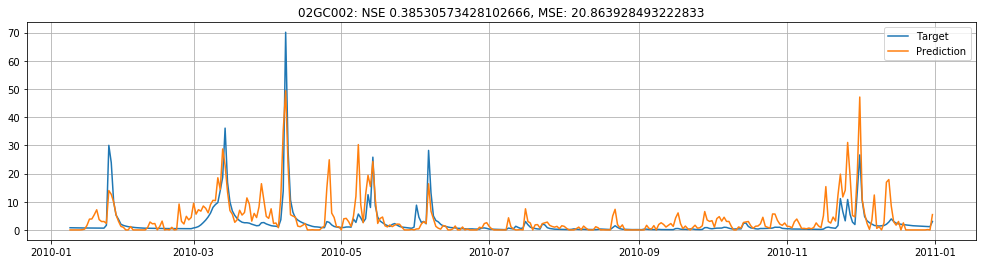

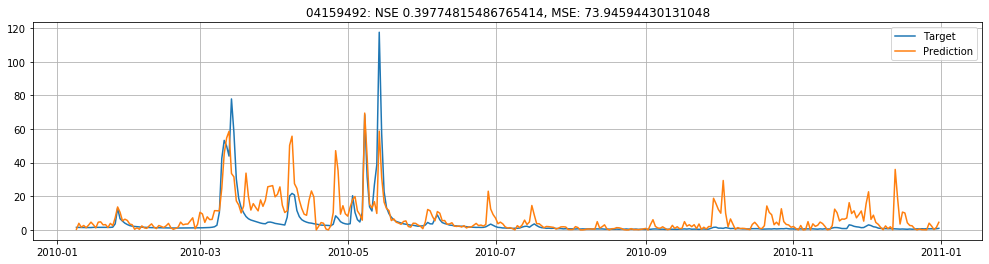

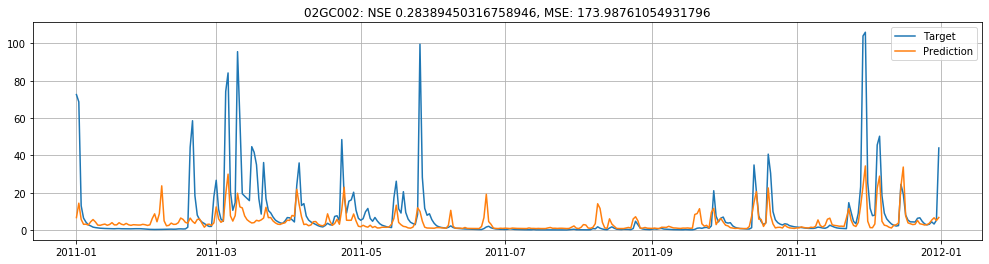

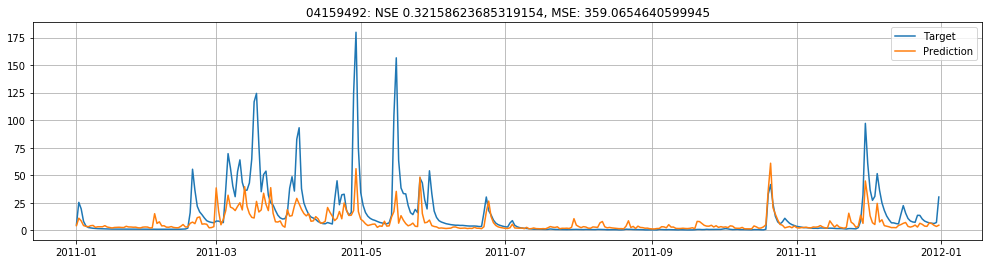

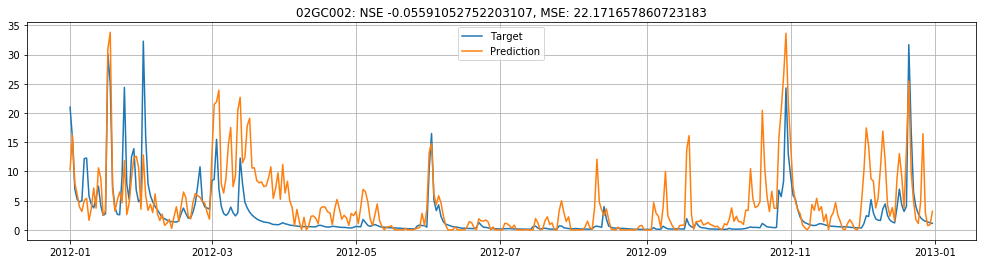

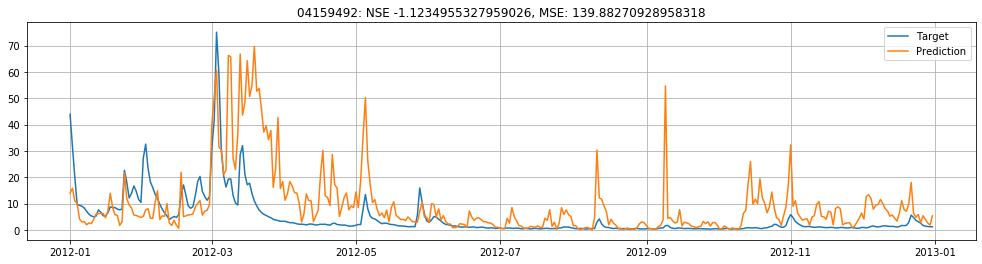

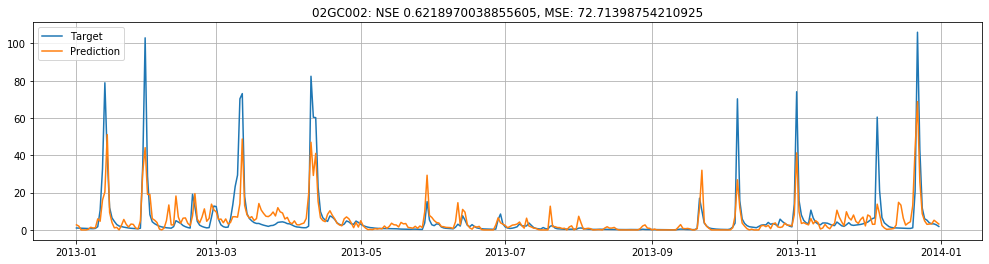

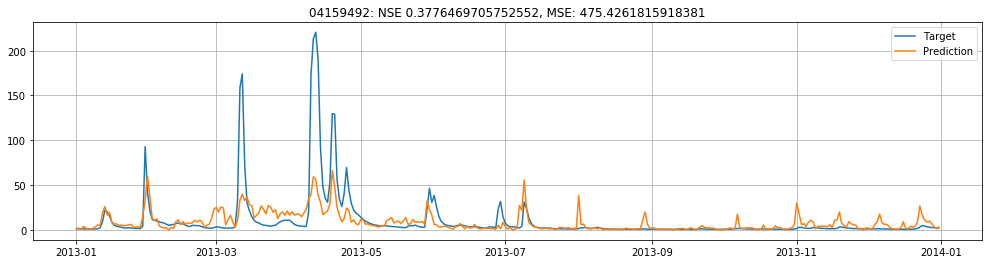

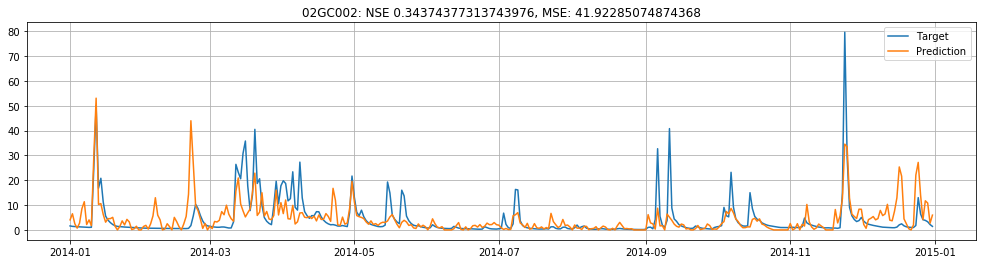

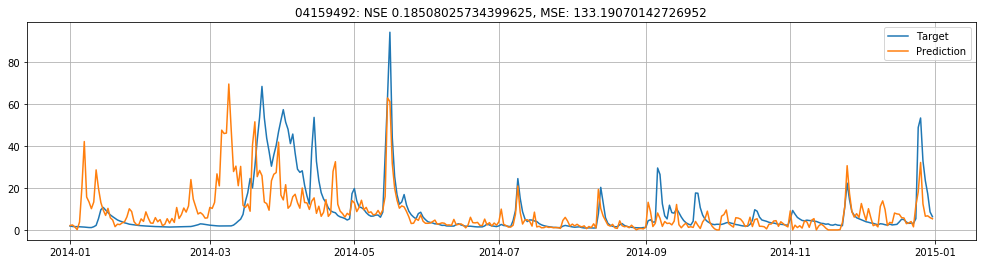

In [3]:
# Create test and train splits for each station (by time), then create predictions for each subbasin
history = 7
data_start = datetime.strptime('2010-01-01', '%Y-%m-%d') + timedelta(days=history + 1)
test_starts = [data_start, '2011-01-01', '2012-01-01', '2013-01-01', '2014-01-01']
test_ends = ['2010-12-31', '2011-12-31', '2012-12-31', '2013-12-31', '2014-12-31']

validation_fraction = 0.1

plot_list = ['04159492', '02GC002']
median_nse_mse_list = []
for cv_iter in range(len(test_starts)):
    test_start, test_end = test_starts[cv_iter], test_ends[cv_iter]
    print('Test: {} - {}'.format(test_start, test_end))
    
    predictions = {}
    actuals = {}
    models = {}
    nse_list, mse_list = [], []
    for station in station_data_dict.keys():
        print(station)
        station_data = station_data_dict[station]

        station_train = station_data[(station_data.index < test_start) | (station_data.index > test_end)].copy()
        num_validation_samples = int(validation_fraction * station_train.shape[0])
        shuffle_indices = np.arange(station_train.shape[0])
        np.random.shuffle(shuffle_indices)
        station_train = station_train.iloc[shuffle_indices]
        station_val, station_train = station_train.iloc[:num_validation_samples].copy(), station_train.iloc[num_validation_samples:].copy()

        station_test = station_data.loc[test_start:test_end]
        print('Shapes: train {}, val {}, test {}'.format(station_train.shape, station_val.shape, station_test.shape))

        station_val = [(station_train.drop(['station', 'runoff'], axis=1), station_train['runoff']), 
                       (station_val.drop(['station', 'runoff'], axis=1), station_val['runoff'])]

        m = pickle.load(open('../../pickle/models/XGBoost_VIC_aggregateForcings_{}_20190705-084937.pkl'.format(station), 'rb'))  # Load model with parameters found in RandomSearchCV
        m = m.best_estimator_
        print(m)
        
        m.fit(station_train.drop(['station', 'runoff'], axis=1), station_train['runoff'], eval_set=station_val, eval_metric='rmse', early_stopping_rounds=100)
        
        station_test = station_test[~pd.isna(station_test['runoff'])]
        if len(station_test) == 0:
            print('Skipping', station)
            continue

        predict = pd.DataFrame(index=station_test.index)
        predict = predict.join(station_test.drop(['station', 'runoff'], axis=1))
        predict['runoff'] = np.nan
        predict['runoff'] = m.predict(predict.drop('runoff', axis=1))

        predictions['cv{}_{}'.format(cv_iter, station)] = predict[['runoff']]
        actuals['cv{}_{}'.format(cv_iter, station)] = station_test['runoff']
        models['cv{}_{}'.format(cv_iter, station)] = m
        
        nse, mse = evaluate.evaluate_daily(station, predict[['runoff']], station_test['runoff'], plot=station in plot_list)
        nse_list.append(nse)
        mse_list.append(mse)
    
    median_nse_mse_list.append((np.median(nse_list), np.median(mse_list)))
    print('Median NSE: {}\tMSE: {}'.format(*median_nse_mse_list[-1]))

In [4]:
median_nse_mse_list

[(0.3244158101632658, 58.948554313404074),
 (0.42947333966354884, 169.16986110836032),
 (0.1059473935981135, 45.206651629761794),
 (0.5338794456226676, 96.0085170204542),
 (0.3702868375630135, 80.08568266800492)]

In [5]:
print('Median NSE: {}\t, MSE: {}'.format(np.median(list(zip(*median_nse_mse_list))[0]), np.median(list(zip(*median_nse_mse_list))[1])))

Median NSE: 0.3702868375630135	, MSE: 80.08568266800492


In [ ]:
load_data.pickle_results('XGBoost_VIC_aggregateForcings_CV', (predictions, actuals), time_stamp)

In [ ]:
for station, model in models.items():
    load_data.pickle_model('XGBoost_VIC_aggregateForcings_CV', model, station, time_stamp, model_type='xgb')